In [1]:
import time
import os
import sys
from imp import reload
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import tensorflow.keras as keras
from tensorflow.keras.datasets import mnist

# Setup the directories
cwd = os.getcwd()
OK_DIR = os.path.dirname(cwd)
DATA_PATH = 'outputs\\'

sys.path.append(os.path.join(OK_DIR, 'python'))
import ok
import dac_control as dac
import adc_control as adc
import spi_control as spi
import wupdate_control as wupdate
import neuron_control as neuron
import matmul
import nn_layers as nn


# Set the matplotlib default settings
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

In [118]:
# Set the DAC reference voltages
VDD = 5.0
dac.DAC_VREFS[3] = VDD
adc.C_INTEG = 1e-9


# Open the front panel API
dev = ok.okCFrontPanel()
print(dev.GetDeviceCount())
print(dev.GetDeviceListSerial(0))
print(dev.GetDeviceListSerial(1))
status = dev.OpenBySerial("1903000OQE")
print(status)

1
1903000OQE

0


In [3]:
status = dev.ConfigureFPGA(OK_DIR + "/HDL/neurram_48core/neurram_top.bit")
print(status)

0


In [1636]:
# Global reset
dev.SetWireInValue(0x00, 0b11)
dev.UpdateWireIns()
dev.SetWireInValue(0x00, 0b00)
dev.UpdateWireIns()

0

In [ ]:
die_info = np.load(OK_DIR + '/python/die_info.npy', allow_pickle=True).item()

In [119]:
for i in range(100):
    inp = np.random.binomial(n=2, p=0.5, size=[1,512])-1
    spi.spi_write(dev, row_addr=[0], forward=True, inputs=inp, shift_multiplier=1, pipe_in_steps=2, is_pipe_in=True)
    out = spi.spi_read(dev, row_addr=[0], num_words=32, forward=False, shift_multiplier=1, pipe_out_steps=2, is_pipe_out=True)
    if not (inp == out).all():
        print(i)
        print(inp)
        print(out)
        break

# Load Model

In [2]:
# input image dimensions
img_rows, img_cols = 28, 28
num_classes = 10

# the data, split between train and test sets
(X_train, y_train), (X_test, y_test) = mnist.load_data()

X_train = X_train.reshape(X_train.shape[0], img_rows, img_cols, 1)
X_test = X_test.reshape(X_test.shape[0], img_rows, img_cols, 1)
input_shape = (img_rows, img_cols, 1)

X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255
X_test /= 255
print('X_train shape:', X_train.shape)
print(X_train.shape[0], 'train samples')
print(X_test.shape[0], 'test samples')

# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

X_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples


In [7]:
tmp = np.load('rbm_checkpoints\\v794_h120_label_50epoch_weight_decay_1e-4_momemtum_clip_fix_grad_wnoise0.20.npz')
W = tmp['W']
a = tmp['a']
b = tmp['b']
w_max = tmp['w_max']

In [8]:
W = np.clip(W, -w_max, w_max)
a = np.clip(a, -16, 16)
W_orig = W

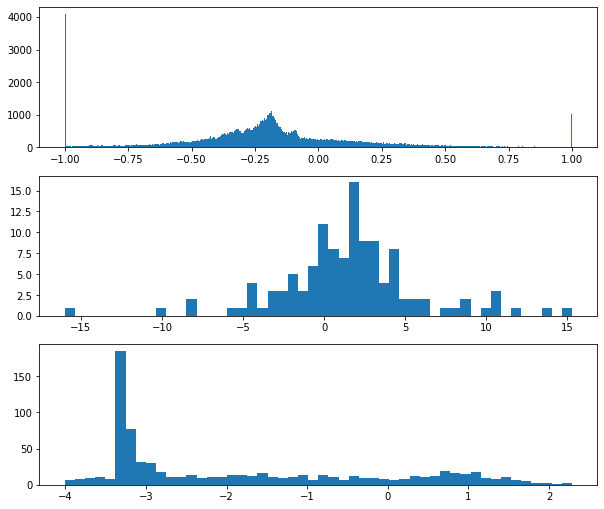

In [9]:
plt.figure(figsize=(10,15))

plt.subplot(5,1,1)
bins = 500 #np.linspace(-0.1, 0.1, 100)
h = plt.hist(W.flatten(), bins, label='W')

plt.subplot(5,1,2)
h = plt.hist(a.flatten(), 50, label='a')
plt.subplot(5,1,3)
h = plt.hist(b.flatten(), 50, label='b')

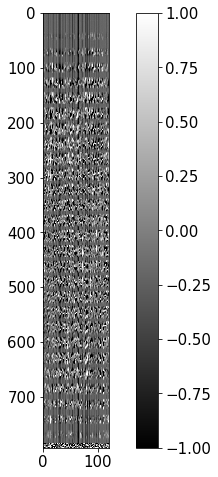

In [96]:
# plt.imshow(W)

 # Plot the heatmap
# fig = plt.figure(figsize=(8,8))
ax = plt.gca()
im = ax.imshow(W)

# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
# cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

In [7]:
# Define functions

def reshape_flatten(X, size):
    N, H, W, _ = X.shape 
    return X.reshape([N, -1])


def sigm(x, T=1, bipolar=True):
    y = 1/(1 + np.exp(-x/T))
    return y


def sample(x):
    return np.random.binomial(n=1, p=x)


def infer(X, W, a, sigm_T=1, activated=True, offset=0.0):
    Y = X.dot(W) + a
    Y = Y + offset
    if activated:
        Y = sigm(Y, sigm_T)
    return Y


def generate(H, W, b, sigm_T=1, activated=True, offset=0.0):
    Y = H.dot(W.T) + b
    Y = Y + offset
    if activated:
        Y = sigm(Y, sigm_T)
    return Y


def plot(samples, size, name):
    size = int(size)
    fig = plt.figure(figsize=(4, 4))
    gs = gridspec.GridSpec(4, 4)
    gs.update(wspace=0.05, hspace=0.05)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(sample.reshape(size, size), cmap='Greys_r')
        

def plot_shape(samples, size, figsize, grid):
    size = int(size)
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(grid[0], grid[1])
    gs.update(wspace=0.05, hspace=0.05)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(sample.reshape(size, size), cmap='Greys_r')
        

def plot_single(sample, size, name):
    size = int(size)
    fig = plt.figure(figsize=(4, 4))

    ax = plt.subplot(111)
    plt.axis('off')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal')
    plt.imshow(sample.reshape(size, size), cmap='Greys_r')

        
def corrupt_partial(x, loc='bottom', gray=0.0):
    x_c = np.copy(x)
    if loc == 'bottom':
        c_idx = int(length_d/3)*2 * length_d
        x_c[:, int(c_idx):] = gray
    elif loc == 'middle':
        x_c[:, int(length_d/3)*1 * length_d : int(length_d/3)*2 * length_d] = gray
    elif loc == 'top':
        x_c[:, :int(length_d/3)*1 * length_d] = gray
    return x_c


def recover_partial(x, x_target, loc='bottom'):
    if len(x.shape) == 1:
        if loc == 'bottom':
            c_idx = int(length_d/3)*2 * length_d
            x[:int(c_idx)] = x_target[:int(c_idx)]
        elif loc == 'middle':
            x[int(length_d/3)*2 * length_d: length_d**2] = x_target[int(length_d/3)*2 * length_d: length_d**2]
            x[:int(length_d/3)*1 * length_d] = x_target[:int(length_d/3)*1 * length_d]
        elif loc == 'top':
            x[int(length_d/3)*1 * length_d: length_d**2] = x_target[int(length_d/3)*1 * length_d: length_d**2]
    elif len(x.shape) == 2:
        if loc == 'bottom':
            c_idx = int(length_d/3)*2 * length_d
            x[:, :int(c_idx)] = x_target[:, :int(c_idx)]
        elif loc == 'middle':
            x[:, int(length_d/3)*2 * length_d:length_d**2] = x_target[:, int(length_d/3)*2 * length_d:length_d**2]
            x[:, :int(length_d/3)*1 * length_d] = x_target[:, :int(length_d/3)*1 * length_d]
        elif loc == 'top':
            x[:, int(length_d/3)*1 * length_d:length_d**2] = x_target[:, int(length_d/3)*1 * length_d:length_d**2]
    return x

def corrupt_random(x, p, mask=None):
    x_c = np.copy(x)
    if mask is None:
        mask = np.random.binomial(n=1, p=p, size=x_c.shape).astype(bool)
    x_c[mask] = (x[mask] < 0.7).astype(np.float32)
    return (x_c, mask)


def recover_random(x, x_target, mask):
    x[:, :x_target.shape[1]][~mask] = x_target[~mask]
    return x

In [497]:
print(logit(0.82) / logit(0.52))
print((0.82-0.5) / 0.02)

13.067630838386817
12.0


Reconstruction error is 12.198558


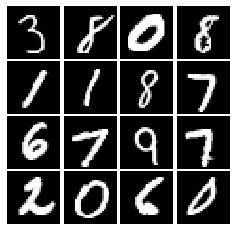

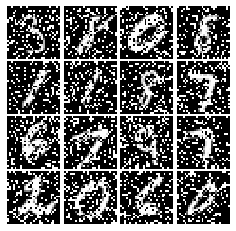

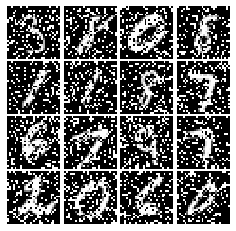

In [9]:
mb_size = 10000
GIBBS_STEPS = 3
LABEL = True
SIGM_T = 1.0
CORRUPT_PART = 'random'
RESTART = True
WEIGHT_NOISE = None
SAMPLE_VISIBLE = True
DETERMINISTIC_SAMPLE = False
FIX_LABEL = True
RECOVER = True

length_d = 28
X_dim_d = int(length_d**2)
if LABEL:
    X_dim_d = X_dim_d + 10

# if WEIGHT_NOISE is None:
#     W = W_orig
# else:
#     W = W_orig + np.random.normal(scale=WEIGHT_NOISE, size=W.shape)
    
if RESTART:
    if RECOVER:
        idx = np.random.choice(np.arange(X_test.shape[0]), size=mb_size, replace=False)
        X_mb = X_train[idx, :, :, :]
        y_mb = y_train[idx, :]
        X_mb = (reshape_flatten(X_mb, length_d)).astype(np.float)
        plot(X_mb[:16], length_d, 'V')
        if CORRUPT_PART == 'random':
            V, mask = corrupt_random(X_mb, 0.2)
        else:
            V = corrupt_partial(X_mb, loc=CORRUPT_PART, gray=np.mean(X_mb))
    else:
        V = np.random.binomial(n=1, p=0.5, size=[16, length_d**2])
        
    plot(V[:16], length_d, 'V_corrupted')    
    if LABEL:
        if FIX_LABEL:
            label_vector = y_mb
        else:
            label_vector = 0.1 * np.ones([mb_size, 10])
        V = np.concatenate([V, label_vector], axis=1)


# for g in range(GIBBS_STEPS):
#     if SAMPLE_VISIBLE:
#         if DETERMINISTIC_SAMPLE:
#             V = (V > 0.5).astype(np.float64)
#         else:
#             V = sample(V).astype(np.float64)
#     H = infer(V, W, a, sigm_T=SIGM_T)
#     if DETERMINISTIC_SAMPLE:
#         H = (H > 0.5).astype(np.float64)
#     else:
#         H = sample(H)

#     V = generate(H, W, b, sigm_T=SIGM_T)

#     if RECOVER:
#         if CORRUPT_PART == 'random':
#              V = recover_random(V, X_mb, mask)
#         else:
#             V = recover_partial(V, X_mb, loc=CORRUPT_PART)
#     if FIX_LABEL:
#         V[:, int(length_d**2):] = y_mb

# if LABEL:
#     class_pred = np.argmax(V[:, X_dim_d-10:], axis=1)
# #     print(class_pred)
#     correct_pred = np.argmax(y_mb, axis=1)
#     test_acc = np.sum(class_pred == correct_pred) / float(correct_pred.size)
#     print('Test accuracy is %f' % test_acc)
# #     V = V[:,:int(length_d**2)]

err = np.mean(np.linalg.norm(V[:,:int(length_d**2)] - X_mb, axis=1))
print('Reconstruction error is %f' % err)
plot(V[:16,:int(length_d**2)], length_d, 'V')

(1000, 794)
(1000, 120)


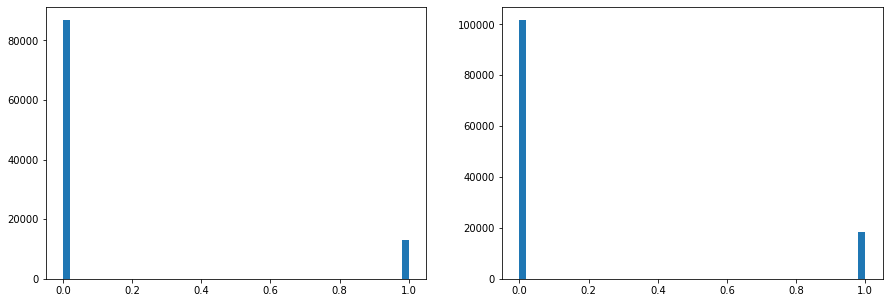

In [58]:
V_cal = sample(V).astype(np.float64)
H_cal = H
print(V_cal.shape)
print(H_cal.shape)
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.hist(V_cal[:, segment_idx].flatten(), 50);
plt.subplot(122)
plt.hist(H_cal.flatten(), 50);

# Weight Mapping

In [2]:
weight_mapping_table = np.load('weight_mapping_table.npy', allow_pickle=True)

In [14]:
num_rram = 0
for core_row in weight_mapping_table:
    for core in core_row:
        num_rram += core['rows'].size * core['cols'].size
print(num_rram // 2)

200880


In [20]:
200880 / 256 / 256 / 8

0.383148193359375

In [14]:
g_max = 3e-5
g_min = 1e-6
g_tol = 1e-6
w_max = 1
scale = g_max / w_max

In [227]:
HEIGHT, WIDTH = W.shape
num_a = 2
num_b = 2
segment_r = 1
segment_c = 0

segment_idx = (np.arange(14) * 56 + segment_r // 4 * 28).reshape([14, 1]) + np.arange(7) * 4 + segment_r % 4
segment_idx = segment_idx.flatten()
if segment_r < 2:
    segment_idx = np.hstack([segment_idx, np.arange(2) + segment_r*2 + 784])
else:
    segment_idx = np.append(segment_idx, 786 + segment_r)

W_seg = W[segment_idx, WIDTH//2*segment_c : WIDTH//2*(segment_c+1)]
a_seg = a[WIDTH//2*segment_c : WIDTH//2*(segment_c+1)] / 8 / num_a 
b_seg = b[segment_idx] / 2 / num_b

W_h = segment_idx.size * 2
W_l = WIDTH
G = np.zeros([W_h + num_a*2, W_l + num_b*2])

G_pos_W = W_seg * (W_seg>0) * scale
G_neg_W = -W_seg * (W_seg<0) * scale
G_pos_a = a_seg * (a_seg>0) * scale
G_neg_a = -a_seg * (a_seg<0) * scale
G_pos_b = b_seg * (b_seg>0) * scale
G_neg_b = -b_seg * (b_seg<0) * scale

G[0:W_h:2, 0:W_l:2] = G_pos_W
G[1:W_h:2, 1:W_l:2] = G_pos_W
G[0:W_h:2, 1:W_l:2] = G_neg_W
G[1:W_h:2, 0:W_l:2] = G_neg_W
G[W_h::2, 0:W_l:2] = np.tile(G_pos_a, [num_a, 1])
G[W_h+1::2, 1:W_l:2] = np.tile(G_pos_a, [num_a, 1])
G[W_h::2, 1:W_l:2] = np.tile(G_neg_a, [num_a, 1])
G[W_h+1::2, 0:W_l:2] = np.tile(G_neg_a, [num_a, 1])
G[0:W_h:2, W_l::2] = np.tile(G_pos_b, [num_b, 1]).T
G[1:W_h:2, W_l+1::2] = np.tile(G_pos_b, [num_b, 1]).T
G[0:W_h:2, W_l+1::2] = np.tile(G_neg_b, [num_b, 1]).T
G[1:W_h:2, W_l::2] = np.tile(G_neg_b, [num_b, 1]).T

G = G.T

In [804]:
chip = 2
core_row = 1
core_col = 5
core = die_info[chip][core_row][core_col]
bad_rows = np.hstack([core['unformed'], core['leaky']])
bad_cols = []
if 'bad_cols' in core:
    bad_cols = core['bad_cols']
rows = np.delete(np.arange(256), bad_rows)[:G.shape[0]]
cols = np.delete(np.arange(256), bad_cols)[:G.shape[1]]

C:\Users\Weier Wan\.conda\envs\py36\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: using a non-integer array as obj in delete will result in an error in the future
  if __name__ == '__main__':


In [228]:
core_mapping = weight_mapping_table[segment_r][segment_c]
chip = core_mapping['chip']
core_row = core_mapping['core_row']
core_col = core_mapping['core_col']
rows = core_mapping['rows']
cols = core_mapping['cols']
print((core_row, core_col))

(2, 4)


In [1706]:
print((core_row, core_col))
core = die_info[chip][core_row][core_col]
bad_rows = np.hstack([core['unformed'], core['leaky']])
bad_cols = []
if 'bad_cols' in core:
    bad_cols = core['bad_cols']
# rows_unused = np.delete(np.arange(256), bad_rows)[G.shape[0]:208]
# cols_unused = np.delete(np.arange(256), bad_cols)[G.shape[1]:248]
rows_unused = [r for r in np.arange(rows.max()+1, 256) if r not in bad_rows]
cols_unused = [c for c in np.arange(cols.max()+1, 256) if c not in bad_cols]

(3, 1)


In [807]:
core_mapping = {'chip':chip, 'core_row':core_row, 'core_col':core_col, 'rows':rows, 'cols':cols}
weight_mapping_table[7].append(core_mapping)

In [172]:
np.save('weight_mapping_table', weight_mapping_table)

In [167]:
bad_rows = []
bad_cols = []

core_info = die_info[chip][core_row][core_col]
bad_rows = np.hstack([core_info['unformed'], core_info['leaky']])
if 'bad_cols' in core_info:
    bad_cols = core_info['bad_cols']

In [168]:
for i in error_rows:
    while True:
        rows[i] = rows.max() + 1
        if rows[i] not in bad_rows:
            break

In [169]:
adc.adc_setup(dev, vread=1.1, vref=0.9)
wupdate.ramp_up_voltage(dev, 3, 0, 1.2)
wupdate.ramp_up_voltage(dev, 3, 1, 3.0)
wupdate.ramp_up_voltage(dev, 3, 2, 2.5)
spi.enable_single_core(dev, core_row, core_col)

# program_sucess, G_program, num_pulses, _ = wupdate.program_array(
#     dev, rows[113:114], cols[:], core_row, core_col, G[113:114, 119:120], g_min, g_tol, 1, end_voltage=4.0, vread=1.1, vref=0.9, vset_wl=3.0, iteration_limit=30)


program_sucess, G_program, num_pulses, _ = wupdate.program_array(
    dev, rows[error_rows], cols[:], core_row, core_col, G[error_rows, :], g_min, g_tol, 1, end_voltage=4.0, vread=1.1, vref=0.9, vset_wl=3.0, iteration_limit=30)

# program_sucess, G_program, num_pulses, _ = wupdate.program_array(
#     dev, rows[error_rows], cols[:], core_row, core_col, np.zeros([len(error_rows), len(cols)]), g_min, g_tol, 1, end_voltage=4.0, vread=1.1, vref=0.9, vset_wl=3.0, iteration_limit=30)

# program_sucess, G_program, num_pulses, _ = wupdate.program_array(
#     dev, rows, [158], core_row, core_col, np.zeros([len(rows), 1]), g_min, g_tol, 1, end_voltage=4.0, vread=1.1, vref=0.9, vset_wl=3.0, iteration_limit=30)

RRAM is programmed within the range.
Finished programming 135 row 0 col
RRAM is programmed within the range.
Finished programming 135 row 1 col
RRAM is programmed within the range.
Finished programming 135 row 2 col
RRAM is programmed within the range.
Finished programming 135 row 3 col
RRAM is programmed within the range.
Finished programming 135 row 4 col
RRAM is programmed within the range.
Finished programming 135 row 5 col
RRAM is programmed within the range.
Finished programming 135 row 6 col
RRAM is programmed within the range.
Finished programming 135 row 7 col
RRAM is programmed within the range.
Finished programming 135 row 8 col
RRAM is programmed within the range.
Finished programming 135 row 9 col
RRAM is programmed within the range.
Finished programming 135 row 10 col
RRAM is programmed within the range.
Finished programming 135 row 11 col
RRAM is programmed within the range.
Finished programming 135 row 12 col
RRAM is programmed within the range.
Finished programming 135

RRAM is programmed within the range.
Finished programming 135 row 115 col
RRAM is programmed within the range.
Finished programming 135 row 116 col
RRAM is programmed within the range.
Finished programming 135 row 117 col
RRAM is programmed within the range.
Finished programming 135 row 118 col
RRAM is programmed within the range.
Finished programming 135 row 119 col
RRAM is programmed within the range.
Finished programming 135 row 120 col
RRAM is programmed within the range.
Finished programming 135 row 121 col
RRAM is programmed within the range.
Finished programming 135 row 122 col
RRAM is programmed within the range.
Finished programming 135 row 123 col
RRAM is programmed within the range.
Finished programming 135 row 124 col
RRAM is programmed within the range.
Finished programming 135 row 125 col
RRAM is programmed within the range.
Finished programming 135 row 126 col
RRAM is programmed within the range.
Finished programming 135 row 127 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 136 row 28 col
RRAM is programmed within the range.
Finished programming 136 row 29 col
RRAM is programmed within the range.
Finished programming 136 row 30 col
RRAM is programmed within the range.
Finished programming 136 row 31 col
RRAM is programmed within the range.
Finished programming 136 row 32 col
RRAM is programmed within the range.
Finished programming 136 row 33 col
RRAM is programmed within the range.
Finished programming 136 row 34 col
RRAM is programmed within the range.
Finished programming 136 row 35 col
RRAM is programmed within the range.
Finished programming 136 row 36 col
RRAM is programmed within the range.
Finished programming 136 row 37 col
RRAM is programmed within the range.
Finished programming 136 row 38 col
RRAM is programmed within the range.
Finished programming 136 row 39 col
RRAM is programmed within the range.
Finished programming 136 row 40 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 136 row 140 col
RRAM is programmed within the range.
Finished programming 136 row 141 col
RRAM is programmed within the range.
Finished programming 136 row 142 col
RRAM is programmed within the range.
Finished programming 136 row 143 col
RRAM is programmed within the range.
Finished programming 136 row 144 col
RRAM is programmed within the range.
Finished programming 136 row 145 col
RRAM is programmed within the range.
Finished programming 136 row 146 col
RRAM is programmed within the range.
Finished programming 136 row 147 col
RRAM is programmed within the range.
Finished programming 136 row 148 col
RRAM is programmed within the range.
Finished programming 136 row 149 col
RRAM is programmed within the range.
Finished programming 136 row 150 col
RRAM is programmed within the range.
Finished programming 136 row 151 col
RRAM is programmed within the range.
Finished programming 136 row 152 col
RRAM is programmed within the range.
F

In [1835]:
print((core_row, core_col))
print(np.sum(~program_sucess)/program_sucess.size)
print(np.argwhere(~program_sucess))
print(G[:, :][~program_sucess])
print(G_program[~program_sucess])

(1, 5)
0.0009980836793356755
[[  3 147]
 [  4 151]
 [ 10 197]
 [ 33   4]
 [ 35  24]
 [ 35  54]
 [ 35 186]
 [ 45 201]
 [ 48  85]
 [ 53 172]
 [ 66 108]
 [ 75 124]
 [ 87  16]
 [ 98 157]
 [102 104]
 [107  52]
 [107 103]
 [108  74]
 [110 117]
 [110 139]
 [114 172]
 [119  74]
 [121 162]
 [122 195]
 [123   0]]
[ 9.39314340e-06  1.70240167e-05  2.37796363e-05 -0.00000000e+00
  1.85883153e-05  1.43540253e-05  1.57859266e-05  1.56535767e-05
  1.64936871e-05  2.03865364e-05  1.50610489e-05  1.02653961e-05
  1.11660295e-05  2.22829045e-05  1.71302949e-05  1.72731523e-05
  2.18145640e-05  1.49738128e-05  2.58216515e-05  9.75536966e-06
  1.02491833e-05  2.50768282e-05  1.11882168e-05  2.52295809e-05
  2.52429204e-05]
[1.99479675e-05 3.55746460e-05 3.34567261e-05 1.06632710e-06
 2.00416565e-05 2.53378296e-05 2.18833923e-05 2.14904785e-05
 2.04446411e-05 3.16851807e-05 2.67248535e-05 2.63824463e-05
 1.73542786e-05 3.27758789e-05 1.82460022e-05 2.40884399e-05
 2.49105835e-05 3.18865967e-05 2.86315918e-

In [1482]:
# Program unused cells to HRS

program_sucess, G_program, _, _ = wupdate.program_array(
    dev, rows_unused, cols, core_row, core_col, np.zeros([len(rows_unused), len(cols)]), g_min, g_tol, 1, end_voltage=4.0, vread=1.1, vref=0.9, vset_wl=3.0, iteration_limit=10)

program_sucess, G_program, _, _ = wupdate.program_array(
    dev, rows, cols_unused, core_row, core_col, np.zeros([len(rows), len(cols_unused)]), g_min, g_tol, 1, end_voltage=4.0, vread=1.1, vref=0.9, vset_wl=3.0, iteration_limit=10)

program_sucess, G_program, _, _ = wupdate.program_array(
    dev, rows_unused, cols_unused, core_row, core_col, np.zeros([len(rows_unused), len(cols_unused)]), g_min, g_tol, 1, end_voltage=4.0, vread=1.1, vref=0.9, vset_wl=3.0, iteration_limit=10)

RRAM is programmed within the range.
Finished programming 135 row 0 col
RRAM is programmed within the range.
Finished programming 135 row 1 col
RRAM is programmed within the range.
Finished programming 135 row 2 col
RRAM is programmed within the range.
Finished programming 135 row 3 col
RRAM is programmed within the range.
Finished programming 135 row 4 col
RRAM is programmed within the range.
Finished programming 135 row 5 col
RRAM is programmed within the range.
Finished programming 135 row 6 col
RRAM is programmed within the range.
Finished programming 135 row 7 col
RRAM is programmed within the range.
Finished programming 135 row 8 col
RRAM is programmed within the range.
Finished programming 135 row 9 col
RRAM is programmed within the range.
Finished programming 135 row 10 col
RRAM is programmed within the range.
Finished programming 135 row 11 col
RRAM is programmed within the range.
Finished programming 135 row 12 col
RRAM is programmed within the range.
Finished programming 135

RRAM is programmed within the range.
Finished programming 135 row 113 col
RRAM is programmed within the range.
Finished programming 135 row 114 col
RRAM is programmed within the range.
Finished programming 135 row 115 col
RRAM is programmed within the range.
Finished programming 135 row 116 col
RRAM is programmed within the range.
Finished programming 135 row 117 col
RRAM is programmed within the range.
Finished programming 135 row 118 col
RRAM is programmed within the range.
Finished programming 135 row 119 col
RRAM is programmed within the range.
Finished programming 135 row 120 col
RRAM is programmed within the range.
Finished programming 135 row 121 col
RRAM is programmed within the range.
Finished programming 135 row 122 col
RRAM is programmed within the range.
Finished programming 135 row 123 col
RRAM is programmed within the range.
Finished programming 135 row 124 col
RRAM is programmed within the range.
Finished programming 135 row 125 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 137 row 21 col
RRAM is programmed within the range.
Finished programming 137 row 22 col
RRAM is programmed within the range.
Finished programming 137 row 23 col
RRAM is programmed within the range.
Finished programming 137 row 24 col
RRAM is programmed within the range.
Finished programming 137 row 25 col
RRAM is programmed within the range.
Finished programming 137 row 26 col
RRAM is programmed within the range.
Finished programming 137 row 27 col
RRAM is programmed within the range.
Finished programming 137 row 28 col
RRAM is programmed within the range.
Finished programming 137 row 29 col
RRAM is programmed within the range.
Finished programming 137 row 30 col
RRAM is programmed within the range.
Finished programming 137 row 31 col
RRAM is programmed within the range.
Finished programming 137 row 32 col
RRAM is programmed within the range.
Finished programming 137 row 33 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 137 row 133 col
RRAM is programmed within the range.
Finished programming 137 row 134 col
RRAM is programmed within the range.
Finished programming 137 row 135 col
RRAM is programmed within the range.
Finished programming 137 row 136 col
RRAM is programmed within the range.
Finished programming 137 row 137 col
RRAM is programmed within the range.
Finished programming 137 row 138 col
RRAM is programmed within the range.
Finished programming 137 row 139 col
RRAM is programmed within the range.
Finished programming 137 row 140 col
RRAM is programmed within the range.
Finished programming 137 row 141 col
RRAM is programmed within the range.
Finished programming 137 row 142 col
RRAM is programmed within the range.
Finished programming 137 row 143 col
RRAM is programmed within the range.
Finished programming 137 row 144 col
RRAM is programmed within the range.
Finished programming 137 row 145 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 138 row 41 col
RRAM is programmed within the range.
Finished programming 138 row 42 col
RRAM is programmed within the range.
Finished programming 138 row 43 col
RRAM is programmed within the range.
Finished programming 138 row 44 col
RRAM is programmed within the range.
Finished programming 138 row 45 col
RRAM is programmed within the range.
Finished programming 138 row 46 col
RRAM is programmed within the range.
Finished programming 138 row 47 col
RRAM is programmed within the range.
Finished programming 138 row 48 col
RRAM is programmed within the range.
Finished programming 138 row 49 col
RRAM is programmed within the range.
Finished programming 138 row 50 col
RRAM is programmed within the range.
Finished programming 138 row 51 col
RRAM is programmed within the range.
Finished programming 138 row 52 col
RRAM is programmed within the range.
Finished programming 138 row 53 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 138 row 153 col
RRAM is programmed within the range.
Finished programming 138 row 154 col
RRAM is programmed within the range.
Finished programming 138 row 155 col
RRAM is programmed within the range.
Finished programming 138 row 156 col
RRAM is programmed within the range.
Finished programming 138 row 157 col
RRAM is programmed within the range.
Finished programming 138 row 158 col
RRAM is programmed within the range.
Finished programming 138 row 159 col
RRAM is programmed within the range.
Finished programming 138 row 160 col
RRAM is programmed within the range.
Finished programming 138 row 161 col
RRAM is programmed within the range.
Finished programming 138 row 162 col
RRAM is programmed within the range.
Finished programming 138 row 163 col
RRAM is programmed within the range.
Finished programming 138 row 164 col
RRAM is programmed within the range.
Finished programming 138 row 165 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 140 row 61 col
RRAM is programmed within the range.
Finished programming 140 row 62 col
RRAM is programmed within the range.
Finished programming 140 row 63 col
RRAM is programmed within the range.
Finished programming 140 row 64 col
RRAM is programmed within the range.
Finished programming 140 row 65 col
RRAM is programmed within the range.
Finished programming 140 row 66 col
RRAM is programmed within the range.
Finished programming 140 row 67 col
RRAM is programmed within the range.
Finished programming 140 row 68 col
RRAM is programmed within the range.
Finished programming 140 row 69 col
RRAM is programmed within the range.
Finished programming 140 row 70 col
RRAM is programmed within the range.
Finished programming 140 row 71 col
RRAM is programmed within the range.
Finished programming 140 row 72 col
RRAM is programmed within the range.
Finished programming 140 row 73 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 140 row 173 col
RRAM is programmed within the range.
Finished programming 140 row 174 col
RRAM is programmed within the range.
Finished programming 140 row 175 col
RRAM is programmed within the range.
Finished programming 140 row 176 col
RRAM is programmed within the range.
Finished programming 140 row 177 col
RRAM is programmed within the range.
Finished programming 140 row 178 col
RRAM is programmed within the range.
Finished programming 140 row 179 col
RRAM is programmed within the range.
Finished programming 140 row 180 col
RRAM is programmed within the range.
Finished programming 140 row 181 col
RRAM is programmed within the range.
Finished programming 140 row 182 col
RRAM is programmed within the range.
Finished programming 140 row 183 col
RRAM is programmed within the range.
Finished programming 140 row 184 col
RRAM is programmed within the range.
Finished programming 140 row 185 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 141 row 81 col
RRAM is programmed within the range.
Finished programming 141 row 82 col
RRAM is programmed within the range.
Finished programming 141 row 83 col
RRAM is programmed within the range.
Finished programming 141 row 84 col
RRAM is programmed within the range.
Finished programming 141 row 85 col
RRAM is programmed within the range.
Finished programming 141 row 86 col
RRAM is programmed within the range.
Finished programming 141 row 87 col
RRAM is programmed within the range.
Finished programming 141 row 88 col
RRAM is programmed within the range.
Finished programming 141 row 89 col
RRAM is programmed within the range.
Finished programming 141 row 90 col
RRAM is programmed within the range.
Finished programming 141 row 91 col
RRAM is programmed within the range.
Finished programming 141 row 92 col
RRAM is programmed within the range.
Finished programming 141 row 93 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 141 row 192 col
RRAM is programmed within the range.
Finished programming 141 row 193 col
RRAM is programmed within the range.
Finished programming 141 row 194 col
RRAM is programmed within the range.
Finished programming 141 row 195 col
RRAM is programmed within the range.
Finished programming 141 row 196 col
RRAM is programmed within the range.
Finished programming 141 row 197 col
RRAM is programmed within the range.
Finished programming 141 row 198 col
RRAM is programmed within the range.
Finished programming 141 row 199 col
RRAM is programmed within the range.
Finished programming 141 row 200 col
RRAM is programmed within the range.
Finished programming 141 row 201 col
RRAM is programmed within the range.
Finished programming 141 row 202 col
RRAM is programmed within the range.
Finished programming 141 row 203 col
RRAM is programmed within the range.
Finished programming 142 row 0 col
RRAM is programmed within the range.
Fin

RRAM is programmed within the range.
Finished programming 142 row 101 col
RRAM is programmed within the range.
Finished programming 142 row 102 col
RRAM is programmed within the range.
Finished programming 142 row 103 col
RRAM is programmed within the range.
Finished programming 142 row 104 col
RRAM is programmed within the range.
Finished programming 142 row 105 col
RRAM is programmed within the range.
Finished programming 142 row 106 col
RRAM is programmed within the range.
Finished programming 142 row 107 col
RRAM is programmed within the range.
Finished programming 142 row 108 col
RRAM is programmed within the range.
Finished programming 142 row 109 col
RRAM is programmed within the range.
Finished programming 142 row 110 col
RRAM is programmed within the range.
Finished programming 142 row 111 col
RRAM is programmed within the range.
Finished programming 142 row 112 col
RRAM is programmed within the range.
Finished programming 142 row 113 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 143 row 8 col
RRAM is programmed within the range.
Finished programming 143 row 9 col
RRAM is programmed within the range.
Finished programming 143 row 10 col
RRAM is programmed within the range.
Finished programming 143 row 11 col
RRAM is programmed within the range.
Finished programming 143 row 12 col
RRAM is programmed within the range.
Finished programming 143 row 13 col
RRAM is programmed within the range.
Finished programming 143 row 14 col
RRAM is programmed within the range.
Finished programming 143 row 15 col
RRAM is programmed within the range.
Finished programming 143 row 16 col
RRAM is programmed within the range.
Finished programming 143 row 17 col
RRAM is programmed within the range.
Finished programming 143 row 18 col
RRAM is programmed within the range.
Finished programming 143 row 19 col
RRAM is programmed within the range.
Finished programming 143 row 20 col
RRAM is programmed within the range.
Finished program

RRAM is programmed within the range.
Finished programming 143 row 120 col
RRAM is programmed within the range.
Finished programming 143 row 121 col
RRAM is programmed within the range.
Finished programming 143 row 122 col
RRAM is programmed within the range.
Finished programming 143 row 123 col
RRAM is programmed within the range.
Finished programming 143 row 124 col
RRAM is programmed within the range.
Finished programming 143 row 125 col
RRAM is programmed within the range.
Finished programming 143 row 126 col
RRAM is programmed within the range.
Finished programming 143 row 127 col
RRAM is programmed within the range.
Finished programming 143 row 128 col
RRAM is programmed within the range.
Finished programming 143 row 129 col
RRAM is programmed within the range.
Finished programming 143 row 130 col
RRAM is programmed within the range.
Finished programming 143 row 131 col
RRAM is programmed within the range.
Finished programming 143 row 132 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 144 row 28 col
RRAM is programmed within the range.
Finished programming 144 row 29 col
RRAM is programmed within the range.
Finished programming 144 row 30 col
RRAM is programmed within the range.
Finished programming 144 row 31 col
RRAM is programmed within the range.
Finished programming 144 row 32 col
RRAM is programmed within the range.
Finished programming 144 row 33 col
RRAM is programmed within the range.
Finished programming 144 row 34 col
RRAM is programmed within the range.
Finished programming 144 row 35 col
RRAM is programmed within the range.
Finished programming 144 row 36 col
RRAM is programmed within the range.
Finished programming 144 row 37 col
RRAM is programmed within the range.
Finished programming 144 row 38 col
RRAM is programmed within the range.
Finished programming 144 row 39 col
RRAM is programmed within the range.
Finished programming 144 row 40 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 144 row 140 col
RRAM is programmed within the range.
Finished programming 144 row 141 col
RRAM is programmed within the range.
Finished programming 144 row 142 col
RRAM is programmed within the range.
Finished programming 144 row 143 col
RRAM is programmed within the range.
Finished programming 144 row 144 col
RRAM is programmed within the range.
Finished programming 144 row 145 col
RRAM is programmed within the range.
Finished programming 144 row 146 col
RRAM is programmed within the range.
Finished programming 144 row 147 col
RRAM is programmed within the range.
Finished programming 144 row 148 col
RRAM is programmed within the range.
Finished programming 144 row 149 col
RRAM is programmed within the range.
Finished programming 144 row 150 col
RRAM is programmed within the range.
Finished programming 144 row 151 col
RRAM is programmed within the range.
Finished programming 144 row 152 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 145 row 48 col
RRAM is programmed within the range.
Finished programming 145 row 49 col
RRAM is programmed within the range.
Finished programming 145 row 50 col
RRAM is programmed within the range.
Finished programming 145 row 51 col
RRAM is programmed within the range.
Finished programming 145 row 52 col
RRAM is programmed within the range.
Finished programming 145 row 53 col
RRAM is programmed within the range.
Finished programming 145 row 54 col
RRAM is programmed within the range.
Finished programming 145 row 55 col
RRAM is programmed within the range.
Finished programming 145 row 56 col
RRAM is programmed within the range.
Finished programming 145 row 57 col
RRAM is programmed within the range.
Finished programming 145 row 58 col
RRAM is programmed within the range.
Finished programming 145 row 59 col
RRAM is programmed within the range.
Finished programming 145 row 60 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 145 row 160 col
RRAM is programmed within the range.
Finished programming 145 row 161 col
RRAM is programmed within the range.
Finished programming 145 row 162 col
RRAM is programmed within the range.
Finished programming 145 row 163 col
RRAM is programmed within the range.
Finished programming 145 row 164 col
RRAM is programmed within the range.
Finished programming 145 row 165 col
RRAM is programmed within the range.
Finished programming 145 row 166 col
RRAM is programmed within the range.
Finished programming 145 row 167 col
RRAM is programmed within the range.
Finished programming 145 row 168 col
RRAM is programmed within the range.
Finished programming 145 row 169 col
RRAM is programmed within the range.
Finished programming 145 row 170 col
RRAM is programmed within the range.
Finished programming 145 row 171 col
RRAM is programmed within the range.
Finished programming 145 row 172 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 146 row 68 col
RRAM is programmed within the range.
Finished programming 146 row 69 col
RRAM is programmed within the range.
Finished programming 146 row 70 col
RRAM is programmed within the range.
Finished programming 146 row 71 col
RRAM is programmed within the range.
Finished programming 146 row 72 col
RRAM is programmed within the range.
Finished programming 146 row 73 col
RRAM is programmed within the range.
Finished programming 146 row 74 col
RRAM is programmed within the range.
Finished programming 146 row 75 col
RRAM is programmed within the range.
Finished programming 146 row 76 col
RRAM is programmed within the range.
Finished programming 146 row 77 col
RRAM is programmed within the range.
Finished programming 146 row 78 col
RRAM is programmed within the range.
Finished programming 146 row 79 col
RRAM is programmed within the range.
Finished programming 146 row 80 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 146 row 180 col
RRAM is programmed within the range.
Finished programming 146 row 181 col
RRAM is programmed within the range.
Finished programming 146 row 182 col
RRAM is programmed within the range.
Finished programming 146 row 183 col
RRAM is programmed within the range.
Finished programming 146 row 184 col
RRAM is programmed within the range.
Finished programming 146 row 185 col
RRAM is programmed within the range.
Finished programming 146 row 186 col
RRAM is programmed within the range.
Finished programming 146 row 187 col
RRAM is programmed within the range.
Finished programming 146 row 188 col
RRAM is programmed within the range.
Finished programming 146 row 189 col
RRAM is programmed within the range.
Finished programming 146 row 190 col
RRAM is programmed within the range.
Finished programming 146 row 191 col
RRAM is programmed within the range.
Finished programming 146 row 192 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 147 row 89 col
RRAM is programmed within the range.
Finished programming 147 row 90 col
RRAM is programmed within the range.
Finished programming 147 row 91 col
RRAM is programmed within the range.
Finished programming 147 row 92 col
RRAM is programmed within the range.
Finished programming 147 row 93 col
RRAM is programmed within the range.
Finished programming 147 row 94 col
RRAM is programmed within the range.
Finished programming 147 row 95 col
RRAM is programmed within the range.
Finished programming 147 row 96 col
RRAM is programmed within the range.
Finished programming 147 row 97 col
RRAM is programmed within the range.
Finished programming 147 row 98 col
RRAM is programmed within the range.
Finished programming 147 row 99 col
RRAM is programmed within the range.
Finished programming 147 row 100 col
RRAM is programmed within the range.
Finished programming 147 row 101 col
RRAM is programmed within the range.
Finished pro

RRAM is programmed within the range.
Finished programming 147 row 200 col
RRAM is programmed within the range.
Finished programming 147 row 201 col
RRAM is programmed within the range.
Finished programming 147 row 202 col
RRAM is programmed within the range.
Finished programming 147 row 203 col
RRAM is programmed within the range.
Finished programming 148 row 0 col
RRAM is programmed within the range.
Finished programming 148 row 1 col
RRAM is programmed within the range.
Finished programming 148 row 2 col
RRAM is programmed within the range.
Finished programming 148 row 3 col
RRAM is programmed within the range.
Finished programming 148 row 4 col
RRAM is programmed within the range.
Finished programming 148 row 5 col
RRAM is programmed within the range.
Finished programming 148 row 6 col
RRAM is programmed within the range.
Finished programming 148 row 7 col
RRAM is programmed within the range.
Finished programming 148 row 8 col
RRAM is programmed within the range.
Finished programmin

RRAM is programmed within the range.
Finished programming 148 row 109 col
RRAM is programmed within the range.
Finished programming 148 row 110 col
RRAM is programmed within the range.
Finished programming 148 row 111 col
RRAM is programmed within the range.
Finished programming 148 row 112 col
RRAM is programmed within the range.
Finished programming 148 row 113 col
RRAM is programmed within the range.
Finished programming 148 row 114 col
RRAM is programmed within the range.
Finished programming 148 row 115 col
RRAM is programmed within the range.
Finished programming 148 row 116 col
RRAM is programmed within the range.
Finished programming 148 row 117 col
RRAM is programmed within the range.
Finished programming 148 row 118 col
RRAM is programmed within the range.
Finished programming 148 row 119 col
RRAM is programmed within the range.
Finished programming 148 row 120 col
RRAM is programmed within the range.
Finished programming 148 row 121 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 149 row 17 col
RRAM is programmed within the range.
Finished programming 149 row 18 col
RRAM is programmed within the range.
Finished programming 149 row 19 col
RRAM is programmed within the range.
Finished programming 149 row 20 col
RRAM is programmed within the range.
Finished programming 149 row 21 col
RRAM is programmed within the range.
Finished programming 149 row 22 col
RRAM is programmed within the range.
Finished programming 149 row 23 col
RRAM is programmed within the range.
Finished programming 149 row 24 col
RRAM is programmed within the range.
Finished programming 149 row 25 col
RRAM is programmed within the range.
Finished programming 149 row 26 col
RRAM is programmed within the range.
Finished programming 149 row 27 col
RRAM is programmed within the range.
Finished programming 149 row 28 col
RRAM is programmed within the range.
Finished programming 149 row 29 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 149 row 129 col
RRAM is programmed within the range.
Finished programming 149 row 130 col
RRAM is programmed within the range.
Finished programming 149 row 131 col
RRAM is programmed within the range.
Finished programming 149 row 132 col
RRAM is programmed within the range.
Finished programming 149 row 133 col
RRAM is programmed within the range.
Finished programming 149 row 134 col
RRAM is programmed within the range.
Finished programming 149 row 135 col
RRAM is programmed within the range.
Finished programming 149 row 136 col
RRAM is programmed within the range.
Finished programming 149 row 137 col
RRAM is programmed within the range.
Finished programming 149 row 138 col
RRAM is programmed within the range.
Finished programming 149 row 139 col
RRAM is programmed within the range.
Finished programming 149 row 140 col
RRAM is programmed within the range.
Finished programming 149 row 141 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 150 row 37 col
RRAM is programmed within the range.
Finished programming 150 row 38 col
RRAM is programmed within the range.
Finished programming 150 row 39 col
RRAM is programmed within the range.
Finished programming 150 row 40 col
RRAM is programmed within the range.
Finished programming 150 row 41 col
RRAM is programmed within the range.
Finished programming 150 row 42 col
RRAM is programmed within the range.
Finished programming 150 row 43 col
RRAM is programmed within the range.
Finished programming 150 row 44 col
RRAM is programmed within the range.
Finished programming 150 row 45 col
RRAM is programmed within the range.
Finished programming 150 row 46 col
RRAM is programmed within the range.
Finished programming 150 row 47 col
RRAM is programmed within the range.
Finished programming 150 row 48 col
RRAM is programmed within the range.
Finished programming 150 row 49 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 150 row 149 col
RRAM is programmed within the range.
Finished programming 150 row 150 col
RRAM is programmed within the range.
Finished programming 150 row 151 col
RRAM is programmed within the range.
Finished programming 150 row 152 col
RRAM is programmed within the range.
Finished programming 150 row 153 col
RRAM is programmed within the range.
Finished programming 150 row 154 col
RRAM is programmed within the range.
Finished programming 150 row 155 col
RRAM is programmed within the range.
Finished programming 150 row 156 col
RRAM is programmed within the range.
Finished programming 150 row 157 col
RRAM is programmed within the range.
Finished programming 150 row 158 col
RRAM is programmed within the range.
Finished programming 150 row 159 col
RRAM is programmed within the range.
Finished programming 150 row 160 col
RRAM is programmed within the range.
Finished programming 150 row 161 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 151 row 57 col
RRAM is programmed within the range.
Finished programming 151 row 58 col
RRAM is programmed within the range.
Finished programming 151 row 59 col
RRAM is programmed within the range.
Finished programming 151 row 60 col
RRAM is programmed within the range.
Finished programming 151 row 61 col
RRAM is programmed within the range.
Finished programming 151 row 62 col
RRAM is programmed within the range.
Finished programming 151 row 63 col
RRAM is programmed within the range.
Finished programming 151 row 64 col
RRAM is programmed within the range.
Finished programming 151 row 65 col
RRAM is programmed within the range.
Finished programming 151 row 66 col
RRAM is programmed within the range.
Finished programming 151 row 67 col
RRAM is programmed within the range.
Finished programming 151 row 68 col
RRAM is programmed within the range.
Finished programming 151 row 69 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 151 row 169 col
RRAM is programmed within the range.
Finished programming 151 row 170 col
RRAM is programmed within the range.
Finished programming 151 row 171 col
RRAM is programmed within the range.
Finished programming 151 row 172 col
RRAM is programmed within the range.
Finished programming 151 row 173 col
RRAM is programmed within the range.
Finished programming 151 row 174 col
RRAM is programmed within the range.
Finished programming 151 row 175 col
RRAM is programmed within the range.
Finished programming 151 row 176 col
RRAM is programmed within the range.
Finished programming 151 row 177 col
RRAM is programmed within the range.
Finished programming 151 row 178 col
RRAM is programmed within the range.
Finished programming 151 row 179 col
RRAM is programmed within the range.
Finished programming 151 row 180 col
RRAM is programmed within the range.
Finished programming 151 row 181 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 152 row 77 col
RRAM is programmed within the range.
Finished programming 152 row 78 col
RRAM is programmed within the range.
Finished programming 152 row 79 col
RRAM is programmed within the range.
Finished programming 152 row 80 col
RRAM is programmed within the range.
Finished programming 152 row 81 col
RRAM is programmed within the range.
Finished programming 152 row 82 col
RRAM is programmed within the range.
Finished programming 152 row 83 col
RRAM is programmed within the range.
Finished programming 152 row 84 col
RRAM is programmed within the range.
Finished programming 152 row 85 col
RRAM is programmed within the range.
Finished programming 152 row 86 col
RRAM is programmed within the range.
Finished programming 152 row 87 col
RRAM is programmed within the range.
Finished programming 152 row 88 col
RRAM is programmed within the range.
Finished programming 152 row 89 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 152 row 189 col
RRAM is programmed within the range.
Finished programming 152 row 190 col
RRAM is programmed within the range.
Finished programming 152 row 191 col
RRAM is programmed within the range.
Finished programming 152 row 192 col
RRAM is programmed within the range.
Finished programming 152 row 193 col
RRAM is programmed within the range.
Finished programming 152 row 194 col
RRAM is programmed within the range.
Finished programming 152 row 195 col
RRAM is programmed within the range.
Finished programming 152 row 196 col
RRAM is programmed within the range.
Finished programming 152 row 197 col
RRAM is programmed within the range.
Finished programming 152 row 198 col
RRAM is programmed within the range.
Finished programming 152 row 199 col
RRAM is programmed within the range.
Finished programming 152 row 200 col
RRAM is programmed within the range.
Finished programming 152 row 201 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 153 row 98 col
RRAM is programmed within the range.
Finished programming 153 row 99 col
RRAM is programmed within the range.
Finished programming 153 row 100 col
RRAM is programmed within the range.
Finished programming 153 row 101 col
RRAM is programmed within the range.
Finished programming 153 row 102 col
RRAM is programmed within the range.
Finished programming 153 row 103 col
RRAM is programmed within the range.
Finished programming 153 row 104 col
RRAM is programmed within the range.
Finished programming 153 row 105 col
RRAM is programmed within the range.
Finished programming 153 row 106 col
RRAM is programmed within the range.
Finished programming 153 row 107 col
RRAM is programmed within the range.
Finished programming 153 row 108 col
RRAM is programmed within the range.
Finished programming 153 row 109 col
RRAM is programmed within the range.
Finished programming 153 row 110 col
RRAM is programmed within the range.
Fin

RRAM is programmed within the range.
Finished programming 154 row 5 col
RRAM is programmed within the range.
Finished programming 154 row 6 col
RRAM is programmed within the range.
Finished programming 154 row 7 col
RRAM is programmed within the range.
Finished programming 154 row 8 col
RRAM is programmed within the range.
Finished programming 154 row 9 col
RRAM is programmed within the range.
Finished programming 154 row 10 col
RRAM is programmed within the range.
Finished programming 154 row 11 col
RRAM is programmed within the range.
Finished programming 154 row 12 col
RRAM is programmed within the range.
Finished programming 154 row 13 col
RRAM is programmed within the range.
Finished programming 154 row 14 col
RRAM is programmed within the range.
Finished programming 154 row 15 col
RRAM is programmed within the range.
Finished programming 154 row 16 col
RRAM is programmed within the range.
Finished programming 154 row 17 col
RRAM is programmed within the range.
Finished programmin

RRAM is programmed within the range.
Finished programming 154 row 118 col
RRAM is programmed within the range.
Finished programming 154 row 119 col
RRAM is programmed within the range.
Finished programming 154 row 120 col
RRAM is programmed within the range.
Finished programming 154 row 121 col
RRAM is programmed within the range.
Finished programming 154 row 122 col
RRAM is programmed within the range.
Finished programming 154 row 123 col
RRAM is programmed within the range.
Finished programming 154 row 124 col
RRAM is programmed within the range.
Finished programming 154 row 125 col
RRAM is programmed within the range.
Finished programming 154 row 126 col
RRAM is programmed within the range.
Finished programming 154 row 127 col
RRAM is programmed within the range.
Finished programming 154 row 128 col
RRAM is programmed within the range.
Finished programming 154 row 129 col
RRAM is programmed within the range.
Finished programming 154 row 130 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 155 row 26 col
RRAM is programmed within the range.
Finished programming 155 row 27 col
RRAM is programmed within the range.
Finished programming 155 row 28 col
RRAM is programmed within the range.
Finished programming 155 row 29 col
RRAM is programmed within the range.
Finished programming 155 row 30 col
RRAM is programmed within the range.
Finished programming 155 row 31 col
RRAM is programmed within the range.
Finished programming 155 row 32 col
RRAM is programmed within the range.
Finished programming 155 row 33 col
RRAM is programmed within the range.
Finished programming 155 row 34 col
RRAM is programmed within the range.
Finished programming 155 row 35 col
RRAM is programmed within the range.
Finished programming 155 row 36 col
RRAM is programmed within the range.
Finished programming 155 row 37 col
RRAM is programmed within the range.
Finished programming 155 row 38 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 155 row 138 col
RRAM is programmed within the range.
Finished programming 155 row 139 col
RRAM is programmed within the range.
Finished programming 155 row 140 col
RRAM is programmed within the range.
Finished programming 155 row 141 col
RRAM is programmed within the range.
Finished programming 155 row 142 col
RRAM is programmed within the range.
Finished programming 155 row 143 col
RRAM is programmed within the range.
Finished programming 155 row 144 col
RRAM is programmed within the range.
Finished programming 155 row 145 col
RRAM is programmed within the range.
Finished programming 155 row 146 col
RRAM is programmed within the range.
Finished programming 155 row 147 col
RRAM is programmed within the range.
Finished programming 155 row 148 col
RRAM is programmed within the range.
Finished programming 155 row 149 col
RRAM is programmed within the range.
Finished programming 155 row 150 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 156 row 46 col
RRAM is programmed within the range.
Finished programming 156 row 47 col
RRAM is programmed within the range.
Finished programming 156 row 48 col
RRAM is programmed within the range.
Finished programming 156 row 49 col
RRAM is programmed within the range.
Finished programming 156 row 50 col
RRAM is programmed within the range.
Finished programming 156 row 51 col
RRAM is programmed within the range.
Finished programming 156 row 52 col
RRAM is programmed within the range.
Finished programming 156 row 53 col
RRAM is programmed within the range.
Finished programming 156 row 54 col
RRAM is programmed within the range.
Finished programming 156 row 55 col
RRAM is programmed within the range.
Finished programming 156 row 56 col
RRAM is programmed within the range.
Finished programming 156 row 57 col
RRAM is programmed within the range.
Finished programming 156 row 58 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 156 row 158 col
RRAM is programmed within the range.
Finished programming 156 row 159 col
RRAM is programmed within the range.
Finished programming 156 row 160 col
RRAM is programmed within the range.
Finished programming 156 row 161 col
RRAM is programmed within the range.
Finished programming 156 row 162 col
RRAM is programmed within the range.
Finished programming 156 row 163 col
RRAM is programmed within the range.
Finished programming 156 row 164 col
RRAM is programmed within the range.
Finished programming 156 row 165 col
RRAM is programmed within the range.
Finished programming 156 row 166 col
RRAM is programmed within the range.
Finished programming 156 row 167 col
RRAM is programmed within the range.
Finished programming 156 row 168 col
RRAM is programmed within the range.
Finished programming 156 row 169 col
RRAM is programmed within the range.
Finished programming 156 row 170 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 157 row 66 col
RRAM is programmed within the range.
Finished programming 157 row 67 col
RRAM is programmed within the range.
Finished programming 157 row 68 col
RRAM is programmed within the range.
Finished programming 157 row 69 col
RRAM is programmed within the range.
Finished programming 157 row 70 col
RRAM is programmed within the range.
Finished programming 157 row 71 col
RRAM is programmed within the range.
Finished programming 157 row 72 col
RRAM is programmed within the range.
Finished programming 157 row 73 col
RRAM is programmed within the range.
Finished programming 157 row 74 col
RRAM is programmed within the range.
Finished programming 157 row 75 col
RRAM is programmed within the range.
Finished programming 157 row 76 col
RRAM is programmed within the range.
Finished programming 157 row 77 col
RRAM is programmed within the range.
Finished programming 157 row 78 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 157 row 178 col
RRAM is programmed within the range.
Finished programming 157 row 179 col
RRAM is programmed within the range.
Finished programming 157 row 180 col
RRAM is programmed within the range.
Finished programming 157 row 181 col
RRAM is programmed within the range.
Finished programming 157 row 182 col
RRAM is programmed within the range.
Finished programming 157 row 183 col
RRAM is programmed within the range.
Finished programming 157 row 184 col
RRAM is programmed within the range.
Finished programming 157 row 185 col
RRAM is programmed within the range.
Finished programming 157 row 186 col
RRAM is programmed within the range.
Finished programming 157 row 187 col
RRAM is programmed within the range.
Finished programming 157 row 188 col
RRAM is programmed within the range.
Finished programming 157 row 189 col
RRAM is programmed within the range.
Finished programming 157 row 190 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 158 row 87 col
RRAM is programmed within the range.
Finished programming 158 row 88 col
RRAM is programmed within the range.
Finished programming 158 row 89 col
RRAM is programmed within the range.
Finished programming 158 row 90 col
RRAM is programmed within the range.
Finished programming 158 row 91 col
RRAM is programmed within the range.
Finished programming 158 row 92 col
RRAM is programmed within the range.
Finished programming 158 row 93 col
RRAM is programmed within the range.
Finished programming 158 row 94 col
RRAM is programmed within the range.
Finished programming 158 row 95 col
RRAM is programmed within the range.
Finished programming 158 row 96 col
RRAM is programmed within the range.
Finished programming 158 row 97 col
RRAM is programmed within the range.
Finished programming 158 row 98 col
RRAM is programmed within the range.
Finished programming 158 row 99 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 158 row 198 col
RRAM is programmed within the range.
Finished programming 158 row 199 col
RRAM is programmed within the range.
Finished programming 158 row 200 col
RRAM is programmed within the range.
Finished programming 158 row 201 col
RRAM is programmed within the range.
Finished programming 158 row 202 col
RRAM is programmed within the range.
Finished programming 158 row 203 col
RRAM is programmed within the range.
Finished programming 159 row 0 col
RRAM is programmed within the range.
Finished programming 159 row 1 col
RRAM is programmed within the range.
Finished programming 159 row 2 col
RRAM is programmed within the range.
Finished programming 159 row 3 col
RRAM is programmed within the range.
Finished programming 159 row 4 col
RRAM is programmed within the range.
Finished programming 159 row 5 col
RRAM is programmed within the range.
Finished programming 159 row 6 col
RRAM is programmed within the range.
Finished progra

RRAM is programmed within the range.
Finished programming 159 row 107 col
RRAM is programmed within the range.
Finished programming 159 row 108 col
RRAM is programmed within the range.
Finished programming 159 row 109 col
RRAM is programmed within the range.
Finished programming 159 row 110 col
RRAM is programmed within the range.
Finished programming 159 row 111 col
RRAM is programmed within the range.
Finished programming 159 row 112 col
RRAM is programmed within the range.
Finished programming 159 row 113 col
RRAM is programmed within the range.
Finished programming 159 row 114 col
RRAM is programmed within the range.
Finished programming 159 row 115 col
RRAM is programmed within the range.
Finished programming 159 row 116 col
RRAM is programmed within the range.
Finished programming 159 row 117 col
RRAM is programmed within the range.
Finished programming 159 row 118 col
RRAM is programmed within the range.
Finished programming 159 row 119 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 160 row 15 col
RRAM is programmed within the range.
Finished programming 160 row 16 col
RRAM is programmed within the range.
Finished programming 160 row 17 col
RRAM is programmed within the range.
Finished programming 160 row 18 col
RRAM is programmed within the range.
Finished programming 160 row 19 col
RRAM is programmed within the range.
Finished programming 160 row 20 col
RRAM is programmed within the range.
Finished programming 160 row 21 col
RRAM is programmed within the range.
Finished programming 160 row 22 col
RRAM is programmed within the range.
Finished programming 160 row 23 col
RRAM is programmed within the range.
Finished programming 160 row 24 col
RRAM is programmed within the range.
Finished programming 160 row 25 col
RRAM is programmed within the range.
Finished programming 160 row 26 col
RRAM is programmed within the range.
Finished programming 160 row 27 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 160 row 127 col
RRAM is programmed within the range.
Finished programming 160 row 128 col
RRAM is programmed within the range.
Finished programming 160 row 129 col
RRAM is programmed within the range.
Finished programming 160 row 130 col
RRAM is programmed within the range.
Finished programming 160 row 131 col
RRAM is programmed within the range.
Finished programming 160 row 132 col
RRAM is programmed within the range.
Finished programming 160 row 133 col
RRAM is programmed within the range.
Finished programming 160 row 134 col
RRAM is programmed within the range.
Finished programming 160 row 135 col
RRAM is programmed within the range.
Finished programming 160 row 136 col
RRAM is programmed within the range.
Finished programming 160 row 137 col
RRAM is programmed within the range.
Finished programming 160 row 138 col
RRAM is programmed within the range.
Finished programming 160 row 139 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 161 row 35 col
RRAM is programmed within the range.
Finished programming 161 row 36 col
RRAM is programmed within the range.
Finished programming 161 row 37 col
RRAM is programmed within the range.
Finished programming 161 row 38 col
RRAM is programmed within the range.
Finished programming 161 row 39 col
RRAM is programmed within the range.
Finished programming 161 row 40 col
RRAM is programmed within the range.
Finished programming 161 row 41 col
RRAM is programmed within the range.
Finished programming 161 row 42 col
RRAM is programmed within the range.
Finished programming 161 row 43 col
RRAM is programmed within the range.
Finished programming 161 row 44 col
RRAM is programmed within the range.
Finished programming 161 row 45 col
RRAM is programmed within the range.
Finished programming 161 row 46 col
RRAM is programmed within the range.
Finished programming 161 row 47 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 161 row 147 col
RRAM is programmed within the range.
Finished programming 161 row 148 col
RRAM is programmed within the range.
Finished programming 161 row 149 col
RRAM is programmed within the range.
Finished programming 161 row 150 col
RRAM is programmed within the range.
Finished programming 161 row 151 col
RRAM is programmed within the range.
Finished programming 161 row 152 col
RRAM is programmed within the range.
Finished programming 161 row 153 col
RRAM is programmed within the range.
Finished programming 161 row 154 col
RRAM is programmed within the range.
Finished programming 161 row 155 col
RRAM is programmed within the range.
Finished programming 161 row 156 col
RRAM is programmed within the range.
Finished programming 161 row 157 col
RRAM is programmed within the range.
Finished programming 161 row 158 col
RRAM is programmed within the range.
Finished programming 161 row 159 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 162 row 55 col
RRAM is programmed within the range.
Finished programming 162 row 56 col
RRAM is programmed within the range.
Finished programming 162 row 57 col
RRAM is programmed within the range.
Finished programming 162 row 58 col
RRAM is programmed within the range.
Finished programming 162 row 59 col
RRAM is programmed within the range.
Finished programming 162 row 60 col
RRAM is programmed within the range.
Finished programming 162 row 61 col
RRAM is programmed within the range.
Finished programming 162 row 62 col
RRAM is programmed within the range.
Finished programming 162 row 63 col
RRAM is programmed within the range.
Finished programming 162 row 64 col
RRAM is programmed within the range.
Finished programming 162 row 65 col
RRAM is programmed within the range.
Finished programming 162 row 66 col
RRAM is programmed within the range.
Finished programming 162 row 67 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 162 row 167 col
RRAM is programmed within the range.
Finished programming 162 row 168 col
RRAM is programmed within the range.
Finished programming 162 row 169 col
RRAM is programmed within the range.
Finished programming 162 row 170 col
RRAM is programmed within the range.
Finished programming 162 row 171 col
RRAM is programmed within the range.
Finished programming 162 row 172 col
RRAM is programmed within the range.
Finished programming 162 row 173 col
RRAM is programmed within the range.
Finished programming 162 row 174 col
RRAM is programmed within the range.
Finished programming 162 row 175 col
RRAM is programmed within the range.
Finished programming 162 row 176 col
RRAM is programmed within the range.
Finished programming 162 row 177 col
RRAM is programmed within the range.
Finished programming 162 row 178 col
RRAM is programmed within the range.
Finished programming 162 row 179 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 163 row 75 col
RRAM is programmed within the range.
Finished programming 163 row 76 col
RRAM is programmed within the range.
Finished programming 163 row 77 col
RRAM is programmed within the range.
Finished programming 163 row 78 col
RRAM is programmed within the range.
Finished programming 163 row 79 col
RRAM is programmed within the range.
Finished programming 163 row 80 col
RRAM is programmed within the range.
Finished programming 163 row 81 col
RRAM is programmed within the range.
Finished programming 163 row 82 col
RRAM is programmed within the range.
Finished programming 163 row 83 col
RRAM is programmed within the range.
Finished programming 163 row 84 col
RRAM is programmed within the range.
Finished programming 163 row 85 col
RRAM is programmed within the range.
Finished programming 163 row 86 col
RRAM is programmed within the range.
Finished programming 163 row 87 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 163 row 187 col
RRAM is programmed within the range.
Finished programming 163 row 188 col
RRAM is programmed within the range.
Finished programming 163 row 189 col
RRAM is programmed within the range.
Finished programming 163 row 190 col
RRAM is programmed within the range.
Finished programming 163 row 191 col
RRAM is programmed within the range.
Finished programming 163 row 192 col
RRAM is programmed within the range.
Finished programming 163 row 193 col
RRAM is programmed within the range.
Finished programming 163 row 194 col
RRAM is programmed within the range.
Finished programming 163 row 195 col
RRAM is programmed within the range.
Finished programming 163 row 196 col
RRAM is programmed within the range.
Finished programming 163 row 197 col
RRAM is programmed within the range.
Finished programming 163 row 198 col
RRAM is programmed within the range.
Finished programming 163 row 199 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 164 row 96 col
RRAM is programmed within the range.
Finished programming 164 row 97 col
RRAM is programmed within the range.
Finished programming 164 row 98 col
RRAM is programmed within the range.
Finished programming 164 row 99 col
RRAM is programmed within the range.
Finished programming 164 row 100 col
RRAM is programmed within the range.
Finished programming 164 row 101 col
RRAM is programmed within the range.
Finished programming 164 row 102 col
RRAM is programmed within the range.
Finished programming 164 row 103 col
RRAM is programmed within the range.
Finished programming 164 row 104 col
RRAM is programmed within the range.
Finished programming 164 row 105 col
RRAM is programmed within the range.
Finished programming 164 row 106 col
RRAM is programmed within the range.
Finished programming 164 row 107 col
RRAM is programmed within the range.
Finished programming 164 row 108 col
RRAM is programmed within the range.
Finis

RRAM is programmed within the range.
Finished programming 165 row 3 col
RRAM is programmed within the range.
Finished programming 165 row 4 col
RRAM is programmed within the range.
Finished programming 165 row 5 col
RRAM is programmed within the range.
Finished programming 165 row 6 col
RRAM is programmed within the range.
Finished programming 165 row 7 col
RRAM is programmed within the range.
Finished programming 165 row 8 col
RRAM is programmed within the range.
Finished programming 165 row 9 col
RRAM is programmed within the range.
Finished programming 165 row 10 col
RRAM is programmed within the range.
Finished programming 165 row 11 col
RRAM is programmed within the range.
Finished programming 165 row 12 col
RRAM is programmed within the range.
Finished programming 165 row 13 col
RRAM is programmed within the range.
Finished programming 165 row 14 col
RRAM is programmed within the range.
Finished programming 165 row 15 col
RRAM is programmed within the range.
Finished programming 

RRAM is programmed within the range.
Finished programming 165 row 116 col
RRAM is programmed within the range.
Finished programming 165 row 117 col
RRAM is programmed within the range.
Finished programming 165 row 118 col
RRAM is programmed within the range.
Finished programming 165 row 119 col
RRAM is programmed within the range.
Finished programming 165 row 120 col
RRAM is programmed within the range.
Finished programming 165 row 121 col
RRAM is programmed within the range.
Finished programming 165 row 122 col
RRAM is programmed within the range.
Finished programming 165 row 123 col
RRAM is programmed within the range.
Finished programming 165 row 124 col
RRAM is programmed within the range.
Finished programming 165 row 125 col
RRAM is programmed within the range.
Finished programming 165 row 126 col
RRAM is programmed within the range.
Finished programming 165 row 127 col
RRAM is programmed within the range.
Finished programming 165 row 128 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 166 row 24 col
RRAM is programmed within the range.
Finished programming 166 row 25 col
RRAM is programmed within the range.
Finished programming 166 row 26 col
RRAM is programmed within the range.
Finished programming 166 row 27 col
RRAM is programmed within the range.
Finished programming 166 row 28 col
RRAM is programmed within the range.
Finished programming 166 row 29 col
RRAM is programmed within the range.
Finished programming 166 row 30 col
RRAM is programmed within the range.
Finished programming 166 row 31 col
RRAM is programmed within the range.
Finished programming 166 row 32 col
RRAM is programmed within the range.
Finished programming 166 row 33 col
RRAM is programmed within the range.
Finished programming 166 row 34 col
RRAM is programmed within the range.
Finished programming 166 row 35 col
RRAM is programmed within the range.
Finished programming 166 row 36 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 166 row 136 col
RRAM is programmed within the range.
Finished programming 166 row 137 col
RRAM is programmed within the range.
Finished programming 166 row 138 col
RRAM is programmed within the range.
Finished programming 166 row 139 col
RRAM is programmed within the range.
Finished programming 166 row 140 col
RRAM is programmed within the range.
Finished programming 166 row 141 col
RRAM is programmed within the range.
Finished programming 166 row 142 col
RRAM is programmed within the range.
Finished programming 166 row 143 col
RRAM is programmed within the range.
Finished programming 166 row 144 col
RRAM is programmed within the range.
Finished programming 166 row 145 col
RRAM is programmed within the range.
Finished programming 166 row 146 col
RRAM is programmed within the range.
Finished programming 166 row 147 col
RRAM is programmed within the range.
Finished programming 166 row 148 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 167 row 44 col
RRAM is programmed within the range.
Finished programming 167 row 45 col
RRAM is programmed within the range.
Finished programming 167 row 46 col
RRAM is programmed within the range.
Finished programming 167 row 47 col
RRAM is programmed within the range.
Finished programming 167 row 48 col
RRAM is programmed within the range.
Finished programming 167 row 49 col
RRAM is programmed within the range.
Finished programming 167 row 50 col
RRAM is programmed within the range.
Finished programming 167 row 51 col
RRAM is programmed within the range.
Finished programming 167 row 52 col
RRAM is programmed within the range.
Finished programming 167 row 53 col
RRAM is programmed within the range.
Finished programming 167 row 54 col
RRAM is programmed within the range.
Finished programming 167 row 55 col
RRAM is programmed within the range.
Finished programming 167 row 56 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 167 row 156 col
RRAM is programmed within the range.
Finished programming 167 row 157 col
RRAM is programmed within the range.
Finished programming 167 row 158 col
RRAM is programmed within the range.
Finished programming 167 row 159 col
RRAM is programmed within the range.
Finished programming 167 row 160 col
RRAM is programmed within the range.
Finished programming 167 row 161 col
RRAM is programmed within the range.
Finished programming 167 row 162 col
RRAM is programmed within the range.
Finished programming 167 row 163 col
RRAM is programmed within the range.
Finished programming 167 row 164 col
RRAM is programmed within the range.
Finished programming 167 row 165 col
RRAM is programmed within the range.
Finished programming 167 row 166 col
RRAM is programmed within the range.
Finished programming 167 row 167 col
RRAM is programmed within the range.
Finished programming 167 row 168 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 168 row 64 col
RRAM is programmed within the range.
Finished programming 168 row 65 col
RRAM is programmed within the range.
Finished programming 168 row 66 col
RRAM is programmed within the range.
Finished programming 168 row 67 col
RRAM is programmed within the range.
Finished programming 168 row 68 col
RRAM is programmed within the range.
Finished programming 168 row 69 col
RRAM is programmed within the range.
Finished programming 168 row 70 col
RRAM is programmed within the range.
Finished programming 168 row 71 col
RRAM is programmed within the range.
Finished programming 168 row 72 col
RRAM is programmed within the range.
Finished programming 168 row 73 col
RRAM is programmed within the range.
Finished programming 168 row 74 col
RRAM is programmed within the range.
Finished programming 168 row 75 col
RRAM is programmed within the range.
Finished programming 168 row 76 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 168 row 176 col
RRAM is programmed within the range.
Finished programming 168 row 177 col
RRAM is programmed within the range.
Finished programming 168 row 178 col
RRAM is programmed within the range.
Finished programming 168 row 179 col
RRAM is programmed within the range.
Finished programming 168 row 180 col
RRAM is programmed within the range.
Finished programming 168 row 181 col
RRAM is programmed within the range.
Finished programming 168 row 182 col
RRAM is programmed within the range.
Finished programming 168 row 183 col
RRAM is programmed within the range.
Finished programming 168 row 184 col
RRAM is programmed within the range.
Finished programming 168 row 185 col
RRAM is programmed within the range.
Finished programming 168 row 186 col
RRAM is programmed within the range.
Finished programming 168 row 187 col
RRAM is programmed within the range.
Finished programming 168 row 188 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 169 row 84 col
RRAM is programmed within the range.
Finished programming 169 row 85 col
RRAM is programmed within the range.
Finished programming 169 row 86 col
RRAM is programmed within the range.
Finished programming 169 row 87 col
RRAM is programmed within the range.
Finished programming 169 row 88 col
RRAM is programmed within the range.
Finished programming 169 row 89 col
RRAM is programmed within the range.
Finished programming 169 row 90 col
RRAM is programmed within the range.
Finished programming 169 row 91 col
RRAM is programmed within the range.
Finished programming 169 row 92 col
RRAM is programmed within the range.
Finished programming 169 row 93 col
RRAM is programmed within the range.
Finished programming 169 row 94 col
RRAM is programmed within the range.
Finished programming 169 row 95 col
RRAM is programmed within the range.
Finished programming 169 row 96 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 169 row 195 col
RRAM is programmed within the range.
Finished programming 169 row 196 col
RRAM is programmed within the range.
Finished programming 169 row 197 col
RRAM is programmed within the range.
Finished programming 169 row 198 col
RRAM is programmed within the range.
Finished programming 169 row 199 col
RRAM is programmed within the range.
Finished programming 169 row 200 col
RRAM is programmed within the range.
Finished programming 169 row 201 col
RRAM is programmed within the range.
Finished programming 169 row 202 col
RRAM is programmed within the range.
Finished programming 169 row 203 col
RRAM is programmed within the range.
Finished programming 171 row 0 col
RRAM is programmed within the range.
Finished programming 171 row 1 col
RRAM is programmed within the range.
Finished programming 171 row 2 col
RRAM is programmed within the range.
Finished programming 171 row 3 col
RRAM is programmed within the range.
Finished 

RRAM is programmed within the range.
Finished programming 171 row 104 col
RRAM is programmed within the range.
Finished programming 171 row 105 col
RRAM is programmed within the range.
Finished programming 171 row 106 col
RRAM is programmed within the range.
Finished programming 171 row 107 col
RRAM is programmed within the range.
Finished programming 171 row 108 col
RRAM is programmed within the range.
Finished programming 171 row 109 col
RRAM is programmed within the range.
Finished programming 171 row 110 col
RRAM is programmed within the range.
Finished programming 171 row 111 col
RRAM is programmed within the range.
Finished programming 171 row 112 col
RRAM is programmed within the range.
Finished programming 171 row 113 col
RRAM is programmed within the range.
Finished programming 171 row 114 col
RRAM is programmed within the range.
Finished programming 171 row 115 col
RRAM is programmed within the range.
Finished programming 171 row 116 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 172 row 11 col
RRAM is programmed within the range.
Finished programming 172 row 12 col
RRAM is programmed within the range.
Finished programming 172 row 13 col
RRAM is programmed within the range.
Finished programming 172 row 14 col
RRAM is programmed within the range.
Finished programming 172 row 15 col
RRAM is programmed within the range.
Finished programming 172 row 16 col
RRAM is programmed within the range.
Finished programming 172 row 17 col
RRAM is programmed within the range.
Finished programming 172 row 18 col
RRAM is programmed within the range.
Finished programming 172 row 19 col
RRAM is programmed within the range.
Finished programming 172 row 20 col
RRAM is programmed within the range.
Finished programming 172 row 21 col
RRAM is programmed within the range.
Finished programming 172 row 22 col
RRAM is programmed within the range.
Finished programming 172 row 23 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 172 row 123 col
RRAM is programmed within the range.
Finished programming 172 row 124 col
RRAM is programmed within the range.
Finished programming 172 row 125 col
RRAM is programmed within the range.
Finished programming 172 row 126 col
RRAM is programmed within the range.
Finished programming 172 row 127 col
RRAM is programmed within the range.
Finished programming 172 row 128 col
RRAM is programmed within the range.
Finished programming 172 row 129 col
RRAM is programmed within the range.
Finished programming 172 row 130 col
RRAM is programmed within the range.
Finished programming 172 row 131 col
RRAM is programmed within the range.
Finished programming 172 row 132 col
RRAM is programmed within the range.
Finished programming 172 row 133 col
RRAM is programmed within the range.
Finished programming 172 row 134 col
RRAM is programmed within the range.
Finished programming 172 row 135 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 173 row 31 col
RRAM is programmed within the range.
Finished programming 173 row 32 col
RRAM is programmed within the range.
Finished programming 173 row 33 col
RRAM is programmed within the range.
Finished programming 173 row 34 col
RRAM is programmed within the range.
Finished programming 173 row 35 col
RRAM is programmed within the range.
Finished programming 173 row 36 col
RRAM is programmed within the range.
Finished programming 173 row 37 col
RRAM is programmed within the range.
Finished programming 173 row 38 col
RRAM is programmed within the range.
Finished programming 173 row 39 col
RRAM is programmed within the range.
Finished programming 173 row 40 col
RRAM is programmed within the range.
Finished programming 173 row 41 col
RRAM is programmed within the range.
Finished programming 173 row 42 col
RRAM is programmed within the range.
Finished programming 173 row 43 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 173 row 143 col
RRAM is programmed within the range.
Finished programming 173 row 144 col
RRAM is programmed within the range.
Finished programming 173 row 145 col
RRAM is programmed within the range.
Finished programming 173 row 146 col
RRAM is programmed within the range.
Finished programming 173 row 147 col
RRAM is programmed within the range.
Finished programming 173 row 148 col
RRAM is programmed within the range.
Finished programming 173 row 149 col
RRAM is programmed within the range.
Finished programming 173 row 150 col
RRAM is programmed within the range.
Finished programming 173 row 151 col
RRAM is programmed within the range.
Finished programming 173 row 152 col
RRAM is programmed within the range.
Finished programming 173 row 153 col
RRAM is programmed within the range.
Finished programming 173 row 154 col
RRAM is programmed within the range.
Finished programming 173 row 155 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 174 row 51 col
RRAM is programmed within the range.
Finished programming 174 row 52 col
RRAM is programmed within the range.
Finished programming 174 row 53 col
RRAM is programmed within the range.
Finished programming 174 row 54 col
RRAM is programmed within the range.
Finished programming 174 row 55 col
RRAM is programmed within the range.
Finished programming 174 row 56 col
RRAM is programmed within the range.
Finished programming 174 row 57 col
RRAM is programmed within the range.
Finished programming 174 row 58 col
RRAM is programmed within the range.
Finished programming 174 row 59 col
RRAM is programmed within the range.
Finished programming 174 row 60 col
RRAM is programmed within the range.
Finished programming 174 row 61 col
RRAM is programmed within the range.
Finished programming 174 row 62 col
RRAM is programmed within the range.
Finished programming 174 row 63 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 174 row 163 col
RRAM is programmed within the range.
Finished programming 174 row 164 col
RRAM is programmed within the range.
Finished programming 174 row 165 col
RRAM is programmed within the range.
Finished programming 174 row 166 col
RRAM is programmed within the range.
Finished programming 174 row 167 col
RRAM is programmed within the range.
Finished programming 174 row 168 col
RRAM is programmed within the range.
Finished programming 174 row 169 col
RRAM is programmed within the range.
Finished programming 174 row 170 col
RRAM is programmed within the range.
Finished programming 174 row 171 col
RRAM is programmed within the range.
Finished programming 174 row 172 col
RRAM is programmed within the range.
Finished programming 174 row 173 col
RRAM is programmed within the range.
Finished programming 174 row 174 col
RRAM is programmed within the range.
Finished programming 174 row 175 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 175 row 71 col
RRAM is programmed within the range.
Finished programming 175 row 72 col
RRAM is programmed within the range.
Finished programming 175 row 73 col
RRAM is programmed within the range.
Finished programming 175 row 74 col
RRAM is programmed within the range.
Finished programming 175 row 75 col
RRAM is programmed within the range.
Finished programming 175 row 76 col
RRAM is programmed within the range.
Finished programming 175 row 77 col
RRAM is programmed within the range.
Finished programming 175 row 78 col
RRAM is programmed within the range.
Finished programming 175 row 79 col
RRAM is programmed within the range.
Finished programming 175 row 80 col
RRAM is programmed within the range.
Finished programming 175 row 81 col
RRAM is programmed within the range.
Finished programming 175 row 82 col
RRAM is programmed within the range.
Finished programming 175 row 83 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 175 row 183 col
RRAM is programmed within the range.
Finished programming 175 row 184 col
RRAM is programmed within the range.
Finished programming 175 row 185 col
RRAM is programmed within the range.
Finished programming 175 row 186 col
RRAM is programmed within the range.
Finished programming 175 row 187 col
RRAM is programmed within the range.
Finished programming 175 row 188 col
RRAM is programmed within the range.
Finished programming 175 row 189 col
RRAM is programmed within the range.
Finished programming 175 row 190 col
RRAM is programmed within the range.
Finished programming 175 row 191 col
RRAM is programmed within the range.
Finished programming 175 row 192 col
RRAM is programmed within the range.
Finished programming 175 row 193 col
RRAM is programmed within the range.
Finished programming 175 row 194 col
RRAM is programmed within the range.
Finished programming 175 row 195 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 176 row 92 col
RRAM is programmed within the range.
Finished programming 176 row 93 col
RRAM is programmed within the range.
Finished programming 176 row 94 col
RRAM is programmed within the range.
Finished programming 176 row 95 col
RRAM is programmed within the range.
Finished programming 176 row 96 col
RRAM is programmed within the range.
Finished programming 176 row 97 col
RRAM is programmed within the range.
Finished programming 176 row 98 col
RRAM is programmed within the range.
Finished programming 176 row 99 col
RRAM is programmed within the range.
Finished programming 176 row 100 col
RRAM is programmed within the range.
Finished programming 176 row 101 col
RRAM is programmed within the range.
Finished programming 176 row 102 col
RRAM is programmed within the range.
Finished programming 176 row 103 col
RRAM is programmed within the range.
Finished programming 176 row 104 col
RRAM is programmed within the range.
Finished 

RRAM is programmed within the range.
Finished programming 176 row 203 col
RRAM is programmed within the range.
Finished programming 177 row 0 col
RRAM is programmed within the range.
Finished programming 177 row 1 col
RRAM is programmed within the range.
Finished programming 177 row 2 col
RRAM is programmed within the range.
Finished programming 177 row 3 col
RRAM is programmed within the range.
Finished programming 177 row 4 col
RRAM is programmed within the range.
Finished programming 177 row 5 col
RRAM is programmed within the range.
Finished programming 177 row 6 col
RRAM is programmed within the range.
Finished programming 177 row 7 col
RRAM is programmed within the range.
Finished programming 177 row 8 col
RRAM is programmed within the range.
Finished programming 177 row 9 col
RRAM is programmed within the range.
Finished programming 177 row 10 col
RRAM is programmed within the range.
Finished programming 177 row 11 col
RRAM is programmed within the range.
Finished programming 17

RRAM is programmed within the range.
Finished programming 177 row 112 col
RRAM is programmed within the range.
Finished programming 177 row 113 col
RRAM is programmed within the range.
Finished programming 177 row 114 col
RRAM is programmed within the range.
Finished programming 177 row 115 col
RRAM is programmed within the range.
Finished programming 177 row 116 col
RRAM is programmed within the range.
Finished programming 177 row 117 col
RRAM is programmed within the range.
Finished programming 177 row 118 col
RRAM is programmed within the range.
Finished programming 177 row 119 col
RRAM is programmed within the range.
Finished programming 177 row 120 col
RRAM is programmed within the range.
Finished programming 177 row 121 col
RRAM is programmed within the range.
Finished programming 177 row 122 col
RRAM is programmed within the range.
Finished programming 177 row 123 col
RRAM is programmed within the range.
Finished programming 177 row 124 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 178 row 20 col
RRAM is programmed within the range.
Finished programming 178 row 21 col
RRAM is programmed within the range.
Finished programming 178 row 22 col
RRAM is programmed within the range.
Finished programming 178 row 23 col
RRAM is programmed within the range.
Finished programming 178 row 24 col
RRAM is programmed within the range.
Finished programming 178 row 25 col
RRAM is programmed within the range.
Finished programming 178 row 26 col
RRAM is programmed within the range.
Finished programming 178 row 27 col
RRAM is programmed within the range.
Finished programming 178 row 28 col
RRAM is programmed within the range.
Finished programming 178 row 29 col
RRAM is programmed within the range.
Finished programming 178 row 30 col
RRAM is programmed within the range.
Finished programming 178 row 31 col
RRAM is programmed within the range.
Finished programming 178 row 32 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 178 row 132 col
RRAM is programmed within the range.
Finished programming 178 row 133 col
RRAM is programmed within the range.
Finished programming 178 row 134 col
RRAM is programmed within the range.
Finished programming 178 row 135 col
RRAM is programmed within the range.
Finished programming 178 row 136 col
RRAM is programmed within the range.
Finished programming 178 row 137 col
RRAM is programmed within the range.
Finished programming 178 row 138 col
RRAM is programmed within the range.
Finished programming 178 row 139 col
RRAM is programmed within the range.
Finished programming 178 row 140 col
RRAM is programmed within the range.
Finished programming 178 row 141 col
RRAM is programmed within the range.
Finished programming 178 row 142 col
RRAM is programmed within the range.
Finished programming 178 row 143 col
RRAM is programmed within the range.
Finished programming 178 row 144 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 179 row 40 col
RRAM is programmed within the range.
Finished programming 179 row 41 col
RRAM is programmed within the range.
Finished programming 179 row 42 col
RRAM is programmed within the range.
Finished programming 179 row 43 col
RRAM is programmed within the range.
Finished programming 179 row 44 col
RRAM is programmed within the range.
Finished programming 179 row 45 col
RRAM is programmed within the range.
Finished programming 179 row 46 col
RRAM is programmed within the range.
Finished programming 179 row 47 col
RRAM is programmed within the range.
Finished programming 179 row 48 col
RRAM is programmed within the range.
Finished programming 179 row 49 col
RRAM is programmed within the range.
Finished programming 179 row 50 col
RRAM is programmed within the range.
Finished programming 179 row 51 col
RRAM is programmed within the range.
Finished programming 179 row 52 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 179 row 152 col
RRAM is programmed within the range.
Finished programming 179 row 153 col
RRAM is programmed within the range.
Finished programming 179 row 154 col
RRAM is programmed within the range.
Finished programming 179 row 155 col
RRAM is programmed within the range.
Finished programming 179 row 156 col
RRAM is programmed within the range.
Finished programming 179 row 157 col
RRAM is programmed within the range.
Finished programming 179 row 158 col
RRAM is programmed within the range.
Finished programming 179 row 159 col
RRAM is programmed within the range.
Finished programming 179 row 160 col
RRAM is programmed within the range.
Finished programming 179 row 161 col
RRAM is programmed within the range.
Finished programming 179 row 162 col
RRAM is programmed within the range.
Finished programming 179 row 163 col
RRAM is programmed within the range.
Finished programming 179 row 164 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 180 row 60 col
RRAM is programmed within the range.
Finished programming 180 row 61 col
RRAM is programmed within the range.
Finished programming 180 row 62 col
RRAM is programmed within the range.
Finished programming 180 row 63 col
RRAM is programmed within the range.
Finished programming 180 row 64 col
RRAM is programmed within the range.
Finished programming 180 row 65 col
RRAM is programmed within the range.
Finished programming 180 row 66 col
RRAM is programmed within the range.
Finished programming 180 row 67 col
RRAM is programmed within the range.
Finished programming 180 row 68 col
RRAM is programmed within the range.
Finished programming 180 row 69 col
RRAM is programmed within the range.
Finished programming 180 row 70 col
RRAM is programmed within the range.
Finished programming 180 row 71 col
RRAM is programmed within the range.
Finished programming 180 row 72 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 180 row 172 col
RRAM is programmed within the range.
Finished programming 180 row 173 col
RRAM is programmed within the range.
Finished programming 180 row 174 col
RRAM is programmed within the range.
Finished programming 180 row 175 col
RRAM is programmed within the range.
Finished programming 180 row 176 col
RRAM is programmed within the range.
Finished programming 180 row 177 col
RRAM is programmed within the range.
Finished programming 180 row 178 col
RRAM is programmed within the range.
Finished programming 180 row 179 col
RRAM is programmed within the range.
Finished programming 180 row 180 col
RRAM is programmed within the range.
Finished programming 180 row 181 col
RRAM is programmed within the range.
Finished programming 180 row 182 col
RRAM is programmed within the range.
Finished programming 180 row 183 col
RRAM is programmed within the range.
Finished programming 180 row 184 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 181 row 80 col
RRAM is programmed within the range.
Finished programming 181 row 81 col
RRAM is programmed within the range.
Finished programming 181 row 82 col
RRAM is programmed within the range.
Finished programming 181 row 83 col
RRAM is programmed within the range.
Finished programming 181 row 84 col
RRAM is programmed within the range.
Finished programming 181 row 85 col
RRAM is programmed within the range.
Finished programming 181 row 86 col
RRAM is programmed within the range.
Finished programming 181 row 87 col
RRAM is programmed within the range.
Finished programming 181 row 88 col
RRAM is programmed within the range.
Finished programming 181 row 89 col
RRAM is programmed within the range.
Finished programming 181 row 90 col
RRAM is programmed within the range.
Finished programming 181 row 91 col
RRAM is programmed within the range.
Finished programming 181 row 92 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 181 row 191 col
RRAM is programmed within the range.
Finished programming 181 row 192 col
RRAM is programmed within the range.
Finished programming 181 row 193 col
RRAM is programmed within the range.
Finished programming 181 row 194 col
RRAM is programmed within the range.
Finished programming 181 row 195 col
RRAM is programmed within the range.
Finished programming 181 row 196 col
RRAM is programmed within the range.
Finished programming 181 row 197 col
RRAM is programmed within the range.
Finished programming 181 row 198 col
RRAM is programmed within the range.
Finished programming 181 row 199 col
RRAM is programmed within the range.
Finished programming 181 row 200 col
RRAM is programmed within the range.
Finished programming 181 row 201 col
RRAM is programmed within the range.
Finished programming 181 row 202 col
RRAM is programmed within the range.
Finished programming 181 row 203 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 182 row 100 col
RRAM is programmed within the range.
Finished programming 182 row 101 col
RRAM is programmed within the range.
Finished programming 182 row 102 col
RRAM is programmed within the range.
Finished programming 182 row 103 col
RRAM is programmed within the range.
Finished programming 182 row 104 col
RRAM is programmed within the range.
Finished programming 182 row 105 col
RRAM is programmed within the range.
Finished programming 182 row 106 col
RRAM is programmed within the range.
Finished programming 182 row 107 col
RRAM is programmed within the range.
Finished programming 182 row 108 col
RRAM is programmed within the range.
Finished programming 182 row 109 col
RRAM is programmed within the range.
Finished programming 182 row 110 col
RRAM is programmed within the range.
Finished programming 182 row 111 col
RRAM is programmed within the range.
Finished programming 182 row 112 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 183 row 7 col
RRAM is programmed within the range.
Finished programming 183 row 8 col
RRAM is programmed within the range.
Finished programming 183 row 9 col
RRAM is programmed within the range.
Finished programming 183 row 10 col
RRAM is programmed within the range.
Finished programming 183 row 11 col
RRAM is programmed within the range.
Finished programming 183 row 12 col
RRAM is programmed within the range.
Finished programming 183 row 13 col
RRAM is programmed within the range.
Finished programming 183 row 14 col
RRAM is programmed within the range.
Finished programming 183 row 15 col
RRAM is programmed within the range.
Finished programming 183 row 16 col
RRAM is programmed within the range.
Finished programming 183 row 17 col
RRAM is programmed within the range.
Finished programming 183 row 18 col
RRAM is programmed within the range.
Finished programming 183 row 19 col
RRAM is programmed within the range.
Finished programm

RRAM is programmed within the range.
Finished programming 183 row 120 col
RRAM is programmed within the range.
Finished programming 183 row 121 col
RRAM is programmed within the range.
Finished programming 183 row 122 col
RRAM is programmed within the range.
Finished programming 183 row 123 col
RRAM is programmed within the range.
Finished programming 183 row 124 col
RRAM is programmed within the range.
Finished programming 183 row 125 col
RRAM is programmed within the range.
Finished programming 183 row 126 col
RRAM is programmed within the range.
Finished programming 183 row 127 col
RRAM is programmed within the range.
Finished programming 183 row 128 col
RRAM is programmed within the range.
Finished programming 183 row 129 col
RRAM is programmed within the range.
Finished programming 183 row 130 col
RRAM is programmed within the range.
Finished programming 183 row 131 col
RRAM is programmed within the range.
Finished programming 183 row 132 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 184 row 28 col
RRAM is programmed within the range.
Finished programming 184 row 29 col
RRAM is programmed within the range.
Finished programming 184 row 30 col
RRAM is programmed within the range.
Finished programming 184 row 31 col
RRAM is programmed within the range.
Finished programming 184 row 32 col
RRAM is programmed within the range.
Finished programming 184 row 33 col
RRAM is programmed within the range.
Finished programming 184 row 34 col
RRAM is programmed within the range.
Finished programming 184 row 35 col
RRAM is programmed within the range.
Finished programming 184 row 36 col
RRAM is programmed within the range.
Finished programming 184 row 37 col
RRAM is programmed within the range.
Finished programming 184 row 38 col
RRAM is programmed within the range.
Finished programming 184 row 39 col
RRAM is programmed within the range.
Finished programming 184 row 40 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 184 row 140 col
RRAM is programmed within the range.
Finished programming 184 row 141 col
RRAM is programmed within the range.
Finished programming 184 row 142 col
RRAM is programmed within the range.
Finished programming 184 row 143 col
RRAM is programmed within the range.
Finished programming 184 row 144 col
RRAM is programmed within the range.
Finished programming 184 row 145 col
RRAM is programmed within the range.
Finished programming 184 row 146 col
RRAM is programmed within the range.
Finished programming 184 row 147 col
RRAM is programmed within the range.
Finished programming 184 row 148 col
RRAM is programmed within the range.
Finished programming 184 row 149 col
RRAM is programmed within the range.
Finished programming 184 row 150 col
RRAM is programmed within the range.
Finished programming 184 row 151 col
RRAM is programmed within the range.
Finished programming 184 row 152 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 185 row 48 col
RRAM is programmed within the range.
Finished programming 185 row 49 col
RRAM is programmed within the range.
Finished programming 185 row 50 col
RRAM is programmed within the range.
Finished programming 185 row 51 col
RRAM is programmed within the range.
Finished programming 185 row 52 col
RRAM is programmed within the range.
Finished programming 185 row 53 col
RRAM is programmed within the range.
Finished programming 185 row 54 col
RRAM is programmed within the range.
Finished programming 185 row 55 col
RRAM is programmed within the range.
Finished programming 185 row 56 col
RRAM is programmed within the range.
Finished programming 185 row 57 col
RRAM is programmed within the range.
Finished programming 185 row 58 col
RRAM is programmed within the range.
Finished programming 185 row 59 col
RRAM is programmed within the range.
Finished programming 185 row 60 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 185 row 160 col
RRAM is programmed within the range.
Finished programming 185 row 161 col
RRAM is programmed within the range.
Finished programming 185 row 162 col
RRAM is programmed within the range.
Finished programming 185 row 163 col
RRAM is programmed within the range.
Finished programming 185 row 164 col
RRAM is programmed within the range.
Finished programming 185 row 165 col
RRAM is programmed within the range.
Finished programming 185 row 166 col
RRAM is programmed within the range.
Finished programming 185 row 167 col
RRAM is programmed within the range.
Finished programming 185 row 168 col
RRAM is programmed within the range.
Finished programming 185 row 169 col
RRAM is programmed within the range.
Finished programming 185 row 170 col
RRAM is programmed within the range.
Finished programming 185 row 171 col
RRAM is programmed within the range.
Finished programming 185 row 172 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 186 row 68 col
RRAM is programmed within the range.
Finished programming 186 row 69 col
RRAM is programmed within the range.
Finished programming 186 row 70 col
RRAM is programmed within the range.
Finished programming 186 row 71 col
RRAM is programmed within the range.
Finished programming 186 row 72 col
RRAM is programmed within the range.
Finished programming 186 row 73 col
RRAM is programmed within the range.
Finished programming 186 row 74 col
RRAM is programmed within the range.
Finished programming 186 row 75 col
RRAM is programmed within the range.
Finished programming 186 row 76 col
RRAM is programmed within the range.
Finished programming 186 row 77 col
RRAM is programmed within the range.
Finished programming 186 row 78 col
RRAM is programmed within the range.
Finished programming 186 row 79 col
RRAM is programmed within the range.
Finished programming 186 row 80 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 186 row 180 col
RRAM is programmed within the range.
Finished programming 186 row 181 col
RRAM is programmed within the range.
Finished programming 186 row 182 col
RRAM is programmed within the range.
Finished programming 186 row 183 col
RRAM is programmed within the range.
Finished programming 186 row 184 col
RRAM is programmed within the range.
Finished programming 186 row 185 col
RRAM is programmed within the range.
Finished programming 186 row 186 col
RRAM is programmed within the range.
Finished programming 186 row 187 col
RRAM is programmed within the range.
Finished programming 186 row 188 col
RRAM is programmed within the range.
Finished programming 186 row 189 col
RRAM is programmed within the range.
Finished programming 186 row 190 col
RRAM is programmed within the range.
Finished programming 186 row 191 col
RRAM is programmed within the range.
Finished programming 186 row 192 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 187 row 89 col
RRAM is programmed within the range.
Finished programming 187 row 90 col
RRAM is programmed within the range.
Finished programming 187 row 91 col
RRAM is programmed within the range.
Finished programming 187 row 92 col
RRAM is programmed within the range.
Finished programming 187 row 93 col
RRAM is programmed within the range.
Finished programming 187 row 94 col
RRAM is programmed within the range.
Finished programming 187 row 95 col
RRAM is programmed within the range.
Finished programming 187 row 96 col
RRAM is programmed within the range.
Finished programming 187 row 97 col
RRAM is programmed within the range.
Finished programming 187 row 98 col
RRAM is programmed within the range.
Finished programming 187 row 99 col
RRAM is programmed within the range.
Finished programming 187 row 100 col
RRAM is programmed within the range.
Finished programming 187 row 101 col
RRAM is programmed within the range.
Finished pro

RRAM is programmed within the range.
Finished programming 187 row 200 col
RRAM is programmed within the range.
Finished programming 187 row 201 col
RRAM is programmed within the range.
Finished programming 187 row 202 col
RRAM is programmed within the range.
Finished programming 187 row 203 col
RRAM is programmed within the range.
Finished programming 188 row 0 col
RRAM is programmed within the range.
Finished programming 188 row 1 col
RRAM is programmed within the range.
Finished programming 188 row 2 col
RRAM is programmed within the range.
Finished programming 188 row 3 col
RRAM is programmed within the range.
Finished programming 188 row 4 col
RRAM is programmed within the range.
Finished programming 188 row 5 col
RRAM is programmed within the range.
Finished programming 188 row 6 col
RRAM is programmed within the range.
Finished programming 188 row 7 col
RRAM is programmed within the range.
Finished programming 188 row 8 col
RRAM is programmed within the range.
Finished programmin

RRAM is programmed within the range.
Finished programming 188 row 109 col
RRAM is programmed within the range.
Finished programming 188 row 110 col
RRAM is programmed within the range.
Finished programming 188 row 111 col
RRAM is programmed within the range.
Finished programming 188 row 112 col
RRAM is programmed within the range.
Finished programming 188 row 113 col
RRAM is programmed within the range.
Finished programming 188 row 114 col
RRAM is programmed within the range.
Finished programming 188 row 115 col
RRAM is programmed within the range.
Finished programming 188 row 116 col
RRAM is programmed within the range.
Finished programming 188 row 117 col
RRAM is programmed within the range.
Finished programming 188 row 118 col
RRAM is programmed within the range.
Finished programming 188 row 119 col
RRAM is programmed within the range.
Finished programming 188 row 120 col
RRAM is programmed within the range.
Finished programming 188 row 121 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 189 row 17 col
RRAM is programmed within the range.
Finished programming 189 row 18 col
RRAM is programmed within the range.
Finished programming 189 row 19 col
RRAM is programmed within the range.
Finished programming 189 row 20 col
RRAM is programmed within the range.
Finished programming 189 row 21 col
RRAM is programmed within the range.
Finished programming 189 row 22 col
RRAM is programmed within the range.
Finished programming 189 row 23 col
RRAM is programmed within the range.
Finished programming 189 row 24 col
RRAM is programmed within the range.
Finished programming 189 row 25 col
RRAM is programmed within the range.
Finished programming 189 row 26 col
RRAM is programmed within the range.
Finished programming 189 row 27 col
RRAM is programmed within the range.
Finished programming 189 row 28 col
RRAM is programmed within the range.
Finished programming 189 row 29 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 189 row 129 col
RRAM is programmed within the range.
Finished programming 189 row 130 col
RRAM is programmed within the range.
Finished programming 189 row 131 col
RRAM is programmed within the range.
Finished programming 189 row 132 col
RRAM is programmed within the range.
Finished programming 189 row 133 col
RRAM is programmed within the range.
Finished programming 189 row 134 col
RRAM is programmed within the range.
Finished programming 189 row 135 col
RRAM is programmed within the range.
Finished programming 189 row 136 col
RRAM is programmed within the range.
Finished programming 189 row 137 col
RRAM is programmed within the range.
Finished programming 189 row 138 col
RRAM is programmed within the range.
Finished programming 189 row 139 col
RRAM is programmed within the range.
Finished programming 189 row 140 col
RRAM is programmed within the range.
Finished programming 189 row 141 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 190 row 37 col
RRAM is programmed within the range.
Finished programming 190 row 38 col
RRAM is programmed within the range.
Finished programming 190 row 39 col
RRAM is programmed within the range.
Finished programming 190 row 40 col
RRAM is programmed within the range.
Finished programming 190 row 41 col
RRAM is programmed within the range.
Finished programming 190 row 42 col
RRAM is programmed within the range.
Finished programming 190 row 43 col
RRAM is programmed within the range.
Finished programming 190 row 44 col
RRAM is programmed within the range.
Finished programming 190 row 45 col
RRAM is programmed within the range.
Finished programming 190 row 46 col
RRAM is programmed within the range.
Finished programming 190 row 47 col
RRAM is programmed within the range.
Finished programming 190 row 48 col
RRAM is programmed within the range.
Finished programming 190 row 49 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 190 row 149 col
RRAM is programmed within the range.
Finished programming 190 row 150 col
RRAM is programmed within the range.
Finished programming 190 row 151 col
RRAM is programmed within the range.
Finished programming 190 row 152 col
RRAM is programmed within the range.
Finished programming 190 row 153 col
RRAM is programmed within the range.
Finished programming 190 row 154 col
RRAM is programmed within the range.
Finished programming 190 row 155 col
RRAM is programmed within the range.
Finished programming 190 row 156 col
RRAM is programmed within the range.
Finished programming 190 row 157 col
RRAM is programmed within the range.
Finished programming 190 row 158 col
RRAM is programmed within the range.
Finished programming 190 row 159 col
RRAM is programmed within the range.
Finished programming 190 row 160 col
RRAM is programmed within the range.
Finished programming 190 row 161 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 191 row 57 col
RRAM is programmed within the range.
Finished programming 191 row 58 col
RRAM is programmed within the range.
Finished programming 191 row 59 col
RRAM is programmed within the range.
Finished programming 191 row 60 col
RRAM is programmed within the range.
Finished programming 191 row 61 col
RRAM is programmed within the range.
Finished programming 191 row 62 col
RRAM is programmed within the range.
Finished programming 191 row 63 col
RRAM is programmed within the range.
Finished programming 191 row 64 col
RRAM is programmed within the range.
Finished programming 191 row 65 col
RRAM is programmed within the range.
Finished programming 191 row 66 col
RRAM is programmed within the range.
Finished programming 191 row 67 col
RRAM is programmed within the range.
Finished programming 191 row 68 col
RRAM is programmed within the range.
Finished programming 191 row 69 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 191 row 169 col
RRAM is programmed within the range.
Finished programming 191 row 170 col
RRAM is programmed within the range.
Finished programming 191 row 171 col
RRAM is programmed within the range.
Finished programming 191 row 172 col
RRAM is programmed within the range.
Finished programming 191 row 173 col
RRAM is programmed within the range.
Finished programming 191 row 174 col
RRAM is programmed within the range.
Finished programming 191 row 175 col
RRAM is programmed within the range.
Finished programming 191 row 176 col
RRAM is programmed within the range.
Finished programming 191 row 177 col
RRAM is programmed within the range.
Finished programming 191 row 178 col
RRAM is programmed within the range.
Finished programming 191 row 179 col
RRAM is programmed within the range.
Finished programming 191 row 180 col
RRAM is programmed within the range.
Finished programming 191 row 181 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 192 row 77 col
RRAM is programmed within the range.
Finished programming 192 row 78 col
RRAM is programmed within the range.
Finished programming 192 row 79 col
RRAM is programmed within the range.
Finished programming 192 row 80 col
RRAM is programmed within the range.
Finished programming 192 row 81 col
RRAM is programmed within the range.
Finished programming 192 row 82 col
RRAM is programmed within the range.
Finished programming 192 row 83 col
RRAM is programmed within the range.
Finished programming 192 row 84 col
RRAM is programmed within the range.
Finished programming 192 row 85 col
RRAM is programmed within the range.
Finished programming 192 row 86 col
RRAM is programmed within the range.
Finished programming 192 row 87 col
RRAM is programmed within the range.
Finished programming 192 row 88 col
RRAM is programmed within the range.
Finished programming 192 row 89 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 192 row 189 col
RRAM is programmed within the range.
Finished programming 192 row 190 col
RRAM is programmed within the range.
Finished programming 192 row 191 col
RRAM is programmed within the range.
Finished programming 192 row 192 col
RRAM is programmed within the range.
Finished programming 192 row 193 col
RRAM is programmed within the range.
Finished programming 192 row 194 col
RRAM is programmed within the range.
Finished programming 192 row 195 col
RRAM is programmed within the range.
Finished programming 192 row 196 col
RRAM is programmed within the range.
Finished programming 192 row 197 col
RRAM is programmed within the range.
Finished programming 192 row 198 col
RRAM is programmed within the range.
Finished programming 192 row 199 col
RRAM is programmed within the range.
Finished programming 192 row 200 col
RRAM is programmed within the range.
Finished programming 192 row 201 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 193 row 98 col
RRAM is programmed within the range.
Finished programming 193 row 99 col
RRAM is programmed within the range.
Finished programming 193 row 100 col
RRAM is programmed within the range.
Finished programming 193 row 101 col
RRAM is programmed within the range.
Finished programming 193 row 102 col
RRAM is programmed within the range.
Finished programming 193 row 103 col
RRAM is programmed within the range.
Finished programming 193 row 104 col
RRAM is programmed within the range.
Finished programming 193 row 105 col
RRAM is programmed within the range.
Finished programming 193 row 106 col
RRAM is programmed within the range.
Finished programming 193 row 107 col
RRAM is programmed within the range.
Finished programming 193 row 108 col
RRAM is programmed within the range.
Finished programming 193 row 109 col
RRAM is programmed within the range.
Finished programming 193 row 110 col
RRAM is programmed within the range.
Fin

RRAM is programmed within the range.
Finished programming 194 row 5 col
RRAM is programmed within the range.
Finished programming 194 row 6 col
RRAM is programmed within the range.
Finished programming 194 row 7 col
RRAM is programmed within the range.
Finished programming 194 row 8 col
RRAM is programmed within the range.
Finished programming 194 row 9 col
RRAM is programmed within the range.
Finished programming 194 row 10 col
RRAM is programmed within the range.
Finished programming 194 row 11 col
RRAM is programmed within the range.
Finished programming 194 row 12 col
RRAM is programmed within the range.
Finished programming 194 row 13 col
RRAM is programmed within the range.
Finished programming 194 row 14 col
RRAM is programmed within the range.
Finished programming 194 row 15 col
RRAM is programmed within the range.
Finished programming 194 row 16 col
RRAM is programmed within the range.
Finished programming 194 row 17 col
RRAM is programmed within the range.
Finished programmin

RRAM is programmed within the range.
Finished programming 194 row 118 col
RRAM is programmed within the range.
Finished programming 194 row 119 col
RRAM is programmed within the range.
Finished programming 194 row 120 col
RRAM is programmed within the range.
Finished programming 194 row 121 col
RRAM is programmed within the range.
Finished programming 194 row 122 col
RRAM is programmed within the range.
Finished programming 194 row 123 col
RRAM is programmed within the range.
Finished programming 194 row 124 col
RRAM is programmed within the range.
Finished programming 194 row 125 col
RRAM is programmed within the range.
Finished programming 194 row 126 col
RRAM is programmed within the range.
Finished programming 194 row 127 col
RRAM is programmed within the range.
Finished programming 194 row 128 col
RRAM is programmed within the range.
Finished programming 194 row 129 col
RRAM is programmed within the range.
Finished programming 194 row 130 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 195 row 26 col
RRAM is programmed within the range.
Finished programming 195 row 27 col
RRAM is programmed within the range.
Finished programming 195 row 28 col
RRAM is programmed within the range.
Finished programming 195 row 29 col
RRAM is programmed within the range.
Finished programming 195 row 30 col
RRAM is programmed within the range.
Finished programming 195 row 31 col
RRAM is programmed within the range.
Finished programming 195 row 32 col
RRAM is programmed within the range.
Finished programming 195 row 33 col
RRAM is programmed within the range.
Finished programming 195 row 34 col
RRAM is programmed within the range.
Finished programming 195 row 35 col
RRAM is programmed within the range.
Finished programming 195 row 36 col
RRAM is programmed within the range.
Finished programming 195 row 37 col
RRAM is programmed within the range.
Finished programming 195 row 38 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 195 row 138 col
RRAM is programmed within the range.
Finished programming 195 row 139 col
RRAM is programmed within the range.
Finished programming 195 row 140 col
RRAM is programmed within the range.
Finished programming 195 row 141 col
RRAM is programmed within the range.
Finished programming 195 row 142 col
RRAM is programmed within the range.
Finished programming 195 row 143 col
RRAM is programmed within the range.
Finished programming 195 row 144 col
RRAM is programmed within the range.
Finished programming 195 row 145 col
RRAM is programmed within the range.
Finished programming 195 row 146 col
RRAM is programmed within the range.
Finished programming 195 row 147 col
RRAM is programmed within the range.
Finished programming 195 row 148 col
RRAM is programmed within the range.
Finished programming 195 row 149 col
RRAM is programmed within the range.
Finished programming 195 row 150 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 196 row 46 col
RRAM is programmed within the range.
Finished programming 196 row 47 col
RRAM is programmed within the range.
Finished programming 196 row 48 col
RRAM is programmed within the range.
Finished programming 196 row 49 col
RRAM is programmed within the range.
Finished programming 196 row 50 col
RRAM is programmed within the range.
Finished programming 196 row 51 col
RRAM is programmed within the range.
Finished programming 196 row 52 col
RRAM is programmed within the range.
Finished programming 196 row 53 col
RRAM is programmed within the range.
Finished programming 196 row 54 col
RRAM is programmed within the range.
Finished programming 196 row 55 col
RRAM is programmed within the range.
Finished programming 196 row 56 col
RRAM is programmed within the range.
Finished programming 196 row 57 col
RRAM is programmed within the range.
Finished programming 196 row 58 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 196 row 158 col
RRAM is programmed within the range.
Finished programming 196 row 159 col
RRAM is programmed within the range.
Finished programming 196 row 160 col
RRAM is programmed within the range.
Finished programming 196 row 161 col
RRAM is programmed within the range.
Finished programming 196 row 162 col
RRAM is programmed within the range.
Finished programming 196 row 163 col
RRAM is programmed within the range.
Finished programming 196 row 164 col
RRAM is programmed within the range.
Finished programming 196 row 165 col
RRAM is programmed within the range.
Finished programming 196 row 166 col
RRAM is programmed within the range.
Finished programming 196 row 167 col
RRAM is programmed within the range.
Finished programming 196 row 168 col
RRAM is programmed within the range.
Finished programming 196 row 169 col
RRAM is programmed within the range.
Finished programming 196 row 170 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 197 row 66 col
RRAM is programmed within the range.
Finished programming 197 row 67 col
RRAM is programmed within the range.
Finished programming 197 row 68 col
RRAM is programmed within the range.
Finished programming 197 row 69 col
RRAM is programmed within the range.
Finished programming 197 row 70 col
RRAM is programmed within the range.
Finished programming 197 row 71 col
RRAM is programmed within the range.
Finished programming 197 row 72 col
RRAM is programmed within the range.
Finished programming 197 row 73 col
RRAM is programmed within the range.
Finished programming 197 row 74 col
RRAM is programmed within the range.
Finished programming 197 row 75 col
RRAM is programmed within the range.
Finished programming 197 row 76 col
RRAM is programmed within the range.
Finished programming 197 row 77 col
RRAM is programmed within the range.
Finished programming 197 row 78 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 197 row 178 col
RRAM is programmed within the range.
Finished programming 197 row 179 col
RRAM is programmed within the range.
Finished programming 197 row 180 col
RRAM is programmed within the range.
Finished programming 197 row 181 col
RRAM is programmed within the range.
Finished programming 197 row 182 col
RRAM is programmed within the range.
Finished programming 197 row 183 col
RRAM is programmed within the range.
Finished programming 197 row 184 col
RRAM is programmed within the range.
Finished programming 197 row 185 col
RRAM is programmed within the range.
Finished programming 197 row 186 col
RRAM is programmed within the range.
Finished programming 197 row 187 col
RRAM is programmed within the range.
Finished programming 197 row 188 col
RRAM is programmed within the range.
Finished programming 197 row 189 col
RRAM is programmed within the range.
Finished programming 197 row 190 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 198 row 87 col
RRAM is programmed within the range.
Finished programming 198 row 88 col
RRAM is programmed within the range.
Finished programming 198 row 89 col
RRAM is programmed within the range.
Finished programming 198 row 90 col
RRAM is programmed within the range.
Finished programming 198 row 91 col
RRAM is programmed within the range.
Finished programming 198 row 92 col
RRAM is programmed within the range.
Finished programming 198 row 93 col
RRAM is programmed within the range.
Finished programming 198 row 94 col
RRAM is programmed within the range.
Finished programming 198 row 95 col
RRAM is programmed within the range.
Finished programming 198 row 96 col
RRAM is programmed within the range.
Finished programming 198 row 97 col
RRAM is programmed within the range.
Finished programming 198 row 98 col
RRAM is programmed within the range.
Finished programming 198 row 99 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 198 row 198 col
RRAM is programmed within the range.
Finished programming 198 row 199 col
RRAM is programmed within the range.
Finished programming 198 row 200 col
RRAM is programmed within the range.
Finished programming 198 row 201 col
RRAM is programmed within the range.
Finished programming 198 row 202 col
RRAM is programmed within the range.
Finished programming 198 row 203 col
RRAM is programmed within the range.
Finished programming 199 row 0 col
RRAM is programmed within the range.
Finished programming 199 row 1 col
RRAM is programmed within the range.
Finished programming 199 row 2 col
RRAM is programmed within the range.
Finished programming 199 row 3 col
RRAM is programmed within the range.
Finished programming 199 row 4 col
RRAM is programmed within the range.
Finished programming 199 row 5 col
RRAM is programmed within the range.
Finished programming 199 row 6 col
RRAM is programmed within the range.
Finished progra

RRAM is programmed within the range.
Finished programming 199 row 107 col
RRAM is programmed within the range.
Finished programming 199 row 108 col
RRAM is programmed within the range.
Finished programming 199 row 109 col
RRAM is programmed within the range.
Finished programming 199 row 110 col
RRAM is programmed within the range.
Finished programming 199 row 111 col
RRAM is programmed within the range.
Finished programming 199 row 112 col
RRAM is programmed within the range.
Finished programming 199 row 113 col
RRAM is programmed within the range.
Finished programming 199 row 114 col
RRAM is programmed within the range.
Finished programming 199 row 115 col
RRAM is programmed within the range.
Finished programming 199 row 116 col
RRAM is programmed within the range.
Finished programming 199 row 117 col
RRAM is programmed within the range.
Finished programming 199 row 118 col
RRAM is programmed within the range.
Finished programming 199 row 119 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 200 row 15 col
RRAM is programmed within the range.
Finished programming 200 row 16 col
RRAM is programmed within the range.
Finished programming 200 row 17 col
RRAM is programmed within the range.
Finished programming 200 row 18 col
RRAM is programmed within the range.
Finished programming 200 row 19 col
RRAM is programmed within the range.
Finished programming 200 row 20 col
RRAM is programmed within the range.
Finished programming 200 row 21 col
RRAM is programmed within the range.
Finished programming 200 row 22 col
RRAM is programmed within the range.
Finished programming 200 row 23 col
RRAM is programmed within the range.
Finished programming 200 row 24 col
RRAM is programmed within the range.
Finished programming 200 row 25 col
RRAM is programmed within the range.
Finished programming 200 row 26 col
RRAM is programmed within the range.
Finished programming 200 row 27 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 200 row 127 col
RRAM is programmed within the range.
Finished programming 200 row 128 col
RRAM is programmed within the range.
Finished programming 200 row 129 col
RRAM is programmed within the range.
Finished programming 200 row 130 col
RRAM is programmed within the range.
Finished programming 200 row 131 col
RRAM is programmed within the range.
Finished programming 200 row 132 col
RRAM is programmed within the range.
Finished programming 200 row 133 col
RRAM is programmed within the range.
Finished programming 200 row 134 col
RRAM is programmed within the range.
Finished programming 200 row 135 col
RRAM is programmed within the range.
Finished programming 200 row 136 col
RRAM is programmed within the range.
Finished programming 200 row 137 col
RRAM is programmed within the range.
Finished programming 200 row 138 col
RRAM is programmed within the range.
Finished programming 200 row 139 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 201 row 35 col
RRAM is programmed within the range.
Finished programming 201 row 36 col
RRAM is programmed within the range.
Finished programming 201 row 37 col
RRAM is programmed within the range.
Finished programming 201 row 38 col
RRAM is programmed within the range.
Finished programming 201 row 39 col
RRAM is programmed within the range.
Finished programming 201 row 40 col
RRAM is programmed within the range.
Finished programming 201 row 41 col
RRAM is programmed within the range.
Finished programming 201 row 42 col
RRAM is programmed within the range.
Finished programming 201 row 43 col
RRAM is programmed within the range.
Finished programming 201 row 44 col
RRAM is programmed within the range.
Finished programming 201 row 45 col
RRAM is programmed within the range.
Finished programming 201 row 46 col
RRAM is programmed within the range.
Finished programming 201 row 47 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 201 row 147 col
RRAM is programmed within the range.
Finished programming 201 row 148 col
RRAM is programmed within the range.
Finished programming 201 row 149 col
RRAM is programmed within the range.
Finished programming 201 row 150 col
RRAM is programmed within the range.
Finished programming 201 row 151 col
RRAM is programmed within the range.
Finished programming 201 row 152 col
RRAM is programmed within the range.
Finished programming 201 row 153 col
RRAM is programmed within the range.
Finished programming 201 row 154 col
RRAM is programmed within the range.
Finished programming 201 row 155 col
RRAM is programmed within the range.
Finished programming 201 row 156 col
RRAM is programmed within the range.
Finished programming 201 row 157 col
RRAM is programmed within the range.
Finished programming 201 row 158 col
RRAM is programmed within the range.
Finished programming 201 row 159 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 202 row 55 col
RRAM is programmed within the range.
Finished programming 202 row 56 col
RRAM is programmed within the range.
Finished programming 202 row 57 col
RRAM is programmed within the range.
Finished programming 202 row 58 col
RRAM is programmed within the range.
Finished programming 202 row 59 col
RRAM is programmed within the range.
Finished programming 202 row 60 col
RRAM is programmed within the range.
Finished programming 202 row 61 col
RRAM is programmed within the range.
Finished programming 202 row 62 col
RRAM is programmed within the range.
Finished programming 202 row 63 col
RRAM is programmed within the range.
Finished programming 202 row 64 col
RRAM is programmed within the range.
Finished programming 202 row 65 col
RRAM is programmed within the range.
Finished programming 202 row 66 col
RRAM is programmed within the range.
Finished programming 202 row 67 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 202 row 167 col
RRAM is programmed within the range.
Finished programming 202 row 168 col
RRAM is programmed within the range.
Finished programming 202 row 169 col
RRAM is programmed within the range.
Finished programming 202 row 170 col
RRAM is programmed within the range.
Finished programming 202 row 171 col
RRAM is programmed within the range.
Finished programming 202 row 172 col
RRAM is programmed within the range.
Finished programming 202 row 173 col
RRAM is programmed within the range.
Finished programming 202 row 174 col
RRAM is programmed within the range.
Finished programming 202 row 175 col
RRAM is programmed within the range.
Finished programming 202 row 176 col
RRAM is programmed within the range.
Finished programming 202 row 177 col
RRAM is programmed within the range.
Finished programming 202 row 178 col
RRAM is programmed within the range.
Finished programming 202 row 179 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 203 row 75 col
RRAM is programmed within the range.
Finished programming 203 row 76 col
RRAM is programmed within the range.
Finished programming 203 row 77 col
RRAM is programmed within the range.
Finished programming 203 row 78 col
RRAM is programmed within the range.
Finished programming 203 row 79 col
RRAM is programmed within the range.
Finished programming 203 row 80 col
RRAM is programmed within the range.
Finished programming 203 row 81 col
RRAM is programmed within the range.
Finished programming 203 row 82 col
RRAM is programmed within the range.
Finished programming 203 row 83 col
RRAM is programmed within the range.
Finished programming 203 row 84 col
RRAM is programmed within the range.
Finished programming 203 row 85 col
RRAM is programmed within the range.
Finished programming 203 row 86 col
RRAM is programmed within the range.
Finished programming 203 row 87 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 203 row 187 col
RRAM is programmed within the range.
Finished programming 203 row 188 col
RRAM is programmed within the range.
Finished programming 203 row 189 col
RRAM is programmed within the range.
Finished programming 203 row 190 col
RRAM is programmed within the range.
Finished programming 203 row 191 col
RRAM is programmed within the range.
Finished programming 203 row 192 col
RRAM is programmed within the range.
Finished programming 203 row 193 col
RRAM is programmed within the range.
Finished programming 203 row 194 col
RRAM is programmed within the range.
Finished programming 203 row 195 col
RRAM is programmed within the range.
Finished programming 203 row 196 col
RRAM is programmed within the range.
Finished programming 203 row 197 col
RRAM is programmed within the range.
Finished programming 203 row 198 col
RRAM is programmed within the range.
Finished programming 203 row 199 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 204 row 96 col
RRAM is programmed within the range.
Finished programming 204 row 97 col
RRAM is programmed within the range.
Finished programming 204 row 98 col
RRAM is programmed within the range.
Finished programming 204 row 99 col
RRAM is programmed within the range.
Finished programming 204 row 100 col
RRAM is programmed within the range.
Finished programming 204 row 101 col
RRAM is programmed within the range.
Finished programming 204 row 102 col
RRAM is programmed within the range.
Finished programming 204 row 103 col
RRAM is programmed within the range.
Finished programming 204 row 104 col
RRAM is programmed within the range.
Finished programming 204 row 105 col
RRAM is programmed within the range.
Finished programming 204 row 106 col
RRAM is programmed within the range.
Finished programming 204 row 107 col
RRAM is programmed within the range.
Finished programming 204 row 108 col
RRAM is programmed within the range.
Finis

RRAM is programmed within the range.
Finished programming 205 row 3 col
RRAM is programmed within the range.
Finished programming 205 row 4 col
RRAM is programmed within the range.
Finished programming 205 row 5 col
RRAM is programmed within the range.
Finished programming 205 row 6 col
RRAM is programmed within the range.
Finished programming 205 row 7 col
RRAM is programmed within the range.
Finished programming 205 row 8 col
RRAM is programmed within the range.
Finished programming 205 row 9 col
RRAM is programmed within the range.
Finished programming 205 row 10 col
RRAM is programmed within the range.
Finished programming 205 row 11 col
RRAM is programmed within the range.
Finished programming 205 row 12 col
RRAM is programmed within the range.
Finished programming 205 row 13 col
RRAM is programmed within the range.
Finished programming 205 row 14 col
RRAM is programmed within the range.
Finished programming 205 row 15 col
RRAM is programmed within the range.
Finished programming 

RRAM is programmed within the range.
Finished programming 205 row 116 col
RRAM is programmed within the range.
Finished programming 205 row 117 col
RRAM is programmed within the range.
Finished programming 205 row 118 col
RRAM is programmed within the range.
Finished programming 205 row 119 col
RRAM is programmed within the range.
Finished programming 205 row 120 col
RRAM is programmed within the range.
Finished programming 205 row 121 col
RRAM is programmed within the range.
Finished programming 205 row 122 col
RRAM is programmed within the range.
Finished programming 205 row 123 col
RRAM is programmed within the range.
Finished programming 205 row 124 col
RRAM is programmed within the range.
Finished programming 205 row 125 col
RRAM is programmed within the range.
Finished programming 205 row 126 col
RRAM is programmed within the range.
Finished programming 205 row 127 col
RRAM is programmed within the range.
Finished programming 205 row 128 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 206 row 24 col
RRAM is programmed within the range.
Finished programming 206 row 25 col
RRAM is programmed within the range.
Finished programming 206 row 26 col
RRAM is programmed within the range.
Finished programming 206 row 27 col
RRAM is programmed within the range.
Finished programming 206 row 28 col
RRAM is programmed within the range.
Finished programming 206 row 29 col
RRAM is programmed within the range.
Finished programming 206 row 30 col
RRAM is programmed within the range.
Finished programming 206 row 31 col
RRAM is programmed within the range.
Finished programming 206 row 32 col
RRAM is programmed within the range.
Finished programming 206 row 33 col
RRAM is programmed within the range.
Finished programming 206 row 34 col
RRAM is programmed within the range.
Finished programming 206 row 35 col
RRAM is programmed within the range.
Finished programming 206 row 36 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 206 row 136 col
RRAM is programmed within the range.
Finished programming 206 row 137 col
RRAM is programmed within the range.
Finished programming 206 row 138 col
RRAM is programmed within the range.
Finished programming 206 row 139 col
RRAM is programmed within the range.
Finished programming 206 row 140 col
RRAM is programmed within the range.
Finished programming 206 row 141 col
RRAM is programmed within the range.
Finished programming 206 row 142 col
RRAM is programmed within the range.
Finished programming 206 row 143 col
RRAM is programmed within the range.
Finished programming 206 row 144 col
RRAM is programmed within the range.
Finished programming 206 row 145 col
RRAM is programmed within the range.
Finished programming 206 row 146 col
RRAM is programmed within the range.
Finished programming 206 row 147 col
RRAM is programmed within the range.
Finished programming 206 row 148 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 207 row 44 col
RRAM is programmed within the range.
Finished programming 207 row 45 col
RRAM is programmed within the range.
Finished programming 207 row 46 col
RRAM is programmed within the range.
Finished programming 207 row 47 col
RRAM is programmed within the range.
Finished programming 207 row 48 col
RRAM is programmed within the range.
Finished programming 207 row 49 col
RRAM is programmed within the range.
Finished programming 207 row 50 col
RRAM is programmed within the range.
Finished programming 207 row 51 col
RRAM is programmed within the range.
Finished programming 207 row 52 col
RRAM is programmed within the range.
Finished programming 207 row 53 col
RRAM is programmed within the range.
Finished programming 207 row 54 col
RRAM is programmed within the range.
Finished programming 207 row 55 col
RRAM is programmed within the range.
Finished programming 207 row 56 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 207 row 156 col
RRAM is programmed within the range.
Finished programming 207 row 157 col
RRAM is programmed within the range.
Finished programming 207 row 158 col
RRAM is programmed within the range.
Finished programming 207 row 159 col
RRAM is programmed within the range.
Finished programming 207 row 160 col
RRAM is programmed within the range.
Finished programming 207 row 161 col
RRAM is programmed within the range.
Finished programming 207 row 162 col
RRAM is programmed within the range.
Finished programming 207 row 163 col
RRAM is programmed within the range.
Finished programming 207 row 164 col
RRAM is programmed within the range.
Finished programming 207 row 165 col
RRAM is programmed within the range.
Finished programming 207 row 166 col
RRAM is programmed within the range.
Finished programming 207 row 167 col
RRAM is programmed within the range.
Finished programming 207 row 168 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 208 row 64 col
RRAM is programmed within the range.
Finished programming 208 row 65 col
RRAM is programmed within the range.
Finished programming 208 row 66 col
RRAM is programmed within the range.
Finished programming 208 row 67 col
RRAM is programmed within the range.
Finished programming 208 row 68 col
RRAM is programmed within the range.
Finished programming 208 row 69 col
RRAM is programmed within the range.
Finished programming 208 row 70 col
RRAM is programmed within the range.
Finished programming 208 row 71 col
RRAM is programmed within the range.
Finished programming 208 row 72 col
RRAM is programmed within the range.
Finished programming 208 row 73 col
RRAM is programmed within the range.
Finished programming 208 row 74 col
RRAM is programmed within the range.
Finished programming 208 row 75 col
RRAM is programmed within the range.
Finished programming 208 row 76 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 208 row 176 col
RRAM is programmed within the range.
Finished programming 208 row 177 col
RRAM is programmed within the range.
Finished programming 208 row 178 col
RRAM is programmed within the range.
Finished programming 208 row 179 col
RRAM is programmed within the range.
Finished programming 208 row 180 col
RRAM is programmed within the range.
Finished programming 208 row 181 col
RRAM is programmed within the range.
Finished programming 208 row 182 col
RRAM is programmed within the range.
Finished programming 208 row 183 col
RRAM is programmed within the range.
Finished programming 208 row 184 col
RRAM is programmed within the range.
Finished programming 208 row 185 col
RRAM is programmed within the range.
Finished programming 208 row 186 col
RRAM is programmed within the range.
Finished programming 208 row 187 col
RRAM is programmed within the range.
Finished programming 208 row 188 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 209 row 84 col
RRAM is programmed within the range.
Finished programming 209 row 85 col
RRAM is programmed within the range.
Finished programming 209 row 86 col
RRAM is programmed within the range.
Finished programming 209 row 87 col
RRAM is programmed within the range.
Finished programming 209 row 88 col
RRAM is programmed within the range.
Finished programming 209 row 89 col
RRAM is programmed within the range.
Finished programming 209 row 90 col
RRAM is programmed within the range.
Finished programming 209 row 91 col
RRAM is programmed within the range.
Finished programming 209 row 92 col
RRAM is programmed within the range.
Finished programming 209 row 93 col
RRAM is programmed within the range.
Finished programming 209 row 94 col
RRAM is programmed within the range.
Finished programming 209 row 95 col
RRAM is programmed within the range.
Finished programming 209 row 96 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 209 row 195 col
RRAM is programmed within the range.
Finished programming 209 row 196 col
RRAM is programmed within the range.
Finished programming 209 row 197 col
RRAM is programmed within the range.
Finished programming 209 row 198 col
RRAM is programmed within the range.
Finished programming 209 row 199 col
RRAM is programmed within the range.
Finished programming 209 row 200 col
RRAM is programmed within the range.
Finished programming 209 row 201 col
RRAM is programmed within the range.
Finished programming 209 row 202 col
RRAM is programmed within the range.
Finished programming 209 row 203 col
RRAM is programmed within the range.
Finished programming 210 row 0 col
RRAM is programmed within the range.
Finished programming 210 row 1 col
RRAM is programmed within the range.
Finished programming 210 row 2 col
RRAM is programmed within the range.
Finished programming 210 row 3 col
RRAM is programmed within the range.
Finished 

RRAM is programmed within the range.
Finished programming 210 row 104 col
RRAM is programmed within the range.
Finished programming 210 row 105 col
RRAM is programmed within the range.
Finished programming 210 row 106 col
RRAM is programmed within the range.
Finished programming 210 row 107 col
RRAM is programmed within the range.
Finished programming 210 row 108 col
RRAM is programmed within the range.
Finished programming 210 row 109 col
RRAM is programmed within the range.
Finished programming 210 row 110 col
RRAM is programmed within the range.
Finished programming 210 row 111 col
RRAM is programmed within the range.
Finished programming 210 row 112 col
RRAM is programmed within the range.
Finished programming 210 row 113 col
RRAM is programmed within the range.
Finished programming 210 row 114 col
RRAM is programmed within the range.
Finished programming 210 row 115 col
RRAM is programmed within the range.
Finished programming 210 row 116 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 211 row 11 col
RRAM is programmed within the range.
Finished programming 211 row 12 col
RRAM is programmed within the range.
Finished programming 211 row 13 col
RRAM is programmed within the range.
Finished programming 211 row 14 col
RRAM is programmed within the range.
Finished programming 211 row 15 col
RRAM is programmed within the range.
Finished programming 211 row 16 col
RRAM is programmed within the range.
Finished programming 211 row 17 col
RRAM is programmed within the range.
Finished programming 211 row 18 col
RRAM is programmed within the range.
Finished programming 211 row 19 col
RRAM is programmed within the range.
Finished programming 211 row 20 col
RRAM is programmed within the range.
Finished programming 211 row 21 col
RRAM is programmed within the range.
Finished programming 211 row 22 col
RRAM is programmed within the range.
Finished programming 211 row 23 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 211 row 123 col
RRAM is programmed within the range.
Finished programming 211 row 124 col
RRAM is programmed within the range.
Finished programming 211 row 125 col
RRAM is programmed within the range.
Finished programming 211 row 126 col
RRAM is programmed within the range.
Finished programming 211 row 127 col
RRAM is programmed within the range.
Finished programming 211 row 128 col
RRAM is programmed within the range.
Finished programming 211 row 129 col
RRAM is programmed within the range.
Finished programming 211 row 130 col
RRAM is programmed within the range.
Finished programming 211 row 131 col
RRAM is programmed within the range.
Finished programming 211 row 132 col
RRAM is programmed within the range.
Finished programming 211 row 133 col
RRAM is programmed within the range.
Finished programming 211 row 134 col
RRAM is programmed within the range.
Finished programming 211 row 135 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 212 row 31 col
RRAM is programmed within the range.
Finished programming 212 row 32 col
RRAM is programmed within the range.
Finished programming 212 row 33 col
RRAM is programmed within the range.
Finished programming 212 row 34 col
RRAM is programmed within the range.
Finished programming 212 row 35 col
RRAM is programmed within the range.
Finished programming 212 row 36 col
RRAM is programmed within the range.
Finished programming 212 row 37 col
RRAM is programmed within the range.
Finished programming 212 row 38 col
RRAM is programmed within the range.
Finished programming 212 row 39 col
RRAM is programmed within the range.
Finished programming 212 row 40 col
RRAM is programmed within the range.
Finished programming 212 row 41 col
RRAM is programmed within the range.
Finished programming 212 row 42 col
RRAM is programmed within the range.
Finished programming 212 row 43 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 212 row 143 col
RRAM is programmed within the range.
Finished programming 212 row 144 col
RRAM is programmed within the range.
Finished programming 212 row 145 col
RRAM is programmed within the range.
Finished programming 212 row 146 col
RRAM is programmed within the range.
Finished programming 212 row 147 col
RRAM is programmed within the range.
Finished programming 212 row 148 col
RRAM is programmed within the range.
Finished programming 212 row 149 col
RRAM is programmed within the range.
Finished programming 212 row 150 col
RRAM is programmed within the range.
Finished programming 212 row 151 col
RRAM is programmed within the range.
Finished programming 212 row 152 col
RRAM is programmed within the range.
Finished programming 212 row 153 col
RRAM is programmed within the range.
Finished programming 212 row 154 col
RRAM is programmed within the range.
Finished programming 212 row 155 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 213 row 51 col
RRAM is programmed within the range.
Finished programming 213 row 52 col
RRAM is programmed within the range.
Finished programming 213 row 53 col
RRAM is programmed within the range.
Finished programming 213 row 54 col
RRAM is programmed within the range.
Finished programming 213 row 55 col
RRAM is programmed within the range.
Finished programming 213 row 56 col
RRAM is programmed within the range.
Finished programming 213 row 57 col
RRAM is programmed within the range.
Finished programming 213 row 58 col
RRAM is programmed within the range.
Finished programming 213 row 59 col
RRAM is programmed within the range.
Finished programming 213 row 60 col
RRAM is programmed within the range.
Finished programming 213 row 61 col
RRAM is programmed within the range.
Finished programming 213 row 62 col
RRAM is programmed within the range.
Finished programming 213 row 63 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 213 row 163 col
RRAM is programmed within the range.
Finished programming 213 row 164 col
RRAM is programmed within the range.
Finished programming 213 row 165 col
RRAM is programmed within the range.
Finished programming 213 row 166 col
RRAM is programmed within the range.
Finished programming 213 row 167 col
RRAM is programmed within the range.
Finished programming 213 row 168 col
RRAM is programmed within the range.
Finished programming 213 row 169 col
RRAM is programmed within the range.
Finished programming 213 row 170 col
RRAM is programmed within the range.
Finished programming 213 row 171 col
RRAM is programmed within the range.
Finished programming 213 row 172 col
RRAM is programmed within the range.
Finished programming 213 row 173 col
RRAM is programmed within the range.
Finished programming 213 row 174 col
RRAM is programmed within the range.
Finished programming 213 row 175 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 214 row 71 col
RRAM is programmed within the range.
Finished programming 214 row 72 col
RRAM is programmed within the range.
Finished programming 214 row 73 col
RRAM is programmed within the range.
Finished programming 214 row 74 col
RRAM is programmed within the range.
Finished programming 214 row 75 col
RRAM is programmed within the range.
Finished programming 214 row 76 col
RRAM is programmed within the range.
Finished programming 214 row 77 col
RRAM is programmed within the range.
Finished programming 214 row 78 col
RRAM is programmed within the range.
Finished programming 214 row 79 col
RRAM is programmed within the range.
Finished programming 214 row 80 col
RRAM is programmed within the range.
Finished programming 214 row 81 col
RRAM is programmed within the range.
Finished programming 214 row 82 col
RRAM is programmed within the range.
Finished programming 214 row 83 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 214 row 183 col
RRAM is programmed within the range.
Finished programming 214 row 184 col
RRAM is programmed within the range.
Finished programming 214 row 185 col
RRAM is programmed within the range.
Finished programming 214 row 186 col
RRAM is programmed within the range.
Finished programming 214 row 187 col
RRAM is programmed within the range.
Finished programming 214 row 188 col
RRAM is programmed within the range.
Finished programming 214 row 189 col
RRAM is programmed within the range.
Finished programming 214 row 190 col
RRAM is programmed within the range.
Finished programming 214 row 191 col
RRAM is programmed within the range.
Finished programming 214 row 192 col
RRAM is programmed within the range.
Finished programming 214 row 193 col
RRAM is programmed within the range.
Finished programming 214 row 194 col
RRAM is programmed within the range.
Finished programming 214 row 195 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 215 row 92 col
RRAM is programmed within the range.
Finished programming 215 row 93 col
RRAM is programmed within the range.
Finished programming 215 row 94 col
RRAM is programmed within the range.
Finished programming 215 row 95 col
RRAM is programmed within the range.
Finished programming 215 row 96 col
RRAM is programmed within the range.
Finished programming 215 row 97 col
RRAM is programmed within the range.
Finished programming 215 row 98 col
RRAM is programmed within the range.
Finished programming 215 row 99 col
RRAM is programmed within the range.
Finished programming 215 row 100 col
RRAM is programmed within the range.
Finished programming 215 row 101 col
RRAM is programmed within the range.
Finished programming 215 row 102 col
RRAM is programmed within the range.
Finished programming 215 row 103 col
RRAM is programmed within the range.
Finished programming 215 row 104 col
RRAM is programmed within the range.
Finished 

RRAM is programmed within the range.
Finished programming 215 row 203 col
RRAM is programmed within the range.
Finished programming 216 row 0 col
RRAM is programmed within the range.
Finished programming 216 row 1 col
RRAM is programmed within the range.
Finished programming 216 row 2 col
RRAM is programmed within the range.
Finished programming 216 row 3 col
RRAM is programmed within the range.
Finished programming 216 row 4 col
RRAM is programmed within the range.
Finished programming 216 row 5 col
RRAM is programmed within the range.
Finished programming 216 row 6 col
RRAM is programmed within the range.
Finished programming 216 row 7 col
RRAM is programmed within the range.
Finished programming 216 row 8 col
RRAM is programmed within the range.
Finished programming 216 row 9 col
RRAM is programmed within the range.
Finished programming 216 row 10 col
RRAM is programmed within the range.
Finished programming 216 row 11 col
RRAM is programmed within the range.
Finished programming 21

RRAM is programmed within the range.
Finished programming 216 row 112 col
RRAM is programmed within the range.
Finished programming 216 row 113 col
RRAM is programmed within the range.
Finished programming 216 row 114 col
RRAM is programmed within the range.
Finished programming 216 row 115 col
RRAM is programmed within the range.
Finished programming 216 row 116 col
RRAM is programmed within the range.
Finished programming 216 row 117 col
RRAM is programmed within the range.
Finished programming 216 row 118 col
RRAM is programmed within the range.
Finished programming 216 row 119 col
RRAM is programmed within the range.
Finished programming 216 row 120 col
RRAM is programmed within the range.
Finished programming 216 row 121 col
RRAM is programmed within the range.
Finished programming 216 row 122 col
RRAM is programmed within the range.
Finished programming 216 row 123 col
RRAM is programmed within the range.
Finished programming 216 row 124 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 217 row 20 col
RRAM is programmed within the range.
Finished programming 217 row 21 col
RRAM is programmed within the range.
Finished programming 217 row 22 col
RRAM is programmed within the range.
Finished programming 217 row 23 col
RRAM is programmed within the range.
Finished programming 217 row 24 col
RRAM is programmed within the range.
Finished programming 217 row 25 col
RRAM is programmed within the range.
Finished programming 217 row 26 col
RRAM is programmed within the range.
Finished programming 217 row 27 col
RRAM is programmed within the range.
Finished programming 217 row 28 col
RRAM is programmed within the range.
Finished programming 217 row 29 col
RRAM is programmed within the range.
Finished programming 217 row 30 col
RRAM is programmed within the range.
Finished programming 217 row 31 col
RRAM is programmed within the range.
Finished programming 217 row 32 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 217 row 132 col
RRAM is programmed within the range.
Finished programming 217 row 133 col
RRAM is programmed within the range.
Finished programming 217 row 134 col
RRAM is programmed within the range.
Finished programming 217 row 135 col
RRAM is programmed within the range.
Finished programming 217 row 136 col
RRAM is programmed within the range.
Finished programming 217 row 137 col
RRAM is programmed within the range.
Finished programming 217 row 138 col
RRAM is programmed within the range.
Finished programming 217 row 139 col
RRAM is programmed within the range.
Finished programming 217 row 140 col
RRAM is programmed within the range.
Finished programming 217 row 141 col
RRAM is programmed within the range.
Finished programming 217 row 142 col
RRAM is programmed within the range.
Finished programming 217 row 143 col
RRAM is programmed within the range.
Finished programming 217 row 144 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 218 row 40 col
RRAM is programmed within the range.
Finished programming 218 row 41 col
RRAM is programmed within the range.
Finished programming 218 row 42 col
RRAM is programmed within the range.
Finished programming 218 row 43 col
RRAM is programmed within the range.
Finished programming 218 row 44 col
RRAM is programmed within the range.
Finished programming 218 row 45 col
RRAM is programmed within the range.
Finished programming 218 row 46 col
RRAM is programmed within the range.
Finished programming 218 row 47 col
RRAM is programmed within the range.
Finished programming 218 row 48 col
RRAM is programmed within the range.
Finished programming 218 row 49 col
RRAM is programmed within the range.
Finished programming 218 row 50 col
RRAM is programmed within the range.
Finished programming 218 row 51 col
RRAM is programmed within the range.
Finished programming 218 row 52 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 218 row 152 col
RRAM is programmed within the range.
Finished programming 218 row 153 col
RRAM is programmed within the range.
Finished programming 218 row 154 col
RRAM is programmed within the range.
Finished programming 218 row 155 col
RRAM is programmed within the range.
Finished programming 218 row 156 col
RRAM is programmed within the range.
Finished programming 218 row 157 col
RRAM is programmed within the range.
Finished programming 218 row 158 col
RRAM is programmed within the range.
Finished programming 218 row 159 col
RRAM is programmed within the range.
Finished programming 218 row 160 col
RRAM is programmed within the range.
Finished programming 218 row 161 col
RRAM is programmed within the range.
Finished programming 218 row 162 col
RRAM is programmed within the range.
Finished programming 218 row 163 col
RRAM is programmed within the range.
Finished programming 218 row 164 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 219 row 60 col
RRAM is programmed within the range.
Finished programming 219 row 61 col
RRAM is programmed within the range.
Finished programming 219 row 62 col
RRAM is programmed within the range.
Finished programming 219 row 63 col
RRAM is programmed within the range.
Finished programming 219 row 64 col
RRAM is programmed within the range.
Finished programming 219 row 65 col
RRAM is programmed within the range.
Finished programming 219 row 66 col
RRAM is programmed within the range.
Finished programming 219 row 67 col
RRAM is programmed within the range.
Finished programming 219 row 68 col
RRAM is programmed within the range.
Finished programming 219 row 69 col
RRAM is programmed within the range.
Finished programming 219 row 70 col
RRAM is programmed within the range.
Finished programming 219 row 71 col
RRAM is programmed within the range.
Finished programming 219 row 72 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 219 row 172 col
RRAM is programmed within the range.
Finished programming 219 row 173 col
RRAM is programmed within the range.
Finished programming 219 row 174 col
RRAM is programmed within the range.
Finished programming 219 row 175 col
RRAM is programmed within the range.
Finished programming 219 row 176 col
RRAM is programmed within the range.
Finished programming 219 row 177 col
RRAM is programmed within the range.
Finished programming 219 row 178 col
RRAM is programmed within the range.
Finished programming 219 row 179 col
RRAM is programmed within the range.
Finished programming 219 row 180 col
RRAM is programmed within the range.
Finished programming 219 row 181 col
RRAM is programmed within the range.
Finished programming 219 row 182 col
RRAM is programmed within the range.
Finished programming 219 row 183 col
RRAM is programmed within the range.
Finished programming 219 row 184 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 220 row 80 col
RRAM is programmed within the range.
Finished programming 220 row 81 col
RRAM is programmed within the range.
Finished programming 220 row 82 col
RRAM is programmed within the range.
Finished programming 220 row 83 col
RRAM is programmed within the range.
Finished programming 220 row 84 col
RRAM is programmed within the range.
Finished programming 220 row 85 col
RRAM is programmed within the range.
Finished programming 220 row 86 col
RRAM is programmed within the range.
Finished programming 220 row 87 col
RRAM is programmed within the range.
Finished programming 220 row 88 col
RRAM is programmed within the range.
Finished programming 220 row 89 col
RRAM is programmed within the range.
Finished programming 220 row 90 col
RRAM is programmed within the range.
Finished programming 220 row 91 col
RRAM is programmed within the range.
Finished programming 220 row 92 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 220 row 191 col
RRAM is programmed within the range.
Finished programming 220 row 192 col
RRAM is programmed within the range.
Finished programming 220 row 193 col
RRAM is programmed within the range.
Finished programming 220 row 194 col
RRAM is programmed within the range.
Finished programming 220 row 195 col
RRAM is programmed within the range.
Finished programming 220 row 196 col
RRAM is programmed within the range.
Finished programming 220 row 197 col
RRAM is programmed within the range.
Finished programming 220 row 198 col
RRAM is programmed within the range.
Finished programming 220 row 199 col
RRAM is programmed within the range.
Finished programming 220 row 200 col
RRAM is programmed within the range.
Finished programming 220 row 201 col
RRAM is programmed within the range.
Finished programming 220 row 202 col
RRAM is programmed within the range.
Finished programming 220 row 203 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 221 row 100 col
RRAM is programmed within the range.
Finished programming 221 row 101 col
RRAM is programmed within the range.
Finished programming 221 row 102 col
RRAM is programmed within the range.
Finished programming 221 row 103 col
RRAM is programmed within the range.
Finished programming 221 row 104 col
RRAM is programmed within the range.
Finished programming 221 row 105 col
RRAM is programmed within the range.
Finished programming 221 row 106 col
RRAM is programmed within the range.
Finished programming 221 row 107 col
RRAM is programmed within the range.
Finished programming 221 row 108 col
RRAM is programmed within the range.
Finished programming 221 row 109 col
RRAM is programmed within the range.
Finished programming 221 row 110 col
RRAM is programmed within the range.
Finished programming 221 row 111 col
RRAM is programmed within the range.
Finished programming 221 row 112 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 222 row 7 col
RRAM is programmed within the range.
Finished programming 222 row 8 col
RRAM is programmed within the range.
Finished programming 222 row 9 col
RRAM is programmed within the range.
Finished programming 222 row 10 col
RRAM is programmed within the range.
Finished programming 222 row 11 col
RRAM is programmed within the range.
Finished programming 222 row 12 col
RRAM is programmed within the range.
Finished programming 222 row 13 col
RRAM is programmed within the range.
Finished programming 222 row 14 col
RRAM is programmed within the range.
Finished programming 222 row 15 col
RRAM is programmed within the range.
Finished programming 222 row 16 col
RRAM is programmed within the range.
Finished programming 222 row 17 col
RRAM is programmed within the range.
Finished programming 222 row 18 col
RRAM is programmed within the range.
Finished programming 222 row 19 col
RRAM is programmed within the range.
Finished programm

RRAM is programmed within the range.
Finished programming 222 row 120 col
RRAM is programmed within the range.
Finished programming 222 row 121 col
RRAM is programmed within the range.
Finished programming 222 row 122 col
RRAM is programmed within the range.
Finished programming 222 row 123 col
RRAM is programmed within the range.
Finished programming 222 row 124 col
RRAM is programmed within the range.
Finished programming 222 row 125 col
RRAM is programmed within the range.
Finished programming 222 row 126 col
RRAM is programmed within the range.
Finished programming 222 row 127 col
RRAM is programmed within the range.
Finished programming 222 row 128 col
RRAM is programmed within the range.
Finished programming 222 row 129 col
RRAM is programmed within the range.
Finished programming 222 row 130 col
RRAM is programmed within the range.
Finished programming 222 row 131 col
RRAM is programmed within the range.
Finished programming 222 row 132 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 223 row 28 col
RRAM is programmed within the range.
Finished programming 223 row 29 col
RRAM is programmed within the range.
Finished programming 223 row 30 col
RRAM is programmed within the range.
Finished programming 223 row 31 col
RRAM is programmed within the range.
Finished programming 223 row 32 col
RRAM is programmed within the range.
Finished programming 223 row 33 col
RRAM is programmed within the range.
Finished programming 223 row 34 col
RRAM is programmed within the range.
Finished programming 223 row 35 col
RRAM is programmed within the range.
Finished programming 223 row 36 col
RRAM is programmed within the range.
Finished programming 223 row 37 col
RRAM is programmed within the range.
Finished programming 223 row 38 col
RRAM is programmed within the range.
Finished programming 223 row 39 col
RRAM is programmed within the range.
Finished programming 223 row 40 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 223 row 140 col
RRAM is programmed within the range.
Finished programming 223 row 141 col
RRAM is programmed within the range.
Finished programming 223 row 142 col
RRAM is programmed within the range.
Finished programming 223 row 143 col
RRAM is programmed within the range.
Finished programming 223 row 144 col
RRAM is programmed within the range.
Finished programming 223 row 145 col
RRAM is programmed within the range.
Finished programming 223 row 146 col
RRAM is programmed within the range.
Finished programming 223 row 147 col
RRAM is programmed within the range.
Finished programming 223 row 148 col
RRAM is programmed within the range.
Finished programming 223 row 149 col
RRAM is programmed within the range.
Finished programming 223 row 150 col
RRAM is programmed within the range.
Finished programming 223 row 151 col
RRAM is programmed within the range.
Finished programming 223 row 152 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 224 row 48 col
RRAM is programmed within the range.
Finished programming 224 row 49 col
RRAM is programmed within the range.
Finished programming 224 row 50 col
RRAM is programmed within the range.
Finished programming 224 row 51 col
RRAM is programmed within the range.
Finished programming 224 row 52 col
RRAM is programmed within the range.
Finished programming 224 row 53 col
RRAM is programmed within the range.
Finished programming 224 row 54 col
RRAM is programmed within the range.
Finished programming 224 row 55 col
RRAM is programmed within the range.
Finished programming 224 row 56 col
RRAM is programmed within the range.
Finished programming 224 row 57 col
RRAM is programmed within the range.
Finished programming 224 row 58 col
RRAM is programmed within the range.
Finished programming 224 row 59 col
RRAM is programmed within the range.
Finished programming 224 row 60 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 224 row 160 col
RRAM is programmed within the range.
Finished programming 224 row 161 col
RRAM is programmed within the range.
Finished programming 224 row 162 col
RRAM is programmed within the range.
Finished programming 224 row 163 col
RRAM is programmed within the range.
Finished programming 224 row 164 col
RRAM is programmed within the range.
Finished programming 224 row 165 col
RRAM is programmed within the range.
Finished programming 224 row 166 col
RRAM is programmed within the range.
Finished programming 224 row 167 col
RRAM is programmed within the range.
Finished programming 224 row 168 col
RRAM is programmed within the range.
Finished programming 224 row 169 col
RRAM is programmed within the range.
Finished programming 224 row 170 col
RRAM is programmed within the range.
Finished programming 224 row 171 col
RRAM is programmed within the range.
Finished programming 224 row 172 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 226 row 68 col
RRAM is programmed within the range.
Finished programming 226 row 69 col
RRAM is programmed within the range.
Finished programming 226 row 70 col
RRAM is programmed within the range.
Finished programming 226 row 71 col
RRAM is programmed within the range.
Finished programming 226 row 72 col
RRAM is programmed within the range.
Finished programming 226 row 73 col
RRAM is programmed within the range.
Finished programming 226 row 74 col
RRAM is programmed within the range.
Finished programming 226 row 75 col
RRAM is programmed within the range.
Finished programming 226 row 76 col
RRAM is programmed within the range.
Finished programming 226 row 77 col
RRAM is programmed within the range.
Finished programming 226 row 78 col
RRAM is programmed within the range.
Finished programming 226 row 79 col
RRAM is programmed within the range.
Finished programming 226 row 80 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 226 row 180 col
RRAM is programmed within the range.
Finished programming 226 row 181 col
RRAM is programmed within the range.
Finished programming 226 row 182 col
RRAM is programmed within the range.
Finished programming 226 row 183 col
RRAM is programmed within the range.
Finished programming 226 row 184 col
RRAM is programmed within the range.
Finished programming 226 row 185 col
RRAM is programmed within the range.
Finished programming 226 row 186 col
RRAM is programmed within the range.
Finished programming 226 row 187 col
RRAM is programmed within the range.
Finished programming 226 row 188 col
RRAM is programmed within the range.
Finished programming 226 row 189 col
RRAM is programmed within the range.
Finished programming 226 row 190 col
RRAM is programmed within the range.
Finished programming 226 row 191 col
RRAM is programmed within the range.
Finished programming 226 row 192 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 227 row 89 col
RRAM is programmed within the range.
Finished programming 227 row 90 col
RRAM is programmed within the range.
Finished programming 227 row 91 col
RRAM is programmed within the range.
Finished programming 227 row 92 col
RRAM is programmed within the range.
Finished programming 227 row 93 col
RRAM is programmed within the range.
Finished programming 227 row 94 col
RRAM is programmed within the range.
Finished programming 227 row 95 col
RRAM is programmed within the range.
Finished programming 227 row 96 col
RRAM is programmed within the range.
Finished programming 227 row 97 col
RRAM is programmed within the range.
Finished programming 227 row 98 col
RRAM is programmed within the range.
Finished programming 227 row 99 col
RRAM is programmed within the range.
Finished programming 227 row 100 col
RRAM is programmed within the range.
Finished programming 227 row 101 col
RRAM is programmed within the range.
Finished pro

RRAM is programmed within the range.
Finished programming 227 row 200 col
RRAM is programmed within the range.
Finished programming 227 row 201 col
RRAM is programmed within the range.
Finished programming 227 row 202 col
RRAM is programmed within the range.
Finished programming 227 row 203 col
RRAM is programmed within the range.
Finished programming 228 row 0 col
RRAM is programmed within the range.
Finished programming 228 row 1 col
RRAM is programmed within the range.
Finished programming 228 row 2 col
RRAM is programmed within the range.
Finished programming 228 row 3 col
RRAM is programmed within the range.
Finished programming 228 row 4 col
RRAM is programmed within the range.
Finished programming 228 row 5 col
RRAM is programmed within the range.
Finished programming 228 row 6 col
RRAM is programmed within the range.
Finished programming 228 row 7 col
RRAM is programmed within the range.
Finished programming 228 row 8 col
RRAM is programmed within the range.
Finished programmin

RRAM is programmed within the range.
Finished programming 228 row 109 col
RRAM is programmed within the range.
Finished programming 228 row 110 col
RRAM is programmed within the range.
Finished programming 228 row 111 col
RRAM is programmed within the range.
Finished programming 228 row 112 col
RRAM is programmed within the range.
Finished programming 228 row 113 col
RRAM is programmed within the range.
Finished programming 228 row 114 col
RRAM is programmed within the range.
Finished programming 228 row 115 col
RRAM is programmed within the range.
Finished programming 228 row 116 col
RRAM is programmed within the range.
Finished programming 228 row 117 col
RRAM is programmed within the range.
Finished programming 228 row 118 col
RRAM is programmed within the range.
Finished programming 228 row 119 col
RRAM is programmed within the range.
Finished programming 228 row 120 col
RRAM is programmed within the range.
Finished programming 228 row 121 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 229 row 17 col
RRAM is programmed within the range.
Finished programming 229 row 18 col
RRAM is programmed within the range.
Finished programming 229 row 19 col
RRAM is programmed within the range.
Finished programming 229 row 20 col
RRAM is programmed within the range.
Finished programming 229 row 21 col
RRAM is programmed within the range.
Finished programming 229 row 22 col
RRAM is programmed within the range.
Finished programming 229 row 23 col
RRAM is programmed within the range.
Finished programming 229 row 24 col
RRAM is programmed within the range.
Finished programming 229 row 25 col
RRAM is programmed within the range.
Finished programming 229 row 26 col
RRAM is programmed within the range.
Finished programming 229 row 27 col
RRAM is programmed within the range.
Finished programming 229 row 28 col
RRAM is programmed within the range.
Finished programming 229 row 29 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 229 row 129 col
RRAM is programmed within the range.
Finished programming 229 row 130 col
RRAM is programmed within the range.
Finished programming 229 row 131 col
RRAM is programmed within the range.
Finished programming 229 row 132 col
RRAM is programmed within the range.
Finished programming 229 row 133 col
RRAM is programmed within the range.
Finished programming 229 row 134 col
RRAM is programmed within the range.
Finished programming 229 row 135 col
RRAM is programmed within the range.
Finished programming 229 row 136 col
RRAM is programmed within the range.
Finished programming 229 row 137 col
RRAM is programmed within the range.
Finished programming 229 row 138 col
RRAM is programmed within the range.
Finished programming 229 row 139 col
RRAM is programmed within the range.
Finished programming 229 row 140 col
RRAM is programmed within the range.
Finished programming 229 row 141 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 230 row 37 col
RRAM is programmed within the range.
Finished programming 230 row 38 col
RRAM is programmed within the range.
Finished programming 230 row 39 col
RRAM is programmed within the range.
Finished programming 230 row 40 col
RRAM is programmed within the range.
Finished programming 230 row 41 col
RRAM is programmed within the range.
Finished programming 230 row 42 col
RRAM is programmed within the range.
Finished programming 230 row 43 col
RRAM is programmed within the range.
Finished programming 230 row 44 col
RRAM is programmed within the range.
Finished programming 230 row 45 col
RRAM is programmed within the range.
Finished programming 230 row 46 col
RRAM is programmed within the range.
Finished programming 230 row 47 col
RRAM is programmed within the range.
Finished programming 230 row 48 col
RRAM is programmed within the range.
Finished programming 230 row 49 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 230 row 149 col
RRAM is programmed within the range.
Finished programming 230 row 150 col
RRAM is programmed within the range.
Finished programming 230 row 151 col
RRAM is programmed within the range.
Finished programming 230 row 152 col
RRAM is programmed within the range.
Finished programming 230 row 153 col
RRAM is programmed within the range.
Finished programming 230 row 154 col
RRAM is programmed within the range.
Finished programming 230 row 155 col
RRAM is programmed within the range.
Finished programming 230 row 156 col
RRAM is programmed within the range.
Finished programming 230 row 157 col
RRAM is programmed within the range.
Finished programming 230 row 158 col
RRAM is programmed within the range.
Finished programming 230 row 159 col
RRAM is programmed within the range.
Finished programming 230 row 160 col
RRAM is programmed within the range.
Finished programming 230 row 161 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 231 row 57 col
RRAM is programmed within the range.
Finished programming 231 row 58 col
RRAM is programmed within the range.
Finished programming 231 row 59 col
RRAM is programmed within the range.
Finished programming 231 row 60 col
RRAM is programmed within the range.
Finished programming 231 row 61 col
RRAM is programmed within the range.
Finished programming 231 row 62 col
RRAM is programmed within the range.
Finished programming 231 row 63 col
RRAM is programmed within the range.
Finished programming 231 row 64 col
RRAM is programmed within the range.
Finished programming 231 row 65 col
RRAM is programmed within the range.
Finished programming 231 row 66 col
RRAM is programmed within the range.
Finished programming 231 row 67 col
RRAM is programmed within the range.
Finished programming 231 row 68 col
RRAM is programmed within the range.
Finished programming 231 row 69 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 231 row 169 col
RRAM is programmed within the range.
Finished programming 231 row 170 col
RRAM is programmed within the range.
Finished programming 231 row 171 col
RRAM is programmed within the range.
Finished programming 231 row 172 col
RRAM is programmed within the range.
Finished programming 231 row 173 col
RRAM is programmed within the range.
Finished programming 231 row 174 col
RRAM is programmed within the range.
Finished programming 231 row 175 col
RRAM is programmed within the range.
Finished programming 231 row 176 col
RRAM is programmed within the range.
Finished programming 231 row 177 col
RRAM is programmed within the range.
Finished programming 231 row 178 col
RRAM is programmed within the range.
Finished programming 231 row 179 col
RRAM is programmed within the range.
Finished programming 231 row 180 col
RRAM is programmed within the range.
Finished programming 231 row 181 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 232 row 77 col
RRAM is programmed within the range.
Finished programming 232 row 78 col
RRAM is programmed within the range.
Finished programming 232 row 79 col
RRAM is programmed within the range.
Finished programming 232 row 80 col
RRAM is programmed within the range.
Finished programming 232 row 81 col
RRAM is programmed within the range.
Finished programming 232 row 82 col
RRAM is programmed within the range.
Finished programming 232 row 83 col
RRAM is programmed within the range.
Finished programming 232 row 84 col
RRAM is programmed within the range.
Finished programming 232 row 85 col
RRAM is programmed within the range.
Finished programming 232 row 86 col
RRAM is programmed within the range.
Finished programming 232 row 87 col
RRAM is programmed within the range.
Finished programming 232 row 88 col
RRAM is programmed within the range.
Finished programming 232 row 89 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 232 row 189 col
RRAM is programmed within the range.
Finished programming 232 row 190 col
RRAM is programmed within the range.
Finished programming 232 row 191 col
RRAM is programmed within the range.
Finished programming 232 row 192 col
RRAM is programmed within the range.
Finished programming 232 row 193 col
RRAM is programmed within the range.
Finished programming 232 row 194 col
RRAM is programmed within the range.
Finished programming 232 row 195 col
RRAM is programmed within the range.
Finished programming 232 row 196 col
RRAM is programmed within the range.
Finished programming 232 row 197 col
RRAM is programmed within the range.
Finished programming 232 row 198 col
RRAM is programmed within the range.
Finished programming 232 row 199 col
RRAM is programmed within the range.
Finished programming 232 row 200 col
RRAM is programmed within the range.
Finished programming 232 row 201 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 233 row 98 col
RRAM is programmed within the range.
Finished programming 233 row 99 col
RRAM is programmed within the range.
Finished programming 233 row 100 col
RRAM is programmed within the range.
Finished programming 233 row 101 col
RRAM is programmed within the range.
Finished programming 233 row 102 col
RRAM is programmed within the range.
Finished programming 233 row 103 col
RRAM is programmed within the range.
Finished programming 233 row 104 col
RRAM is programmed within the range.
Finished programming 233 row 105 col
RRAM is programmed within the range.
Finished programming 233 row 106 col
RRAM is programmed within the range.
Finished programming 233 row 107 col
RRAM is programmed within the range.
Finished programming 233 row 108 col
RRAM is programmed within the range.
Finished programming 233 row 109 col
RRAM is programmed within the range.
Finished programming 233 row 110 col
RRAM is programmed within the range.
Fin

RRAM is programmed within the range.
Finished programming 234 row 5 col
RRAM is programmed within the range.
Finished programming 234 row 6 col
RRAM is programmed within the range.
Finished programming 234 row 7 col
RRAM is programmed within the range.
Finished programming 234 row 8 col
RRAM is programmed within the range.
Finished programming 234 row 9 col
RRAM is programmed within the range.
Finished programming 234 row 10 col
RRAM is programmed within the range.
Finished programming 234 row 11 col
RRAM is programmed within the range.
Finished programming 234 row 12 col
RRAM is programmed within the range.
Finished programming 234 row 13 col
RRAM is programmed within the range.
Finished programming 234 row 14 col
RRAM is programmed within the range.
Finished programming 234 row 15 col
RRAM is programmed within the range.
Finished programming 234 row 16 col
RRAM is programmed within the range.
Finished programming 234 row 17 col
RRAM is programmed within the range.
Finished programmin

RRAM is programmed within the range.
Finished programming 234 row 118 col
RRAM is programmed within the range.
Finished programming 234 row 119 col
RRAM is programmed within the range.
Finished programming 234 row 120 col
RRAM is programmed within the range.
Finished programming 234 row 121 col
RRAM is programmed within the range.
Finished programming 234 row 122 col
RRAM is programmed within the range.
Finished programming 234 row 123 col
RRAM is programmed within the range.
Finished programming 234 row 124 col
RRAM is programmed within the range.
Finished programming 234 row 125 col
RRAM is programmed within the range.
Finished programming 234 row 126 col
RRAM is programmed within the range.
Finished programming 234 row 127 col
RRAM is programmed within the range.
Finished programming 234 row 128 col
RRAM is programmed within the range.
Finished programming 234 row 129 col
RRAM is programmed within the range.
Finished programming 234 row 130 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 235 row 26 col
RRAM is programmed within the range.
Finished programming 235 row 27 col
RRAM is programmed within the range.
Finished programming 235 row 28 col
RRAM is programmed within the range.
Finished programming 235 row 29 col
RRAM is programmed within the range.
Finished programming 235 row 30 col
RRAM is programmed within the range.
Finished programming 235 row 31 col
RRAM is programmed within the range.
Finished programming 235 row 32 col
RRAM is programmed within the range.
Finished programming 235 row 33 col
RRAM is programmed within the range.
Finished programming 235 row 34 col
RRAM is programmed within the range.
Finished programming 235 row 35 col
RRAM is programmed within the range.
Finished programming 235 row 36 col
RRAM is programmed within the range.
Finished programming 235 row 37 col
RRAM is programmed within the range.
Finished programming 235 row 38 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 235 row 138 col
RRAM is programmed within the range.
Finished programming 235 row 139 col
RRAM is programmed within the range.
Finished programming 235 row 140 col
RRAM is programmed within the range.
Finished programming 235 row 141 col
RRAM is programmed within the range.
Finished programming 235 row 142 col
RRAM is programmed within the range.
Finished programming 235 row 143 col
RRAM is programmed within the range.
Finished programming 235 row 144 col
RRAM is programmed within the range.
Finished programming 235 row 145 col
RRAM is programmed within the range.
Finished programming 235 row 146 col
RRAM is programmed within the range.
Finished programming 235 row 147 col
RRAM is programmed within the range.
Finished programming 235 row 148 col
RRAM is programmed within the range.
Finished programming 235 row 149 col
RRAM is programmed within the range.
Finished programming 235 row 150 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 236 row 46 col
RRAM is programmed within the range.
Finished programming 236 row 47 col
RRAM is programmed within the range.
Finished programming 236 row 48 col
RRAM is programmed within the range.
Finished programming 236 row 49 col
RRAM is programmed within the range.
Finished programming 236 row 50 col
RRAM is programmed within the range.
Finished programming 236 row 51 col
RRAM is programmed within the range.
Finished programming 236 row 52 col
RRAM is programmed within the range.
Finished programming 236 row 53 col
RRAM is programmed within the range.
Finished programming 236 row 54 col
RRAM is programmed within the range.
Finished programming 236 row 55 col
RRAM is programmed within the range.
Finished programming 236 row 56 col
RRAM is programmed within the range.
Finished programming 236 row 57 col
RRAM is programmed within the range.
Finished programming 236 row 58 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 236 row 158 col
RRAM is programmed within the range.
Finished programming 236 row 159 col
RRAM is programmed within the range.
Finished programming 236 row 160 col
RRAM is programmed within the range.
Finished programming 236 row 161 col
RRAM is programmed within the range.
Finished programming 236 row 162 col
RRAM is programmed within the range.
Finished programming 236 row 163 col
RRAM is programmed within the range.
Finished programming 236 row 164 col
RRAM is programmed within the range.
Finished programming 236 row 165 col
RRAM is programmed within the range.
Finished programming 236 row 166 col
RRAM is programmed within the range.
Finished programming 236 row 167 col
RRAM is programmed within the range.
Finished programming 236 row 168 col
RRAM is programmed within the range.
Finished programming 236 row 169 col
RRAM is programmed within the range.
Finished programming 236 row 170 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 237 row 66 col
RRAM is programmed within the range.
Finished programming 237 row 67 col
RRAM is programmed within the range.
Finished programming 237 row 68 col
RRAM is programmed within the range.
Finished programming 237 row 69 col
RRAM is programmed within the range.
Finished programming 237 row 70 col
RRAM is programmed within the range.
Finished programming 237 row 71 col
RRAM is programmed within the range.
Finished programming 237 row 72 col
RRAM is programmed within the range.
Finished programming 237 row 73 col
RRAM is programmed within the range.
Finished programming 237 row 74 col
RRAM is programmed within the range.
Finished programming 237 row 75 col
RRAM is programmed within the range.
Finished programming 237 row 76 col
RRAM is programmed within the range.
Finished programming 237 row 77 col
RRAM is programmed within the range.
Finished programming 237 row 78 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 237 row 178 col
RRAM is programmed within the range.
Finished programming 237 row 179 col
RRAM is programmed within the range.
Finished programming 237 row 180 col
RRAM is programmed within the range.
Finished programming 237 row 181 col
RRAM is programmed within the range.
Finished programming 237 row 182 col
RRAM is programmed within the range.
Finished programming 237 row 183 col
RRAM is programmed within the range.
Finished programming 237 row 184 col
RRAM is programmed within the range.
Finished programming 237 row 185 col
RRAM is programmed within the range.
Finished programming 237 row 186 col
RRAM is programmed within the range.
Finished programming 237 row 187 col
RRAM is programmed within the range.
Finished programming 237 row 188 col
RRAM is programmed within the range.
Finished programming 237 row 189 col
RRAM is programmed within the range.
Finished programming 237 row 190 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 238 row 87 col
RRAM is programmed within the range.
Finished programming 238 row 88 col
RRAM is programmed within the range.
Finished programming 238 row 89 col
RRAM is programmed within the range.
Finished programming 238 row 90 col
RRAM is programmed within the range.
Finished programming 238 row 91 col
RRAM is programmed within the range.
Finished programming 238 row 92 col
RRAM is programmed within the range.
Finished programming 238 row 93 col
RRAM is programmed within the range.
Finished programming 238 row 94 col
RRAM is programmed within the range.
Finished programming 238 row 95 col
RRAM is programmed within the range.
Finished programming 238 row 96 col
RRAM is programmed within the range.
Finished programming 238 row 97 col
RRAM is programmed within the range.
Finished programming 238 row 98 col
RRAM is programmed within the range.
Finished programming 238 row 99 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 238 row 198 col
RRAM is programmed within the range.
Finished programming 238 row 199 col
RRAM is programmed within the range.
Finished programming 238 row 200 col
RRAM is programmed within the range.
Finished programming 238 row 201 col
RRAM is programmed within the range.
Finished programming 238 row 202 col
RRAM is programmed within the range.
Finished programming 238 row 203 col
RRAM is programmed within the range.
Finished programming 239 row 0 col
RRAM is programmed within the range.
Finished programming 239 row 1 col
RRAM is programmed within the range.
Finished programming 239 row 2 col
RRAM is programmed within the range.
Finished programming 239 row 3 col
RRAM is programmed within the range.
Finished programming 239 row 4 col
RRAM is programmed within the range.
Finished programming 239 row 5 col
RRAM is programmed within the range.
Finished programming 239 row 6 col
RRAM is programmed within the range.
Finished progra

RRAM is programmed within the range.
Finished programming 239 row 107 col
RRAM is programmed within the range.
Finished programming 239 row 108 col
RRAM is programmed within the range.
Finished programming 239 row 109 col
RRAM is programmed within the range.
Finished programming 239 row 110 col
RRAM is programmed within the range.
Finished programming 239 row 111 col
RRAM is programmed within the range.
Finished programming 239 row 112 col
RRAM is programmed within the range.
Finished programming 239 row 113 col
RRAM is programmed within the range.
Finished programming 239 row 114 col
RRAM is programmed within the range.
Finished programming 239 row 115 col
RRAM is programmed within the range.
Finished programming 239 row 116 col
RRAM is programmed within the range.
Finished programming 239 row 117 col
RRAM is programmed within the range.
Finished programming 239 row 118 col
RRAM is programmed within the range.
Finished programming 239 row 119 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 240 row 15 col
RRAM is programmed within the range.
Finished programming 240 row 16 col
RRAM is programmed within the range.
Finished programming 240 row 17 col
RRAM is programmed within the range.
Finished programming 240 row 18 col
RRAM is programmed within the range.
Finished programming 240 row 19 col
RRAM is programmed within the range.
Finished programming 240 row 20 col
RRAM is programmed within the range.
Finished programming 240 row 21 col
RRAM is programmed within the range.
Finished programming 240 row 22 col
RRAM is programmed within the range.
Finished programming 240 row 23 col
RRAM is programmed within the range.
Finished programming 240 row 24 col
RRAM is programmed within the range.
Finished programming 240 row 25 col
RRAM is programmed within the range.
Finished programming 240 row 26 col
RRAM is programmed within the range.
Finished programming 240 row 27 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 240 row 127 col
RRAM is programmed within the range.
Finished programming 240 row 128 col
RRAM is programmed within the range.
Finished programming 240 row 129 col
RRAM is programmed within the range.
Finished programming 240 row 130 col
RRAM is programmed within the range.
Finished programming 240 row 131 col
RRAM is programmed within the range.
Finished programming 240 row 132 col
RRAM is programmed within the range.
Finished programming 240 row 133 col
RRAM is programmed within the range.
Finished programming 240 row 134 col
RRAM is programmed within the range.
Finished programming 240 row 135 col
RRAM is programmed within the range.
Finished programming 240 row 136 col
RRAM is programmed within the range.
Finished programming 240 row 137 col
RRAM is programmed within the range.
Finished programming 240 row 138 col
RRAM is programmed within the range.
Finished programming 240 row 139 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 241 row 35 col
RRAM is programmed within the range.
Finished programming 241 row 36 col
RRAM is programmed within the range.
Finished programming 241 row 37 col
RRAM is programmed within the range.
Finished programming 241 row 38 col
RRAM is programmed within the range.
Finished programming 241 row 39 col
RRAM is programmed within the range.
Finished programming 241 row 40 col
RRAM is programmed within the range.
Finished programming 241 row 41 col
RRAM is programmed within the range.
Finished programming 241 row 42 col
RRAM is programmed within the range.
Finished programming 241 row 43 col
RRAM is programmed within the range.
Finished programming 241 row 44 col
RRAM is programmed within the range.
Finished programming 241 row 45 col
RRAM is programmed within the range.
Finished programming 241 row 46 col
RRAM is programmed within the range.
Finished programming 241 row 47 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 241 row 147 col
RRAM is programmed within the range.
Finished programming 241 row 148 col
RRAM is programmed within the range.
Finished programming 241 row 149 col
RRAM is programmed within the range.
Finished programming 241 row 150 col
RRAM is programmed within the range.
Finished programming 241 row 151 col
RRAM is programmed within the range.
Finished programming 241 row 152 col
RRAM is programmed within the range.
Finished programming 241 row 153 col
RRAM is programmed within the range.
Finished programming 241 row 154 col
RRAM is programmed within the range.
Finished programming 241 row 155 col
RRAM is programmed within the range.
Finished programming 241 row 156 col
RRAM is programmed within the range.
Finished programming 241 row 157 col
RRAM is programmed within the range.
Finished programming 241 row 158 col
RRAM is programmed within the range.
Finished programming 241 row 159 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 242 row 55 col
RRAM is programmed within the range.
Finished programming 242 row 56 col
RRAM is programmed within the range.
Finished programming 242 row 57 col
RRAM is programmed within the range.
Finished programming 242 row 58 col
RRAM is programmed within the range.
Finished programming 242 row 59 col
RRAM is programmed within the range.
Finished programming 242 row 60 col
RRAM is programmed within the range.
Finished programming 242 row 61 col
RRAM is programmed within the range.
Finished programming 242 row 62 col
RRAM is programmed within the range.
Finished programming 242 row 63 col
RRAM is programmed within the range.
Finished programming 242 row 64 col
RRAM is programmed within the range.
Finished programming 242 row 65 col
RRAM is programmed within the range.
Finished programming 242 row 66 col
RRAM is programmed within the range.
Finished programming 242 row 67 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 242 row 167 col
RRAM is programmed within the range.
Finished programming 242 row 168 col
RRAM is programmed within the range.
Finished programming 242 row 169 col
RRAM is programmed within the range.
Finished programming 242 row 170 col
RRAM is programmed within the range.
Finished programming 242 row 171 col
RRAM is programmed within the range.
Finished programming 242 row 172 col
RRAM is programmed within the range.
Finished programming 242 row 173 col
RRAM is programmed within the range.
Finished programming 242 row 174 col
RRAM is programmed within the range.
Finished programming 242 row 175 col
RRAM is programmed within the range.
Finished programming 242 row 176 col
RRAM is programmed within the range.
Finished programming 242 row 177 col
RRAM is programmed within the range.
Finished programming 242 row 178 col
RRAM is programmed within the range.
Finished programming 242 row 179 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 243 row 75 col
RRAM is programmed within the range.
Finished programming 243 row 76 col
RRAM is programmed within the range.
Finished programming 243 row 77 col
RRAM is programmed within the range.
Finished programming 243 row 78 col
RRAM is programmed within the range.
Finished programming 243 row 79 col
RRAM is programmed within the range.
Finished programming 243 row 80 col
RRAM is programmed within the range.
Finished programming 243 row 81 col
RRAM is programmed within the range.
Finished programming 243 row 82 col
RRAM is programmed within the range.
Finished programming 243 row 83 col
RRAM is programmed within the range.
Finished programming 243 row 84 col
RRAM is programmed within the range.
Finished programming 243 row 85 col
RRAM is programmed within the range.
Finished programming 243 row 86 col
RRAM is programmed within the range.
Finished programming 243 row 87 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 243 row 187 col
RRAM is programmed within the range.
Finished programming 243 row 188 col
RRAM is programmed within the range.
Finished programming 243 row 189 col
RRAM is programmed within the range.
Finished programming 243 row 190 col
RRAM is programmed within the range.
Finished programming 243 row 191 col
RRAM is programmed within the range.
Finished programming 243 row 192 col
RRAM is programmed within the range.
Finished programming 243 row 193 col
RRAM is programmed within the range.
Finished programming 243 row 194 col
RRAM is programmed within the range.
Finished programming 243 row 195 col
RRAM is programmed within the range.
Finished programming 243 row 196 col
RRAM is programmed within the range.
Finished programming 243 row 197 col
RRAM is programmed within the range.
Finished programming 243 row 198 col
RRAM is programmed within the range.
Finished programming 243 row 199 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 244 row 96 col
RRAM is programmed within the range.
Finished programming 244 row 97 col
RRAM is programmed within the range.
Finished programming 244 row 98 col
RRAM is programmed within the range.
Finished programming 244 row 99 col
RRAM is programmed within the range.
Finished programming 244 row 100 col
RRAM is programmed within the range.
Finished programming 244 row 101 col
RRAM is programmed within the range.
Finished programming 244 row 102 col
RRAM is programmed within the range.
Finished programming 244 row 103 col
RRAM is programmed within the range.
Finished programming 244 row 104 col
RRAM is programmed within the range.
Finished programming 244 row 105 col
RRAM is programmed within the range.
Finished programming 244 row 106 col
RRAM is programmed within the range.
Finished programming 244 row 107 col
RRAM is programmed within the range.
Finished programming 244 row 108 col
RRAM is programmed within the range.
Finis

RRAM is programmed within the range.
Finished programming 245 row 3 col
RRAM is programmed within the range.
Finished programming 245 row 4 col
RRAM is programmed within the range.
Finished programming 245 row 5 col
RRAM is programmed within the range.
Finished programming 245 row 6 col
RRAM is programmed within the range.
Finished programming 245 row 7 col
RRAM is programmed within the range.
Finished programming 245 row 8 col
RRAM is programmed within the range.
Finished programming 245 row 9 col
RRAM is programmed within the range.
Finished programming 245 row 10 col
RRAM is programmed within the range.
Finished programming 245 row 11 col
RRAM is programmed within the range.
Finished programming 245 row 12 col
RRAM is programmed within the range.
Finished programming 245 row 13 col
RRAM is programmed within the range.
Finished programming 245 row 14 col
RRAM is programmed within the range.
Finished programming 245 row 15 col
RRAM is programmed within the range.
Finished programming 

RRAM is programmed within the range.
Finished programming 245 row 116 col
RRAM is programmed within the range.
Finished programming 245 row 117 col
RRAM is programmed within the range.
Finished programming 245 row 118 col
RRAM is programmed within the range.
Finished programming 245 row 119 col
RRAM is programmed within the range.
Finished programming 245 row 120 col
RRAM is programmed within the range.
Finished programming 245 row 121 col
RRAM is programmed within the range.
Finished programming 245 row 122 col
RRAM is programmed within the range.
Finished programming 245 row 123 col
RRAM is programmed within the range.
Finished programming 245 row 124 col
RRAM is programmed within the range.
Finished programming 245 row 125 col
RRAM is programmed within the range.
Finished programming 245 row 126 col
RRAM is programmed within the range.
Finished programming 245 row 127 col
RRAM is programmed within the range.
Finished programming 245 row 128 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 246 row 24 col
RRAM is programmed within the range.
Finished programming 246 row 25 col
RRAM is programmed within the range.
Finished programming 246 row 26 col
RRAM is programmed within the range.
Finished programming 246 row 27 col
RRAM is programmed within the range.
Finished programming 246 row 28 col
RRAM is programmed within the range.
Finished programming 246 row 29 col
RRAM is programmed within the range.
Finished programming 246 row 30 col
RRAM is programmed within the range.
Finished programming 246 row 31 col
RRAM is programmed within the range.
Finished programming 246 row 32 col
RRAM is programmed within the range.
Finished programming 246 row 33 col
RRAM is programmed within the range.
Finished programming 246 row 34 col
RRAM is programmed within the range.
Finished programming 246 row 35 col
RRAM is programmed within the range.
Finished programming 246 row 36 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 246 row 136 col
RRAM is programmed within the range.
Finished programming 246 row 137 col
RRAM is programmed within the range.
Finished programming 246 row 138 col
RRAM is programmed within the range.
Finished programming 246 row 139 col
RRAM is programmed within the range.
Finished programming 246 row 140 col
RRAM is programmed within the range.
Finished programming 246 row 141 col
RRAM is programmed within the range.
Finished programming 246 row 142 col
RRAM is programmed within the range.
Finished programming 246 row 143 col
RRAM is programmed within the range.
Finished programming 246 row 144 col
RRAM is programmed within the range.
Finished programming 246 row 145 col
RRAM is programmed within the range.
Finished programming 246 row 146 col
RRAM is programmed within the range.
Finished programming 246 row 147 col
RRAM is programmed within the range.
Finished programming 246 row 148 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 247 row 44 col
RRAM is programmed within the range.
Finished programming 247 row 45 col
RRAM is programmed within the range.
Finished programming 247 row 46 col
RRAM is programmed within the range.
Finished programming 247 row 47 col
RRAM is programmed within the range.
Finished programming 247 row 48 col
RRAM is programmed within the range.
Finished programming 247 row 49 col
RRAM is programmed within the range.
Finished programming 247 row 50 col
RRAM is programmed within the range.
Finished programming 247 row 51 col
RRAM is programmed within the range.
Finished programming 247 row 52 col
RRAM is programmed within the range.
Finished programming 247 row 53 col
RRAM is programmed within the range.
Finished programming 247 row 54 col
RRAM is programmed within the range.
Finished programming 247 row 55 col
RRAM is programmed within the range.
Finished programming 247 row 56 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 247 row 156 col
RRAM is programmed within the range.
Finished programming 247 row 157 col
RRAM is programmed within the range.
Finished programming 247 row 158 col
RRAM is programmed within the range.
Finished programming 247 row 159 col
RRAM is programmed within the range.
Finished programming 247 row 160 col
RRAM is programmed within the range.
Finished programming 247 row 161 col
RRAM is programmed within the range.
Finished programming 247 row 162 col
RRAM is programmed within the range.
Finished programming 247 row 163 col
RRAM is programmed within the range.
Finished programming 247 row 164 col
RRAM is programmed within the range.
Finished programming 247 row 165 col
RRAM is programmed within the range.
Finished programming 247 row 166 col
RRAM is programmed within the range.
Finished programming 247 row 167 col
RRAM is programmed within the range.
Finished programming 247 row 168 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 248 row 64 col
RRAM is programmed within the range.
Finished programming 248 row 65 col
RRAM is programmed within the range.
Finished programming 248 row 66 col
RRAM is programmed within the range.
Finished programming 248 row 67 col
RRAM is programmed within the range.
Finished programming 248 row 68 col
RRAM is programmed within the range.
Finished programming 248 row 69 col
RRAM is programmed within the range.
Finished programming 248 row 70 col
RRAM is programmed within the range.
Finished programming 248 row 71 col
RRAM is programmed within the range.
Finished programming 248 row 72 col
RRAM is programmed within the range.
Finished programming 248 row 73 col
RRAM is programmed within the range.
Finished programming 248 row 74 col
RRAM is programmed within the range.
Finished programming 248 row 75 col
RRAM is programmed within the range.
Finished programming 248 row 76 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 248 row 176 col
RRAM is programmed within the range.
Finished programming 248 row 177 col
RRAM is programmed within the range.
Finished programming 248 row 178 col
RRAM is programmed within the range.
Finished programming 248 row 179 col
RRAM is programmed within the range.
Finished programming 248 row 180 col
RRAM is programmed within the range.
Finished programming 248 row 181 col
RRAM is programmed within the range.
Finished programming 248 row 182 col
RRAM is programmed within the range.
Finished programming 248 row 183 col
RRAM is programmed within the range.
Finished programming 248 row 184 col
RRAM is programmed within the range.
Finished programming 248 row 185 col
RRAM is programmed within the range.
Finished programming 248 row 186 col
RRAM is programmed within the range.
Finished programming 248 row 187 col
RRAM is programmed within the range.
Finished programming 248 row 188 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 249 row 84 col
RRAM is programmed within the range.
Finished programming 249 row 85 col
RRAM is programmed within the range.
Finished programming 249 row 86 col
RRAM is programmed within the range.
Finished programming 249 row 87 col
RRAM is programmed within the range.
Finished programming 249 row 88 col
RRAM is programmed within the range.
Finished programming 249 row 89 col
RRAM is programmed within the range.
Finished programming 249 row 90 col
RRAM is programmed within the range.
Finished programming 249 row 91 col
RRAM is programmed within the range.
Finished programming 249 row 92 col
RRAM is programmed within the range.
Finished programming 249 row 93 col
RRAM is programmed within the range.
Finished programming 249 row 94 col
RRAM is programmed within the range.
Finished programming 249 row 95 col
RRAM is programmed within the range.
Finished programming 249 row 96 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 249 row 195 col
RRAM is programmed within the range.
Finished programming 249 row 196 col
RRAM is programmed within the range.
Finished programming 249 row 197 col
RRAM is programmed within the range.
Finished programming 249 row 198 col
RRAM is programmed within the range.
Finished programming 249 row 199 col
RRAM is programmed within the range.
Finished programming 249 row 200 col
RRAM is programmed within the range.
Finished programming 249 row 201 col
RRAM is programmed within the range.
Finished programming 249 row 202 col
RRAM is programmed within the range.
Finished programming 249 row 203 col
RRAM is programmed within the range.
Finished programming 251 row 0 col
RRAM is programmed within the range.
Finished programming 251 row 1 col
RRAM is programmed within the range.
Finished programming 251 row 2 col
RRAM is programmed within the range.
Finished programming 251 row 3 col
RRAM is programmed within the range.
Finished 

RRAM is programmed within the range.
Finished programming 251 row 104 col
RRAM is programmed within the range.
Finished programming 251 row 105 col
RRAM is programmed within the range.
Finished programming 251 row 106 col
RRAM is programmed within the range.
Finished programming 251 row 107 col
RRAM is programmed within the range.
Finished programming 251 row 108 col
RRAM is programmed within the range.
Finished programming 251 row 109 col
RRAM is programmed within the range.
Finished programming 251 row 110 col
RRAM is programmed within the range.
Finished programming 251 row 111 col
RRAM is programmed within the range.
Finished programming 251 row 112 col
RRAM is programmed within the range.
Finished programming 251 row 113 col
RRAM is programmed within the range.
Finished programming 251 row 114 col
RRAM is programmed within the range.
Finished programming 251 row 115 col
RRAM is programmed within the range.
Finished programming 251 row 116 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 252 row 11 col
RRAM is programmed within the range.
Finished programming 252 row 12 col
RRAM is programmed within the range.
Finished programming 252 row 13 col
RRAM is programmed within the range.
Finished programming 252 row 14 col
RRAM is programmed within the range.
Finished programming 252 row 15 col
RRAM is programmed within the range.
Finished programming 252 row 16 col
RRAM is programmed within the range.
Finished programming 252 row 17 col
RRAM is programmed within the range.
Finished programming 252 row 18 col
RRAM is programmed within the range.
Finished programming 252 row 19 col
RRAM is programmed within the range.
Finished programming 252 row 20 col
RRAM is programmed within the range.
Finished programming 252 row 21 col
RRAM is programmed within the range.
Finished programming 252 row 22 col
RRAM is programmed within the range.
Finished programming 252 row 23 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 252 row 123 col
RRAM is programmed within the range.
Finished programming 252 row 124 col
RRAM is programmed within the range.
Finished programming 252 row 125 col
RRAM is programmed within the range.
Finished programming 252 row 126 col
RRAM is programmed within the range.
Finished programming 252 row 127 col
RRAM is programmed within the range.
Finished programming 252 row 128 col
RRAM is programmed within the range.
Finished programming 252 row 129 col
RRAM is programmed within the range.
Finished programming 252 row 130 col
RRAM is programmed within the range.
Finished programming 252 row 131 col
RRAM is programmed within the range.
Finished programming 252 row 132 col
RRAM is programmed within the range.
Finished programming 252 row 133 col
RRAM is programmed within the range.
Finished programming 252 row 134 col
RRAM is programmed within the range.
Finished programming 252 row 135 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 254 row 31 col
RRAM is programmed within the range.
Finished programming 254 row 32 col
RRAM is programmed within the range.
Finished programming 254 row 33 col
RRAM is programmed within the range.
Finished programming 254 row 34 col
RRAM is programmed within the range.
Finished programming 254 row 35 col
RRAM is programmed within the range.
Finished programming 254 row 36 col
RRAM is programmed within the range.
Finished programming 254 row 37 col
RRAM is programmed within the range.
Finished programming 254 row 38 col
RRAM is programmed within the range.
Finished programming 254 row 39 col
RRAM is programmed within the range.
Finished programming 254 row 40 col
RRAM is programmed within the range.
Finished programming 254 row 41 col
RRAM is programmed within the range.
Finished programming 254 row 42 col
RRAM is programmed within the range.
Finished programming 254 row 43 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 254 row 143 col
RRAM is programmed within the range.
Finished programming 254 row 144 col
RRAM is programmed within the range.
Finished programming 254 row 145 col
RRAM is programmed within the range.
Finished programming 254 row 146 col
RRAM is programmed within the range.
Finished programming 254 row 147 col
RRAM is programmed within the range.
Finished programming 254 row 148 col
RRAM is programmed within the range.
Finished programming 254 row 149 col
RRAM is programmed within the range.
Finished programming 254 row 150 col
RRAM is programmed within the range.
Finished programming 254 row 151 col
RRAM is programmed within the range.
Finished programming 254 row 152 col
RRAM is programmed within the range.
Finished programming 254 row 153 col
RRAM is programmed within the range.
Finished programming 254 row 154 col
RRAM is programmed within the range.
Finished programming 254 row 155 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 255 row 51 col
RRAM is programmed within the range.
Finished programming 255 row 52 col
RRAM is programmed within the range.
Finished programming 255 row 53 col
RRAM is programmed within the range.
Finished programming 255 row 54 col
RRAM is programmed within the range.
Finished programming 255 row 55 col
RRAM is programmed within the range.
Finished programming 255 row 56 col
RRAM is programmed within the range.
Finished programming 255 row 57 col
RRAM is programmed within the range.
Finished programming 255 row 58 col
RRAM is programmed within the range.
Finished programming 255 row 59 col
RRAM is programmed within the range.
Finished programming 255 row 60 col
RRAM is programmed within the range.
Finished programming 255 row 61 col
RRAM is programmed within the range.
Finished programming 255 row 62 col
RRAM is programmed within the range.
Finished programming 255 row 63 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 255 row 163 col
RRAM is programmed within the range.
Finished programming 255 row 164 col
RRAM is programmed within the range.
Finished programming 255 row 165 col
RRAM is programmed within the range.
Finished programming 255 row 166 col
RRAM is programmed within the range.
Finished programming 255 row 167 col
RRAM is programmed within the range.
Finished programming 255 row 168 col
RRAM is programmed within the range.
Finished programming 255 row 169 col
RRAM is programmed within the range.
Finished programming 255 row 170 col
RRAM is programmed within the range.
Finished programming 255 row 171 col
RRAM is programmed within the range.
Finished programming 255 row 172 col
RRAM is programmed within the range.
Finished programming 255 row 173 col
RRAM is programmed within the range.
Finished programming 255 row 174 col
RRAM is programmed within the range.
Finished programming 255 row 175 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 1 row 223 col
RRAM is programmed within the range.
Finished programming 1 row 224 col
RRAM is programmed within the range.
Finished programming 1 row 225 col
RRAM is programmed within the range.
Finished programming 1 row 226 col
RRAM is programmed within the range.
Finished programming 1 row 227 col
RRAM is programmed within the range.
Finished programming 1 row 228 col
RRAM is programmed within the range.
Finished programming 1 row 229 col
RRAM is programmed within the range.
Finished programming 1 row 230 col
RRAM is programmed within the range.
Finished programming 1 row 231 col
RRAM is programmed within the range.
Finished programming 1 row 232 col
RRAM is programmed within the range.
Finished programming 1 row 233 col
RRAM is programmed within the range.
Finished programming 1 row 234 col
RRAM is programmed within the range.
Finished programming 1 row 235 col
RRAM is programmed within the range.
Finished programming 1 row 

RRAM is programmed within the range.
Finished programming 3 row 233 col
RRAM is programmed within the range.
Finished programming 3 row 234 col
RRAM is programmed within the range.
Finished programming 3 row 235 col
RRAM is programmed within the range.
Finished programming 3 row 236 col
RRAM is programmed within the range.
Finished programming 3 row 237 col
RRAM is programmed within the range.
Finished programming 3 row 238 col
RRAM is programmed within the range.
Finished programming 3 row 239 col
RRAM is programmed within the range.
Finished programming 3 row 240 col
RRAM is programmed within the range.
Finished programming 3 row 241 col
RRAM is programmed within the range.
Finished programming 3 row 242 col
RRAM is programmed within the range.
Finished programming 3 row 243 col
RRAM is programmed within the range.
Finished programming 3 row 244 col
RRAM is programmed within the range.
Finished programming 3 row 245 col
RRAM is programmed within the range.
Finished programming 3 row 

RRAM is programmed within the range.
Finished programming 5 row 243 col
RRAM is programmed within the range.
Finished programming 5 row 244 col
RRAM is programmed within the range.
Finished programming 5 row 245 col
RRAM is programmed within the range.
Finished programming 5 row 246 col
RRAM is programmed within the range.
Finished programming 5 row 247 col
RRAM is programmed within the range.
Finished programming 5 row 248 col
RRAM is programmed within the range.
Finished programming 5 row 249 col
RRAM is programmed within the range.
Finished programming 5 row 250 col
RRAM is programmed within the range.
Finished programming 5 row 251 col
RRAM is programmed within the range.
Finished programming 5 row 252 col
RRAM is programmed within the range.
Finished programming 5 row 253 col
RRAM is programmed within the range.
Finished programming 5 row 254 col
RRAM is programmed within the range.
Finished programming 5 row 255 col
RRAM is programmed within the range.
Finished programming 6 row 

RRAM is programmed within the range.
Finished programming 7 row 253 col
RRAM is programmed within the range.
Finished programming 7 row 254 col
RRAM is programmed within the range.
Finished programming 7 row 255 col
RRAM is programmed within the range.
Finished programming 8 row 204 col
RRAM is programmed within the range.
Finished programming 8 row 205 col
RRAM is programmed within the range.
Finished programming 8 row 206 col
RRAM is programmed within the range.
Finished programming 8 row 207 col
RRAM is programmed within the range.
Finished programming 8 row 208 col
RRAM is programmed within the range.
Finished programming 8 row 209 col
RRAM is programmed within the range.
Finished programming 8 row 210 col
RRAM is programmed within the range.
Finished programming 8 row 211 col
RRAM is programmed within the range.
Finished programming 8 row 212 col
RRAM is programmed within the range.
Finished programming 8 row 213 col
RRAM is programmed within the range.
Finished programming 8 row 

RRAM is programmed within the range.
Finished programming 10 row 211 col
RRAM is programmed within the range.
Finished programming 10 row 212 col
RRAM is programmed within the range.
Finished programming 10 row 213 col
RRAM is programmed within the range.
Finished programming 10 row 214 col
RRAM is programmed within the range.
Finished programming 10 row 215 col
RRAM is programmed within the range.
Finished programming 10 row 216 col
RRAM is programmed within the range.
Finished programming 10 row 217 col
RRAM is programmed within the range.
Finished programming 10 row 218 col
RRAM is programmed within the range.
Finished programming 10 row 219 col
RRAM is programmed within the range.
Finished programming 10 row 220 col
RRAM is programmed within the range.
Finished programming 10 row 221 col
RRAM is programmed within the range.
Finished programming 10 row 222 col
RRAM is programmed within the range.
Finished programming 10 row 223 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 12 row 220 col
RRAM is programmed within the range.
Finished programming 12 row 221 col
RRAM is programmed within the range.
Finished programming 12 row 222 col
RRAM is programmed within the range.
Finished programming 12 row 223 col
RRAM is programmed within the range.
Finished programming 12 row 224 col
RRAM is programmed within the range.
Finished programming 12 row 225 col
RRAM is programmed within the range.
Finished programming 12 row 226 col
RRAM is programmed within the range.
Finished programming 12 row 227 col
RRAM is programmed within the range.
Finished programming 12 row 228 col
RRAM is programmed within the range.
Finished programming 12 row 229 col
RRAM is programmed within the range.
Finished programming 12 row 230 col
RRAM is programmed within the range.
Finished programming 12 row 231 col
RRAM is programmed within the range.
Finished programming 12 row 232 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 14 row 229 col
RRAM is programmed within the range.
Finished programming 14 row 230 col
RRAM is programmed within the range.
Finished programming 14 row 231 col
RRAM is programmed within the range.
Finished programming 14 row 232 col
RRAM is programmed within the range.
Finished programming 14 row 233 col
RRAM is programmed within the range.
Finished programming 14 row 234 col
RRAM is programmed within the range.
Finished programming 14 row 235 col
RRAM is programmed within the range.
Finished programming 14 row 236 col
RRAM is programmed within the range.
Finished programming 14 row 237 col
RRAM is programmed within the range.
Finished programming 14 row 238 col
RRAM is programmed within the range.
Finished programming 14 row 239 col
RRAM is programmed within the range.
Finished programming 14 row 240 col
RRAM is programmed within the range.
Finished programming 14 row 241 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 16 row 238 col
RRAM is programmed within the range.
Finished programming 16 row 239 col
RRAM is programmed within the range.
Finished programming 16 row 240 col
RRAM is programmed within the range.
Finished programming 16 row 241 col
RRAM is programmed within the range.
Finished programming 16 row 242 col
RRAM is programmed within the range.
Finished programming 16 row 243 col
RRAM is programmed within the range.
Finished programming 16 row 244 col
RRAM is programmed within the range.
Finished programming 16 row 245 col
RRAM is programmed within the range.
Finished programming 16 row 246 col
RRAM is programmed within the range.
Finished programming 16 row 247 col
RRAM is programmed within the range.
Finished programming 16 row 248 col
RRAM is programmed within the range.
Finished programming 16 row 249 col
RRAM is programmed within the range.
Finished programming 16 row 250 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 18 row 247 col
RRAM is programmed within the range.
Finished programming 18 row 248 col
RRAM is programmed within the range.
Finished programming 18 row 249 col
RRAM is programmed within the range.
Finished programming 18 row 250 col
RRAM is programmed within the range.
Finished programming 18 row 251 col
RRAM is programmed within the range.
Finished programming 18 row 252 col
RRAM is programmed within the range.
Finished programming 18 row 253 col
RRAM is programmed within the range.
Finished programming 18 row 254 col
RRAM is programmed within the range.
Finished programming 18 row 255 col
RRAM is programmed within the range.
Finished programming 19 row 204 col
RRAM is programmed within the range.
Finished programming 19 row 205 col
RRAM is programmed within the range.
Finished programming 19 row 206 col
RRAM is programmed within the range.
Finished programming 19 row 207 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 22 row 204 col
RRAM is programmed within the range.
Finished programming 22 row 205 col
RRAM is programmed within the range.
Finished programming 22 row 206 col
RRAM is programmed within the range.
Finished programming 22 row 207 col
RRAM is programmed within the range.
Finished programming 22 row 208 col
RRAM is programmed within the range.
Finished programming 22 row 209 col
RRAM is programmed within the range.
Finished programming 22 row 210 col
RRAM is programmed within the range.
Finished programming 22 row 211 col
RRAM is programmed within the range.
Finished programming 22 row 212 col
RRAM is programmed within the range.
Finished programming 22 row 213 col
RRAM is programmed within the range.
Finished programming 22 row 214 col
RRAM is programmed within the range.
Finished programming 22 row 215 col
RRAM is programmed within the range.
Finished programming 22 row 216 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 24 row 213 col
RRAM is programmed within the range.
Finished programming 24 row 214 col
RRAM is programmed within the range.
Finished programming 24 row 215 col
RRAM is programmed within the range.
Finished programming 24 row 216 col
RRAM is programmed within the range.
Finished programming 24 row 217 col
RRAM is programmed within the range.
Finished programming 24 row 218 col
RRAM is programmed within the range.
Finished programming 24 row 219 col
RRAM is programmed within the range.
Finished programming 24 row 220 col
RRAM is programmed within the range.
Finished programming 24 row 221 col
RRAM is programmed within the range.
Finished programming 24 row 222 col
RRAM is programmed within the range.
Finished programming 24 row 223 col
RRAM is programmed within the range.
Finished programming 24 row 224 col
RRAM is programmed within the range.
Finished programming 24 row 225 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 26 row 222 col
RRAM is programmed within the range.
Finished programming 26 row 223 col
RRAM is programmed within the range.
Finished programming 26 row 224 col
RRAM is programmed within the range.
Finished programming 26 row 225 col
RRAM is programmed within the range.
Finished programming 26 row 226 col
RRAM is programmed within the range.
Finished programming 26 row 227 col
RRAM is programmed within the range.
Finished programming 26 row 228 col
RRAM is programmed within the range.
Finished programming 26 row 229 col
RRAM is programmed within the range.
Finished programming 26 row 230 col
RRAM is programmed within the range.
Finished programming 26 row 231 col
RRAM is programmed within the range.
Finished programming 26 row 232 col
RRAM is programmed within the range.
Finished programming 26 row 233 col
RRAM is programmed within the range.
Finished programming 26 row 234 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 29 row 231 col
RRAM is programmed within the range.
Finished programming 29 row 232 col
RRAM is programmed within the range.
Finished programming 29 row 233 col
RRAM is programmed within the range.
Finished programming 29 row 234 col
RRAM is programmed within the range.
Finished programming 29 row 235 col
RRAM is programmed within the range.
Finished programming 29 row 236 col
RRAM is programmed within the range.
Finished programming 29 row 237 col
RRAM is programmed within the range.
Finished programming 29 row 238 col
RRAM is programmed within the range.
Finished programming 29 row 239 col
RRAM is programmed within the range.
Finished programming 29 row 240 col
RRAM is programmed within the range.
Finished programming 29 row 241 col
RRAM is programmed within the range.
Finished programming 29 row 242 col
RRAM is programmed within the range.
Finished programming 29 row 243 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 31 row 240 col
RRAM is programmed within the range.
Finished programming 31 row 241 col
RRAM is programmed within the range.
Finished programming 31 row 242 col
RRAM is programmed within the range.
Finished programming 31 row 243 col
RRAM is programmed within the range.
Finished programming 31 row 244 col
RRAM is programmed within the range.
Finished programming 31 row 245 col
RRAM is programmed within the range.
Finished programming 31 row 246 col
RRAM is programmed within the range.
Finished programming 31 row 247 col
RRAM is programmed within the range.
Finished programming 31 row 248 col
RRAM is programmed within the range.
Finished programming 31 row 249 col
RRAM is programmed within the range.
Finished programming 31 row 250 col
RRAM is programmed within the range.
Finished programming 31 row 251 col
RRAM is programmed within the range.
Finished programming 31 row 252 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 33 row 249 col
RRAM is programmed within the range.
Finished programming 33 row 250 col
RRAM is programmed within the range.
Finished programming 33 row 251 col
RRAM is programmed within the range.
Finished programming 33 row 252 col
RRAM is programmed within the range.
Finished programming 33 row 253 col
RRAM is programmed within the range.
Finished programming 33 row 254 col
RRAM is programmed within the range.
Finished programming 33 row 255 col
RRAM is programmed within the range.
Finished programming 35 row 204 col
RRAM is programmed within the range.
Finished programming 35 row 205 col
RRAM is programmed within the range.
Finished programming 35 row 206 col
RRAM is programmed within the range.
Finished programming 35 row 207 col
RRAM is programmed within the range.
Finished programming 35 row 208 col
RRAM is programmed within the range.
Finished programming 35 row 209 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 37 row 206 col
RRAM is programmed within the range.
Finished programming 37 row 207 col
RRAM is programmed within the range.
Finished programming 37 row 208 col
RRAM is programmed within the range.
Finished programming 37 row 209 col
RRAM is programmed within the range.
Finished programming 37 row 210 col
RRAM is programmed within the range.
Finished programming 37 row 211 col
RRAM is programmed within the range.
Finished programming 37 row 212 col
RRAM is programmed within the range.
Finished programming 37 row 213 col
RRAM is programmed within the range.
Finished programming 37 row 214 col
RRAM is programmed within the range.
Finished programming 37 row 215 col
RRAM is programmed within the range.
Finished programming 37 row 216 col
RRAM is programmed within the range.
Finished programming 37 row 217 col
RRAM is programmed within the range.
Finished programming 37 row 218 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 40 row 215 col
RRAM is programmed within the range.
Finished programming 40 row 216 col
RRAM is programmed within the range.
Finished programming 40 row 217 col
RRAM is programmed within the range.
Finished programming 40 row 218 col
RRAM is programmed within the range.
Finished programming 40 row 219 col
RRAM is programmed within the range.
Finished programming 40 row 220 col
RRAM is programmed within the range.
Finished programming 40 row 221 col
RRAM is programmed within the range.
Finished programming 40 row 222 col
RRAM is programmed within the range.
Finished programming 40 row 223 col
RRAM is programmed within the range.
Finished programming 40 row 224 col
RRAM is programmed within the range.
Finished programming 40 row 225 col
RRAM is programmed within the range.
Finished programming 40 row 226 col
RRAM is programmed within the range.
Finished programming 40 row 227 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 42 row 224 col
RRAM is programmed within the range.
Finished programming 42 row 225 col
RRAM is programmed within the range.
Finished programming 42 row 226 col
RRAM is programmed within the range.
Finished programming 42 row 227 col
RRAM is programmed within the range.
Finished programming 42 row 228 col
RRAM is programmed within the range.
Finished programming 42 row 229 col
RRAM is programmed within the range.
Finished programming 42 row 230 col
RRAM is programmed within the range.
Finished programming 42 row 231 col
RRAM is programmed within the range.
Finished programming 42 row 232 col
RRAM is programmed within the range.
Finished programming 42 row 233 col
RRAM is programmed within the range.
Finished programming 42 row 234 col
RRAM is programmed within the range.
Finished programming 42 row 235 col
RRAM is programmed within the range.
Finished programming 42 row 236 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 44 row 233 col
RRAM is programmed within the range.
Finished programming 44 row 234 col
RRAM is programmed within the range.
Finished programming 44 row 235 col
RRAM is programmed within the range.
Finished programming 44 row 236 col
RRAM is programmed within the range.
Finished programming 44 row 237 col
RRAM is programmed within the range.
Finished programming 44 row 238 col
RRAM is programmed within the range.
Finished programming 44 row 239 col
RRAM is programmed within the range.
Finished programming 44 row 240 col
RRAM is programmed within the range.
Finished programming 44 row 241 col
RRAM is programmed within the range.
Finished programming 44 row 242 col
RRAM is programmed within the range.
Finished programming 44 row 243 col
RRAM is programmed within the range.
Finished programming 44 row 244 col
RRAM is programmed within the range.
Finished programming 44 row 245 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 46 row 242 col
RRAM is programmed within the range.
Finished programming 46 row 243 col
RRAM is programmed within the range.
Finished programming 46 row 244 col
RRAM is programmed within the range.
Finished programming 46 row 245 col
RRAM is programmed within the range.
Finished programming 46 row 246 col
RRAM is programmed within the range.
Finished programming 46 row 247 col
RRAM is programmed within the range.
Finished programming 46 row 248 col
RRAM is programmed within the range.
Finished programming 46 row 249 col
RRAM is programmed within the range.
Finished programming 46 row 250 col
RRAM is programmed within the range.
Finished programming 46 row 251 col
RRAM is programmed within the range.
Finished programming 46 row 252 col
RRAM is programmed within the range.
Finished programming 46 row 253 col
RRAM is programmed within the range.
Finished programming 46 row 254 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 48 row 251 col
RRAM is programmed within the range.
Finished programming 48 row 252 col
RRAM is programmed within the range.
Finished programming 48 row 253 col
RRAM is programmed within the range.
Finished programming 48 row 254 col
RRAM is programmed within the range.
Finished programming 48 row 255 col
RRAM is programmed within the range.
Finished programming 49 row 204 col
RRAM is programmed within the range.
Finished programming 49 row 205 col
RRAM is programmed within the range.
Finished programming 49 row 206 col
RRAM is programmed within the range.
Finished programming 49 row 207 col
RRAM is programmed within the range.
Finished programming 49 row 208 col
RRAM is programmed within the range.
Finished programming 49 row 209 col
RRAM is programmed within the range.
Finished programming 49 row 210 col
RRAM is programmed within the range.
Finished programming 49 row 211 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 51 row 208 col
RRAM is programmed within the range.
Finished programming 51 row 209 col
RRAM is programmed within the range.
Finished programming 51 row 210 col
RRAM is programmed within the range.
Finished programming 51 row 211 col
RRAM is programmed within the range.
Finished programming 51 row 212 col
RRAM is programmed within the range.
Finished programming 51 row 213 col
RRAM is programmed within the range.
Finished programming 51 row 214 col
RRAM is programmed within the range.
Finished programming 51 row 215 col
RRAM is programmed within the range.
Finished programming 51 row 216 col
RRAM is programmed within the range.
Finished programming 51 row 217 col
RRAM is programmed within the range.
Finished programming 51 row 218 col
RRAM is programmed within the range.
Finished programming 51 row 219 col
RRAM is programmed within the range.
Finished programming 51 row 220 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 53 row 217 col
RRAM is programmed within the range.
Finished programming 53 row 218 col
RRAM is programmed within the range.
Finished programming 53 row 219 col
RRAM is programmed within the range.
Finished programming 53 row 220 col
RRAM is programmed within the range.
Finished programming 53 row 221 col
RRAM is programmed within the range.
Finished programming 53 row 222 col
RRAM is programmed within the range.
Finished programming 53 row 223 col
RRAM is programmed within the range.
Finished programming 53 row 224 col
RRAM is programmed within the range.
Finished programming 53 row 225 col
RRAM is programmed within the range.
Finished programming 53 row 226 col
RRAM is programmed within the range.
Finished programming 53 row 227 col
RRAM is programmed within the range.
Finished programming 53 row 228 col
RRAM is programmed within the range.
Finished programming 53 row 229 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 55 row 226 col
RRAM is programmed within the range.
Finished programming 55 row 227 col
RRAM is programmed within the range.
Finished programming 55 row 228 col
RRAM is programmed within the range.
Finished programming 55 row 229 col
RRAM is programmed within the range.
Finished programming 55 row 230 col
RRAM is programmed within the range.
Finished programming 55 row 231 col
RRAM is programmed within the range.
Finished programming 55 row 232 col
RRAM is programmed within the range.
Finished programming 55 row 233 col
RRAM is programmed within the range.
Finished programming 55 row 234 col
RRAM is programmed within the range.
Finished programming 55 row 235 col
RRAM is programmed within the range.
Finished programming 55 row 236 col
RRAM is programmed within the range.
Finished programming 55 row 237 col
RRAM is programmed within the range.
Finished programming 55 row 238 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 57 row 235 col
RRAM is programmed within the range.
Finished programming 57 row 236 col
RRAM is programmed within the range.
Finished programming 57 row 237 col
RRAM is programmed within the range.
Finished programming 57 row 238 col
RRAM is programmed within the range.
Finished programming 57 row 239 col
RRAM is programmed within the range.
Finished programming 57 row 240 col
RRAM is programmed within the range.
Finished programming 57 row 241 col
RRAM is programmed within the range.
Finished programming 57 row 242 col
RRAM is programmed within the range.
Finished programming 57 row 243 col
RRAM is programmed within the range.
Finished programming 57 row 244 col
RRAM is programmed within the range.
Finished programming 57 row 245 col
RRAM is programmed within the range.
Finished programming 57 row 246 col
RRAM is programmed within the range.
Finished programming 57 row 247 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 59 row 244 col
RRAM is programmed within the range.
Finished programming 59 row 245 col
RRAM is programmed within the range.
Finished programming 59 row 246 col
RRAM is programmed within the range.
Finished programming 59 row 247 col
RRAM is programmed within the range.
Finished programming 59 row 248 col
RRAM is programmed within the range.
Finished programming 59 row 249 col
RRAM is programmed within the range.
Finished programming 59 row 250 col
RRAM is programmed within the range.
Finished programming 59 row 251 col
RRAM is programmed within the range.
Finished programming 59 row 252 col
RRAM is programmed within the range.
Finished programming 59 row 253 col
RRAM is programmed within the range.
Finished programming 59 row 254 col
RRAM is programmed within the range.
Finished programming 59 row 255 col
RRAM is programmed within the range.
Finished programming 62 row 204 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 63 row 253 col
RRAM is programmed within the range.
Finished programming 63 row 254 col
RRAM is programmed within the range.
Finished programming 63 row 255 col
RRAM is programmed within the range.
Finished programming 64 row 204 col
RRAM is programmed within the range.
Finished programming 64 row 205 col
RRAM is programmed within the range.
Finished programming 64 row 206 col
RRAM is programmed within the range.
Finished programming 64 row 207 col
RRAM is programmed within the range.
Finished programming 64 row 208 col
RRAM is programmed within the range.
Finished programming 64 row 209 col
RRAM is programmed within the range.
Finished programming 64 row 210 col
RRAM is programmed within the range.
Finished programming 64 row 211 col
RRAM is programmed within the range.
Finished programming 64 row 212 col
RRAM is programmed within the range.
Finished programming 64 row 213 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 134 row 210 col
RRAM is programmed within the range.
Finished programming 134 row 211 col
RRAM is programmed within the range.
Finished programming 134 row 212 col
RRAM is programmed within the range.
Finished programming 134 row 213 col
RRAM is programmed within the range.
Finished programming 134 row 214 col
RRAM is programmed within the range.
Finished programming 134 row 215 col
RRAM is programmed within the range.
Finished programming 134 row 216 col
RRAM is programmed within the range.
Finished programming 134 row 217 col
RRAM is programmed within the range.
Finished programming 134 row 218 col
RRAM is programmed within the range.
Finished programming 134 row 219 col
RRAM is programmed within the range.
Finished programming 134 row 220 col
RRAM is programmed within the range.
Finished programming 134 row 221 col
RRAM is programmed within the range.
Finished programming 134 row 222 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 68 row 218 col
RRAM is programmed within the range.
Finished programming 68 row 219 col
RRAM is programmed within the range.
Finished programming 68 row 220 col
RRAM is programmed within the range.
Finished programming 68 row 221 col
RRAM is programmed within the range.
Finished programming 68 row 222 col
RRAM is programmed within the range.
Finished programming 68 row 223 col
RRAM is programmed within the range.
Finished programming 68 row 224 col
RRAM is programmed within the range.
Finished programming 68 row 225 col
RRAM is programmed within the range.
Finished programming 68 row 226 col
RRAM is programmed within the range.
Finished programming 68 row 227 col
RRAM is programmed within the range.
Finished programming 68 row 228 col
RRAM is programmed within the range.
Finished programming 68 row 229 col
RRAM is programmed within the range.
Finished programming 68 row 230 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 71 row 227 col
RRAM is programmed within the range.
Finished programming 71 row 228 col
RRAM is programmed within the range.
Finished programming 71 row 229 col
RRAM is programmed within the range.
Finished programming 71 row 230 col
RRAM is programmed within the range.
Finished programming 71 row 231 col
RRAM is programmed within the range.
Finished programming 71 row 232 col
RRAM is programmed within the range.
Finished programming 71 row 233 col
RRAM is programmed within the range.
Finished programming 71 row 234 col
RRAM is programmed within the range.
Finished programming 71 row 235 col
RRAM is programmed within the range.
Finished programming 71 row 236 col
RRAM is programmed within the range.
Finished programming 71 row 237 col
RRAM is programmed within the range.
Finished programming 71 row 238 col
RRAM is programmed within the range.
Finished programming 71 row 239 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 73 row 236 col
RRAM is programmed within the range.
Finished programming 73 row 237 col
RRAM is programmed within the range.
Finished programming 73 row 238 col
RRAM is programmed within the range.
Finished programming 73 row 239 col
RRAM is programmed within the range.
Finished programming 73 row 240 col
RRAM is programmed within the range.
Finished programming 73 row 241 col
RRAM is programmed within the range.
Finished programming 73 row 242 col
RRAM is programmed within the range.
Finished programming 73 row 243 col
RRAM is programmed within the range.
Finished programming 73 row 244 col
RRAM is programmed within the range.
Finished programming 73 row 245 col
RRAM is programmed within the range.
Finished programming 73 row 246 col
RRAM is programmed within the range.
Finished programming 73 row 247 col
RRAM is programmed within the range.
Finished programming 73 row 248 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 75 row 245 col
RRAM is programmed within the range.
Finished programming 75 row 246 col
RRAM is programmed within the range.
Finished programming 75 row 247 col
RRAM is programmed within the range.
Finished programming 75 row 248 col
RRAM is programmed within the range.
Finished programming 75 row 249 col
RRAM is programmed within the range.
Finished programming 75 row 250 col
RRAM is programmed within the range.
Finished programming 75 row 251 col
RRAM is programmed within the range.
Finished programming 75 row 252 col
RRAM is programmed within the range.
Finished programming 75 row 253 col
RRAM is programmed within the range.
Finished programming 75 row 254 col
RRAM is programmed within the range.
Finished programming 75 row 255 col
RRAM is programmed within the range.
Finished programming 76 row 204 col
RRAM is programmed within the range.
Finished programming 76 row 205 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 77 row 254 col
RRAM is programmed within the range.
Finished programming 77 row 255 col
RRAM is programmed within the range.
Finished programming 78 row 204 col
RRAM is programmed within the range.
Finished programming 78 row 205 col
RRAM is programmed within the range.
Finished programming 78 row 206 col
RRAM is programmed within the range.
Finished programming 78 row 207 col
RRAM is programmed within the range.
Finished programming 78 row 208 col
RRAM is programmed within the range.
Finished programming 78 row 209 col
RRAM is programmed within the range.
Finished programming 78 row 210 col
RRAM is programmed within the range.
Finished programming 78 row 211 col
RRAM is programmed within the range.
Finished programming 78 row 212 col
RRAM is programmed within the range.
Finished programming 78 row 213 col
RRAM is programmed within the range.
Finished programming 78 row 214 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 80 row 211 col
RRAM is programmed within the range.
Finished programming 80 row 212 col
RRAM is programmed within the range.
Finished programming 80 row 213 col
RRAM is programmed within the range.
Finished programming 80 row 214 col
RRAM is programmed within the range.
Finished programming 80 row 215 col
RRAM is programmed within the range.
Finished programming 80 row 216 col
RRAM is programmed within the range.
Finished programming 80 row 217 col
RRAM is programmed within the range.
Finished programming 80 row 218 col
RRAM is programmed within the range.
Finished programming 80 row 219 col
RRAM is programmed within the range.
Finished programming 80 row 220 col
RRAM is programmed within the range.
Finished programming 80 row 221 col
RRAM is programmed within the range.
Finished programming 80 row 222 col
RRAM is programmed within the range.
Finished programming 80 row 223 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 82 row 220 col
RRAM is programmed within the range.
Finished programming 82 row 221 col
RRAM is programmed within the range.
Finished programming 82 row 222 col
RRAM is programmed within the range.
Finished programming 82 row 223 col
RRAM is programmed within the range.
Finished programming 82 row 224 col
RRAM is programmed within the range.
Finished programming 82 row 225 col
RRAM is programmed within the range.
Finished programming 82 row 226 col
RRAM is programmed within the range.
Finished programming 82 row 227 col
RRAM is programmed within the range.
Finished programming 82 row 228 col
RRAM is programmed within the range.
Finished programming 82 row 229 col
RRAM is programmed within the range.
Finished programming 82 row 230 col
RRAM is programmed within the range.
Finished programming 82 row 231 col
RRAM is programmed within the range.
Finished programming 82 row 232 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 84 row 229 col
RRAM is programmed within the range.
Finished programming 84 row 230 col
RRAM is programmed within the range.
Finished programming 84 row 231 col
RRAM is programmed within the range.
Finished programming 84 row 232 col
RRAM is programmed within the range.
Finished programming 84 row 233 col
RRAM is programmed within the range.
Finished programming 84 row 234 col
RRAM is programmed within the range.
Finished programming 84 row 235 col
RRAM is programmed within the range.
Finished programming 84 row 236 col
RRAM is programmed within the range.
Finished programming 84 row 237 col
RRAM is programmed within the range.
Finished programming 84 row 238 col
RRAM is programmed within the range.
Finished programming 84 row 239 col
RRAM is programmed within the range.
Finished programming 84 row 240 col
RRAM is programmed within the range.
Finished programming 84 row 241 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 86 row 238 col
RRAM is programmed within the range.
Finished programming 86 row 239 col
RRAM is programmed within the range.
Finished programming 86 row 240 col
RRAM is programmed within the range.
Finished programming 86 row 241 col
RRAM is programmed within the range.
Finished programming 86 row 242 col
RRAM is programmed within the range.
Finished programming 86 row 243 col
RRAM is programmed within the range.
Finished programming 86 row 244 col
RRAM is programmed within the range.
Finished programming 86 row 245 col
RRAM is programmed within the range.
Finished programming 86 row 246 col
RRAM is programmed within the range.
Finished programming 86 row 247 col
RRAM is programmed within the range.
Finished programming 86 row 248 col
RRAM is programmed within the range.
Finished programming 86 row 249 col
RRAM is programmed within the range.
Finished programming 86 row 250 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 88 row 247 col
RRAM is programmed within the range.
Finished programming 88 row 248 col
RRAM is programmed within the range.
Finished programming 88 row 249 col
RRAM is programmed within the range.
Finished programming 88 row 250 col
RRAM is programmed within the range.
Finished programming 88 row 251 col
RRAM is programmed within the range.
Finished programming 88 row 252 col
RRAM is programmed within the range.
Finished programming 88 row 253 col
RRAM is programmed within the range.
Finished programming 88 row 254 col
RRAM is programmed within the range.
Finished programming 88 row 255 col
RRAM is programmed within the range.
Finished programming 90 row 204 col
RRAM is programmed within the range.
Finished programming 90 row 205 col
RRAM is programmed within the range.
Finished programming 90 row 206 col
RRAM is programmed within the range.
Finished programming 90 row 207 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 92 row 204 col
RRAM is programmed within the range.
Finished programming 92 row 205 col
RRAM is programmed within the range.
Finished programming 92 row 206 col
RRAM is programmed within the range.
Finished programming 92 row 207 col
RRAM is programmed within the range.
Finished programming 92 row 208 col
RRAM is programmed within the range.
Finished programming 92 row 209 col
RRAM is programmed within the range.
Finished programming 92 row 210 col
RRAM is programmed within the range.
Finished programming 92 row 211 col
RRAM is programmed within the range.
Finished programming 92 row 212 col
RRAM is programmed within the range.
Finished programming 92 row 213 col
RRAM is programmed within the range.
Finished programming 92 row 214 col
RRAM is programmed within the range.
Finished programming 92 row 215 col
RRAM is programmed within the range.
Finished programming 92 row 216 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 94 row 213 col
RRAM is programmed within the range.
Finished programming 94 row 214 col
RRAM is programmed within the range.
Finished programming 94 row 215 col
RRAM is programmed within the range.
Finished programming 94 row 216 col
RRAM is programmed within the range.
Finished programming 94 row 217 col
RRAM is programmed within the range.
Finished programming 94 row 218 col
RRAM is programmed within the range.
Finished programming 94 row 219 col
RRAM is programmed within the range.
Finished programming 94 row 220 col
RRAM is programmed within the range.
Finished programming 94 row 221 col
RRAM is programmed within the range.
Finished programming 94 row 222 col
RRAM is programmed within the range.
Finished programming 94 row 223 col
RRAM is programmed within the range.
Finished programming 94 row 224 col
RRAM is programmed within the range.
Finished programming 94 row 225 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 96 row 222 col
RRAM is programmed within the range.
Finished programming 96 row 223 col
RRAM is programmed within the range.
Finished programming 96 row 224 col
RRAM is programmed within the range.
Finished programming 96 row 225 col
RRAM is programmed within the range.
Finished programming 96 row 226 col
RRAM is programmed within the range.
Finished programming 96 row 227 col
RRAM is programmed within the range.
Finished programming 96 row 228 col
RRAM is programmed within the range.
Finished programming 96 row 229 col
RRAM is programmed within the range.
Finished programming 96 row 230 col
RRAM is programmed within the range.
Finished programming 96 row 231 col
RRAM is programmed within the range.
Finished programming 96 row 232 col
RRAM is programmed within the range.
Finished programming 96 row 233 col
RRAM is programmed within the range.
Finished programming 96 row 234 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 98 row 231 col
RRAM is programmed within the range.
Finished programming 98 row 232 col
RRAM is programmed within the range.
Finished programming 98 row 233 col
RRAM is programmed within the range.
Finished programming 98 row 234 col
RRAM is programmed within the range.
Finished programming 98 row 235 col
RRAM is programmed within the range.
Finished programming 98 row 236 col
RRAM is programmed within the range.
Finished programming 98 row 237 col
RRAM is programmed within the range.
Finished programming 98 row 238 col
RRAM is programmed within the range.
Finished programming 98 row 239 col
RRAM is programmed within the range.
Finished programming 98 row 240 col
RRAM is programmed within the range.
Finished programming 98 row 241 col
RRAM is programmed within the range.
Finished programming 98 row 242 col
RRAM is programmed within the range.
Finished programming 98 row 243 col
RRAM is programmed within the range.
Finished progr

RRAM is programmed within the range.
Finished programming 100 row 239 col
RRAM is programmed within the range.
Finished programming 100 row 240 col
RRAM is programmed within the range.
Finished programming 100 row 241 col
RRAM is programmed within the range.
Finished programming 100 row 242 col
RRAM is programmed within the range.
Finished programming 100 row 243 col
RRAM is programmed within the range.
Finished programming 100 row 244 col
RRAM is programmed within the range.
Finished programming 100 row 245 col
RRAM is programmed within the range.
Finished programming 100 row 246 col
RRAM is programmed within the range.
Finished programming 100 row 247 col
RRAM is programmed within the range.
Finished programming 100 row 248 col
RRAM is programmed within the range.
Finished programming 100 row 249 col
RRAM is programmed within the range.
Finished programming 100 row 250 col
RRAM is programmed within the range.
Finished programming 100 row 251 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 102 row 246 col
RRAM is programmed within the range.
Finished programming 102 row 247 col
RRAM is programmed within the range.
Finished programming 102 row 248 col
RRAM is programmed within the range.
Finished programming 102 row 249 col
RRAM is programmed within the range.
Finished programming 102 row 250 col
RRAM is programmed within the range.
Finished programming 102 row 251 col
RRAM is programmed within the range.
Finished programming 102 row 252 col
RRAM is programmed within the range.
Finished programming 102 row 253 col
RRAM is programmed within the range.
Finished programming 102 row 254 col
RRAM is programmed within the range.
Finished programming 102 row 255 col
RRAM is programmed within the range.
Finished programming 103 row 204 col
RRAM is programmed within the range.
Finished programming 103 row 205 col
RRAM is programmed within the range.
Finished programming 103 row 206 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 104 row 253 col
RRAM is programmed within the range.
Finished programming 104 row 254 col
RRAM is programmed within the range.
Finished programming 104 row 255 col
RRAM is programmed within the range.
Finished programming 105 row 204 col
RRAM is programmed within the range.
Finished programming 105 row 205 col
RRAM is programmed within the range.
Finished programming 105 row 206 col
RRAM is programmed within the range.
Finished programming 105 row 207 col
RRAM is programmed within the range.
Finished programming 105 row 208 col
RRAM is programmed within the range.
Finished programming 105 row 209 col
RRAM is programmed within the range.
Finished programming 105 row 210 col
RRAM is programmed within the range.
Finished programming 105 row 211 col
RRAM is programmed within the range.
Finished programming 105 row 212 col
RRAM is programmed within the range.
Finished programming 105 row 213 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 108 row 208 col
RRAM is programmed within the range.
Finished programming 108 row 209 col
RRAM is programmed within the range.
Finished programming 108 row 210 col
RRAM is programmed within the range.
Finished programming 108 row 211 col
RRAM is programmed within the range.
Finished programming 108 row 212 col
RRAM is programmed within the range.
Finished programming 108 row 213 col
RRAM is programmed within the range.
Finished programming 108 row 214 col
RRAM is programmed within the range.
Finished programming 108 row 215 col
RRAM is programmed within the range.
Finished programming 108 row 216 col
RRAM is programmed within the range.
Finished programming 108 row 217 col
RRAM is programmed within the range.
Finished programming 108 row 218 col
RRAM is programmed within the range.
Finished programming 108 row 219 col
RRAM is programmed within the range.
Finished programming 108 row 220 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 110 row 215 col
RRAM is programmed within the range.
Finished programming 110 row 216 col
RRAM is programmed within the range.
Finished programming 110 row 217 col
RRAM is programmed within the range.
Finished programming 110 row 218 col
RRAM is programmed within the range.
Finished programming 110 row 219 col
RRAM is programmed within the range.
Finished programming 110 row 220 col
RRAM is programmed within the range.
Finished programming 110 row 221 col
RRAM is programmed within the range.
Finished programming 110 row 222 col
RRAM is programmed within the range.
Finished programming 110 row 223 col
RRAM is programmed within the range.
Finished programming 110 row 224 col
RRAM is programmed within the range.
Finished programming 110 row 225 col
RRAM is programmed within the range.
Finished programming 110 row 226 col
RRAM is programmed within the range.
Finished programming 110 row 227 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 112 row 222 col
RRAM is programmed within the range.
Finished programming 112 row 223 col
RRAM is programmed within the range.
Finished programming 112 row 224 col
RRAM is programmed within the range.
Finished programming 112 row 225 col
RRAM is programmed within the range.
Finished programming 112 row 226 col
RRAM is programmed within the range.
Finished programming 112 row 227 col
RRAM is programmed within the range.
Finished programming 112 row 228 col
RRAM is programmed within the range.
Finished programming 112 row 229 col
RRAM is programmed within the range.
Finished programming 112 row 230 col
RRAM is programmed within the range.
Finished programming 112 row 231 col
RRAM is programmed within the range.
Finished programming 112 row 232 col
RRAM is programmed within the range.
Finished programming 112 row 233 col
RRAM is programmed within the range.
Finished programming 112 row 234 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 114 row 229 col
RRAM is programmed within the range.
Finished programming 114 row 230 col
RRAM is programmed within the range.
Finished programming 114 row 231 col
RRAM is programmed within the range.
Finished programming 114 row 232 col
RRAM is programmed within the range.
Finished programming 114 row 233 col
RRAM is programmed within the range.
Finished programming 114 row 234 col
RRAM is programmed within the range.
Finished programming 114 row 235 col
RRAM is programmed within the range.
Finished programming 114 row 236 col
RRAM is programmed within the range.
Finished programming 114 row 237 col
RRAM is programmed within the range.
Finished programming 114 row 238 col
RRAM is programmed within the range.
Finished programming 114 row 239 col
RRAM is programmed within the range.
Finished programming 114 row 240 col
RRAM is programmed within the range.
Finished programming 114 row 241 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 116 row 236 col
RRAM is programmed within the range.
Finished programming 116 row 237 col
RRAM is programmed within the range.
Finished programming 116 row 238 col
RRAM is programmed within the range.
Finished programming 116 row 239 col
RRAM is programmed within the range.
Finished programming 116 row 240 col
RRAM is programmed within the range.
Finished programming 116 row 241 col
RRAM is programmed within the range.
Finished programming 116 row 242 col
RRAM is programmed within the range.
Finished programming 116 row 243 col
RRAM is programmed within the range.
Finished programming 116 row 244 col
RRAM is programmed within the range.
Finished programming 116 row 245 col
RRAM is programmed within the range.
Finished programming 116 row 246 col
RRAM is programmed within the range.
Finished programming 116 row 247 col
RRAM is programmed within the range.
Finished programming 116 row 248 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 118 row 243 col
RRAM is programmed within the range.
Finished programming 118 row 244 col
RRAM is programmed within the range.
Finished programming 118 row 245 col
RRAM is programmed within the range.
Finished programming 118 row 246 col
RRAM is programmed within the range.
Finished programming 118 row 247 col
RRAM is programmed within the range.
Finished programming 118 row 248 col
RRAM is programmed within the range.
Finished programming 118 row 249 col
RRAM is programmed within the range.
Finished programming 118 row 250 col
RRAM is programmed within the range.
Finished programming 118 row 251 col
RRAM is programmed within the range.
Finished programming 118 row 252 col
RRAM is programmed within the range.
Finished programming 118 row 253 col
RRAM is programmed within the range.
Finished programming 118 row 254 col
RRAM is programmed within the range.
Finished programming 118 row 255 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 120 row 250 col
RRAM is programmed within the range.
Finished programming 120 row 251 col
RRAM is programmed within the range.
Finished programming 120 row 252 col
RRAM is programmed within the range.
Finished programming 120 row 253 col
RRAM is programmed within the range.
Finished programming 120 row 254 col
RRAM is programmed within the range.
Finished programming 120 row 255 col
RRAM is programmed within the range.
Finished programming 121 row 204 col
RRAM is programmed within the range.
Finished programming 121 row 205 col
RRAM is programmed within the range.
Finished programming 121 row 206 col
RRAM is programmed within the range.
Finished programming 121 row 207 col
RRAM is programmed within the range.
Finished programming 121 row 208 col
RRAM is programmed within the range.
Finished programming 121 row 209 col
RRAM is programmed within the range.
Finished programming 121 row 210 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 123 row 205 col
RRAM is programmed within the range.
Finished programming 123 row 206 col
RRAM is programmed within the range.
Finished programming 123 row 207 col
RRAM is programmed within the range.
Finished programming 123 row 208 col
RRAM is programmed within the range.
Finished programming 123 row 209 col
RRAM is programmed within the range.
Finished programming 123 row 210 col
RRAM is programmed within the range.
Finished programming 123 row 211 col
RRAM is programmed within the range.
Finished programming 123 row 212 col
RRAM is programmed within the range.
Finished programming 123 row 213 col
RRAM is programmed within the range.
Finished programming 123 row 214 col
RRAM is programmed within the range.
Finished programming 123 row 215 col
RRAM is programmed within the range.
Finished programming 123 row 216 col
RRAM is programmed within the range.
Finished programming 123 row 217 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 125 row 212 col
RRAM is programmed within the range.
Finished programming 125 row 213 col
RRAM is programmed within the range.
Finished programming 125 row 214 col
RRAM is programmed within the range.
Finished programming 125 row 215 col
RRAM is programmed within the range.
Finished programming 125 row 216 col
RRAM is programmed within the range.
Finished programming 125 row 217 col
RRAM is programmed within the range.
Finished programming 125 row 218 col
RRAM is programmed within the range.
Finished programming 125 row 219 col
RRAM is programmed within the range.
Finished programming 125 row 220 col
RRAM is programmed within the range.
Finished programming 125 row 221 col
RRAM is programmed within the range.
Finished programming 125 row 222 col
RRAM is programmed within the range.
Finished programming 125 row 223 col
RRAM is programmed within the range.
Finished programming 125 row 224 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 127 row 219 col
RRAM is programmed within the range.
Finished programming 127 row 220 col
RRAM is programmed within the range.
Finished programming 127 row 221 col
RRAM is programmed within the range.
Finished programming 127 row 222 col
RRAM is programmed within the range.
Finished programming 127 row 223 col
RRAM is programmed within the range.
Finished programming 127 row 224 col
RRAM is programmed within the range.
Finished programming 127 row 225 col
RRAM is programmed within the range.
Finished programming 127 row 226 col
RRAM is programmed within the range.
Finished programming 127 row 227 col
RRAM is programmed within the range.
Finished programming 127 row 228 col
RRAM is programmed within the range.
Finished programming 127 row 229 col
RRAM is programmed within the range.
Finished programming 127 row 230 col
RRAM is programmed within the range.
Finished programming 127 row 231 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 130 row 226 col
RRAM is programmed within the range.
Finished programming 130 row 227 col
RRAM is programmed within the range.
Finished programming 130 row 228 col
RRAM is programmed within the range.
Finished programming 130 row 229 col
RRAM is programmed within the range.
Finished programming 130 row 230 col
RRAM is programmed within the range.
Finished programming 130 row 231 col
RRAM is programmed within the range.
Finished programming 130 row 232 col
RRAM is programmed within the range.
Finished programming 130 row 233 col
RRAM is programmed within the range.
Finished programming 130 row 234 col
RRAM is programmed within the range.
Finished programming 130 row 235 col
RRAM is programmed within the range.
Finished programming 130 row 236 col
RRAM is programmed within the range.
Finished programming 130 row 237 col
RRAM is programmed within the range.
Finished programming 130 row 238 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 132 row 233 col
RRAM is programmed within the range.
Finished programming 132 row 234 col
RRAM is programmed within the range.
Finished programming 132 row 235 col
RRAM is programmed within the range.
Finished programming 132 row 236 col
RRAM is programmed within the range.
Finished programming 132 row 237 col
RRAM is programmed within the range.
Finished programming 132 row 238 col
RRAM is programmed within the range.
Finished programming 132 row 239 col
RRAM is programmed within the range.
Finished programming 132 row 240 col
RRAM is programmed within the range.
Finished programming 132 row 241 col
RRAM is programmed within the range.
Finished programming 132 row 242 col
RRAM is programmed within the range.
Finished programming 132 row 243 col
RRAM is programmed within the range.
Finished programming 132 row 244 col
RRAM is programmed within the range.
Finished programming 132 row 245 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 135 row 239 col
RRAM is programmed within the range.
Finished programming 135 row 240 col
RRAM is programmed within the range.
Finished programming 135 row 241 col
RRAM is programmed within the range.
Finished programming 135 row 242 col
RRAM is programmed within the range.
Finished programming 135 row 243 col
RRAM is programmed within the range.
Finished programming 135 row 244 col
RRAM is programmed within the range.
Finished programming 135 row 245 col
RRAM is programmed within the range.
Finished programming 135 row 246 col
RRAM is programmed within the range.
Finished programming 135 row 247 col
RRAM is programmed within the range.
Finished programming 135 row 248 col
RRAM is programmed within the range.
Finished programming 135 row 249 col
RRAM is programmed within the range.
Finished programming 135 row 250 col
RRAM is programmed within the range.
Finished programming 135 row 251 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 138 row 246 col
RRAM is programmed within the range.
Finished programming 138 row 247 col
RRAM is programmed within the range.
Finished programming 138 row 248 col
RRAM is programmed within the range.
Finished programming 138 row 249 col
RRAM is programmed within the range.
Finished programming 138 row 250 col
RRAM is programmed within the range.
Finished programming 138 row 251 col
RRAM is programmed within the range.
Finished programming 138 row 252 col
RRAM is programmed within the range.
Finished programming 138 row 253 col
RRAM is programmed within the range.
Finished programming 138 row 254 col
RRAM is programmed within the range.
Finished programming 138 row 255 col
RRAM is programmed within the range.
Finished programming 140 row 204 col
RRAM is programmed within the range.
Finished programming 140 row 205 col
RRAM is programmed within the range.
Finished programming 140 row 206 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 141 row 253 col
RRAM is programmed within the range.
Finished programming 141 row 254 col
RRAM is programmed within the range.
Finished programming 141 row 255 col
RRAM is programmed within the range.
Finished programming 142 row 204 col
RRAM is programmed within the range.
Finished programming 142 row 205 col
RRAM is programmed within the range.
Finished programming 142 row 206 col
RRAM is programmed within the range.
Finished programming 142 row 207 col
RRAM is programmed within the range.
Finished programming 142 row 208 col
RRAM is programmed within the range.
Finished programming 142 row 209 col
RRAM is programmed within the range.
Finished programming 142 row 210 col
RRAM is programmed within the range.
Finished programming 142 row 211 col
RRAM is programmed within the range.
Finished programming 142 row 212 col
RRAM is programmed within the range.
Finished programming 142 row 213 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 144 row 208 col
RRAM is programmed within the range.
Finished programming 144 row 209 col
RRAM is programmed within the range.
Finished programming 144 row 210 col
RRAM is programmed within the range.
Finished programming 144 row 211 col
RRAM is programmed within the range.
Finished programming 144 row 212 col
RRAM is programmed within the range.
Finished programming 144 row 213 col
RRAM is programmed within the range.
Finished programming 144 row 214 col
RRAM is programmed within the range.
Finished programming 144 row 215 col
RRAM is programmed within the range.
Finished programming 144 row 216 col
RRAM is programmed within the range.
Finished programming 144 row 217 col
RRAM is programmed within the range.
Finished programming 144 row 218 col
RRAM is programmed within the range.
Finished programming 144 row 219 col
RRAM is programmed within the range.
Finished programming 144 row 220 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 146 row 215 col
RRAM is programmed within the range.
Finished programming 146 row 216 col
RRAM is programmed within the range.
Finished programming 146 row 217 col
RRAM is programmed within the range.
Finished programming 146 row 218 col
RRAM is programmed within the range.
Finished programming 146 row 219 col
RRAM is programmed within the range.
Finished programming 146 row 220 col
RRAM is programmed within the range.
Finished programming 146 row 221 col
RRAM is programmed within the range.
Finished programming 146 row 222 col
RRAM is programmed within the range.
Finished programming 146 row 223 col
RRAM is programmed within the range.
Finished programming 146 row 224 col
RRAM is programmed within the range.
Finished programming 146 row 225 col
RRAM is programmed within the range.
Finished programming 146 row 226 col
RRAM is programmed within the range.
Finished programming 146 row 227 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 148 row 222 col
RRAM is programmed within the range.
Finished programming 148 row 223 col
RRAM is programmed within the range.
Finished programming 148 row 224 col
RRAM is programmed within the range.
Finished programming 148 row 225 col
RRAM is programmed within the range.
Finished programming 148 row 226 col
RRAM is programmed within the range.
Finished programming 148 row 227 col
RRAM is programmed within the range.
Finished programming 148 row 228 col
RRAM is programmed within the range.
Finished programming 148 row 229 col
RRAM is programmed within the range.
Finished programming 148 row 230 col
RRAM is programmed within the range.
Finished programming 148 row 231 col
RRAM is programmed within the range.
Finished programming 148 row 232 col
RRAM is programmed within the range.
Finished programming 148 row 233 col
RRAM is programmed within the range.
Finished programming 148 row 234 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 150 row 229 col
RRAM is programmed within the range.
Finished programming 150 row 230 col
RRAM is programmed within the range.
Finished programming 150 row 231 col
RRAM is programmed within the range.
Finished programming 150 row 232 col
RRAM is programmed within the range.
Finished programming 150 row 233 col
RRAM is programmed within the range.
Finished programming 150 row 234 col
RRAM is programmed within the range.
Finished programming 150 row 235 col
RRAM is programmed within the range.
Finished programming 150 row 236 col
RRAM is programmed within the range.
Finished programming 150 row 237 col
RRAM is programmed within the range.
Finished programming 150 row 238 col
RRAM is programmed within the range.
Finished programming 150 row 239 col
RRAM is programmed within the range.
Finished programming 150 row 240 col
RRAM is programmed within the range.
Finished programming 150 row 241 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 152 row 236 col
RRAM is programmed within the range.
Finished programming 152 row 237 col
RRAM is programmed within the range.
Finished programming 152 row 238 col
RRAM is programmed within the range.
Finished programming 152 row 239 col
RRAM is programmed within the range.
Finished programming 152 row 240 col
RRAM is programmed within the range.
Finished programming 152 row 241 col
RRAM is programmed within the range.
Finished programming 152 row 242 col
RRAM is programmed within the range.
Finished programming 152 row 243 col
RRAM is programmed within the range.
Finished programming 152 row 244 col
RRAM is programmed within the range.
Finished programming 152 row 245 col
RRAM is programmed within the range.
Finished programming 152 row 246 col
RRAM is programmed within the range.
Finished programming 152 row 247 col
RRAM is programmed within the range.
Finished programming 152 row 248 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 154 row 243 col
RRAM is programmed within the range.
Finished programming 154 row 244 col
RRAM is programmed within the range.
Finished programming 154 row 245 col
RRAM is programmed within the range.
Finished programming 154 row 246 col
RRAM is programmed within the range.
Finished programming 154 row 247 col
RRAM is programmed within the range.
Finished programming 154 row 248 col
RRAM is programmed within the range.
Finished programming 154 row 249 col
RRAM is programmed within the range.
Finished programming 154 row 250 col
RRAM is programmed within the range.
Finished programming 154 row 251 col
RRAM is programmed within the range.
Finished programming 154 row 252 col
RRAM is programmed within the range.
Finished programming 154 row 253 col
RRAM is programmed within the range.
Finished programming 154 row 254 col
RRAM is programmed within the range.
Finished programming 154 row 255 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 156 row 250 col
RRAM is programmed within the range.
Finished programming 156 row 251 col
RRAM is programmed within the range.
Finished programming 156 row 252 col
RRAM is programmed within the range.
Finished programming 156 row 253 col
RRAM is programmed within the range.
Finished programming 156 row 254 col
RRAM is programmed within the range.
Finished programming 156 row 255 col
RRAM is programmed within the range.
Finished programming 157 row 204 col
RRAM is programmed within the range.
Finished programming 157 row 205 col
RRAM is programmed within the range.
Finished programming 157 row 206 col
RRAM is programmed within the range.
Finished programming 157 row 207 col
RRAM is programmed within the range.
Finished programming 157 row 208 col
RRAM is programmed within the range.
Finished programming 157 row 209 col
RRAM is programmed within the range.
Finished programming 157 row 210 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 159 row 205 col
RRAM is programmed within the range.
Finished programming 159 row 206 col
RRAM is programmed within the range.
Finished programming 159 row 207 col
RRAM is programmed within the range.
Finished programming 159 row 208 col
RRAM is programmed within the range.
Finished programming 159 row 209 col
RRAM is programmed within the range.
Finished programming 159 row 210 col
RRAM is programmed within the range.
Finished programming 159 row 211 col
RRAM is programmed within the range.
Finished programming 159 row 212 col
RRAM is programmed within the range.
Finished programming 159 row 213 col
RRAM is programmed within the range.
Finished programming 159 row 214 col
RRAM is programmed within the range.
Finished programming 159 row 215 col
RRAM is programmed within the range.
Finished programming 159 row 216 col
RRAM is programmed within the range.
Finished programming 159 row 217 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 161 row 212 col
RRAM is programmed within the range.
Finished programming 161 row 213 col
RRAM is programmed within the range.
Finished programming 161 row 214 col
RRAM is programmed within the range.
Finished programming 161 row 215 col
RRAM is programmed within the range.
Finished programming 161 row 216 col
RRAM is programmed within the range.
Finished programming 161 row 217 col
RRAM is programmed within the range.
Finished programming 161 row 218 col
RRAM is programmed within the range.
Finished programming 161 row 219 col
RRAM is programmed within the range.
Finished programming 161 row 220 col
RRAM is programmed within the range.
Finished programming 161 row 221 col
RRAM is programmed within the range.
Finished programming 161 row 222 col
RRAM is programmed within the range.
Finished programming 161 row 223 col
RRAM is programmed within the range.
Finished programming 161 row 224 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 163 row 219 col
RRAM is programmed within the range.
Finished programming 163 row 220 col
RRAM is programmed within the range.
Finished programming 163 row 221 col
RRAM is programmed within the range.
Finished programming 163 row 222 col
RRAM is programmed within the range.
Finished programming 163 row 223 col
RRAM is programmed within the range.
Finished programming 163 row 224 col
RRAM is programmed within the range.
Finished programming 163 row 225 col
RRAM is programmed within the range.
Finished programming 163 row 226 col
RRAM is programmed within the range.
Finished programming 163 row 227 col
RRAM is programmed within the range.
Finished programming 163 row 228 col
RRAM is programmed within the range.
Finished programming 163 row 229 col
RRAM is programmed within the range.
Finished programming 163 row 230 col
RRAM is programmed within the range.
Finished programming 163 row 231 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 165 row 226 col
RRAM is programmed within the range.
Finished programming 165 row 227 col
RRAM is programmed within the range.
Finished programming 165 row 228 col
RRAM is programmed within the range.
Finished programming 165 row 229 col
RRAM is programmed within the range.
Finished programming 165 row 230 col
RRAM is programmed within the range.
Finished programming 165 row 231 col
RRAM is programmed within the range.
Finished programming 165 row 232 col
RRAM is programmed within the range.
Finished programming 165 row 233 col
RRAM is programmed within the range.
Finished programming 165 row 234 col
RRAM is programmed within the range.
Finished programming 165 row 235 col
RRAM is programmed within the range.
Finished programming 165 row 236 col
RRAM is programmed within the range.
Finished programming 165 row 237 col
RRAM is programmed within the range.
Finished programming 165 row 238 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 167 row 233 col
RRAM is programmed within the range.
Finished programming 167 row 234 col
RRAM is programmed within the range.
Finished programming 167 row 235 col
RRAM is programmed within the range.
Finished programming 167 row 236 col
RRAM is programmed within the range.
Finished programming 167 row 237 col
RRAM is programmed within the range.
Finished programming 167 row 238 col
RRAM is programmed within the range.
Finished programming 167 row 239 col
RRAM is programmed within the range.
Finished programming 167 row 240 col
RRAM is programmed within the range.
Finished programming 167 row 241 col
RRAM is programmed within the range.
Finished programming 167 row 242 col
RRAM is programmed within the range.
Finished programming 167 row 243 col
RRAM is programmed within the range.
Finished programming 167 row 244 col
RRAM is programmed within the range.
Finished programming 167 row 245 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 169 row 240 col
RRAM is programmed within the range.
Finished programming 169 row 241 col
RRAM is programmed within the range.
Finished programming 169 row 242 col
RRAM is programmed within the range.
Finished programming 169 row 243 col
RRAM is programmed within the range.
Finished programming 169 row 244 col
RRAM is programmed within the range.
Finished programming 169 row 245 col
RRAM is programmed within the range.
Finished programming 169 row 246 col
RRAM is programmed within the range.
Finished programming 169 row 247 col
RRAM is programmed within the range.
Finished programming 169 row 248 col
RRAM is programmed within the range.
Finished programming 169 row 249 col
RRAM is programmed within the range.
Finished programming 169 row 250 col
RRAM is programmed within the range.
Finished programming 169 row 251 col
RRAM is programmed within the range.
Finished programming 169 row 252 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 172 row 247 col
RRAM is programmed within the range.
Finished programming 172 row 248 col
RRAM is programmed within the range.
Finished programming 172 row 249 col
RRAM is programmed within the range.
Finished programming 172 row 250 col
RRAM is programmed within the range.
Finished programming 172 row 251 col
RRAM is programmed within the range.
Finished programming 172 row 252 col
RRAM is programmed within the range.
Finished programming 172 row 253 col
RRAM is programmed within the range.
Finished programming 172 row 254 col
RRAM is programmed within the range.
Finished programming 172 row 255 col
RRAM is programmed within the range.
Finished programming 173 row 204 col
RRAM is programmed within the range.
Finished programming 173 row 205 col
RRAM is programmed within the range.
Finished programming 173 row 206 col
RRAM is programmed within the range.
Finished programming 173 row 207 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 174 row 254 col
RRAM is programmed within the range.
Finished programming 174 row 255 col
RRAM is programmed within the range.
Finished programming 175 row 204 col
RRAM is programmed within the range.
Finished programming 175 row 205 col
RRAM is programmed within the range.
Finished programming 175 row 206 col
RRAM is programmed within the range.
Finished programming 175 row 207 col
RRAM is programmed within the range.
Finished programming 175 row 208 col
RRAM is programmed within the range.
Finished programming 175 row 209 col
RRAM is programmed within the range.
Finished programming 175 row 210 col
RRAM is programmed within the range.
Finished programming 175 row 211 col
RRAM is programmed within the range.
Finished programming 175 row 212 col
RRAM is programmed within the range.
Finished programming 175 row 213 col
RRAM is programmed within the range.
Finished programming 175 row 214 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 177 row 209 col
RRAM is programmed within the range.
Finished programming 177 row 210 col
RRAM is programmed within the range.
Finished programming 177 row 211 col
RRAM is programmed within the range.
Finished programming 177 row 212 col
RRAM is programmed within the range.
Finished programming 177 row 213 col
RRAM is programmed within the range.
Finished programming 177 row 214 col
RRAM is programmed within the range.
Finished programming 177 row 215 col
RRAM is programmed within the range.
Finished programming 177 row 216 col
RRAM is programmed within the range.
Finished programming 177 row 217 col
RRAM is programmed within the range.
Finished programming 177 row 218 col
RRAM is programmed within the range.
Finished programming 177 row 219 col
RRAM is programmed within the range.
Finished programming 177 row 220 col
RRAM is programmed within the range.
Finished programming 177 row 221 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 179 row 216 col
RRAM is programmed within the range.
Finished programming 179 row 217 col
RRAM is programmed within the range.
Finished programming 179 row 218 col
RRAM is programmed within the range.
Finished programming 179 row 219 col
RRAM is programmed within the range.
Finished programming 179 row 220 col
RRAM is programmed within the range.
Finished programming 179 row 221 col
RRAM is programmed within the range.
Finished programming 179 row 222 col
RRAM is programmed within the range.
Finished programming 179 row 223 col
RRAM is programmed within the range.
Finished programming 179 row 224 col
RRAM is programmed within the range.
Finished programming 179 row 225 col
RRAM is programmed within the range.
Finished programming 179 row 226 col
RRAM is programmed within the range.
Finished programming 179 row 227 col
RRAM is programmed within the range.
Finished programming 179 row 228 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 181 row 223 col
RRAM is programmed within the range.
Finished programming 181 row 224 col
RRAM is programmed within the range.
Finished programming 181 row 225 col
RRAM is programmed within the range.
Finished programming 181 row 226 col
RRAM is programmed within the range.
Finished programming 181 row 227 col
RRAM is programmed within the range.
Finished programming 181 row 228 col
RRAM is programmed within the range.
Finished programming 181 row 229 col
RRAM is programmed within the range.
Finished programming 181 row 230 col
RRAM is programmed within the range.
Finished programming 181 row 231 col
RRAM is programmed within the range.
Finished programming 181 row 232 col
RRAM is programmed within the range.
Finished programming 181 row 233 col
RRAM is programmed within the range.
Finished programming 181 row 234 col
RRAM is programmed within the range.
Finished programming 181 row 235 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 183 row 230 col
RRAM is programmed within the range.
Finished programming 183 row 231 col
RRAM is programmed within the range.
Finished programming 183 row 232 col
RRAM is programmed within the range.
Finished programming 183 row 233 col
RRAM is programmed within the range.
Finished programming 183 row 234 col
RRAM is programmed within the range.
Finished programming 183 row 235 col
RRAM is programmed within the range.
Finished programming 183 row 236 col
RRAM is programmed within the range.
Finished programming 183 row 237 col
RRAM is programmed within the range.
Finished programming 183 row 238 col
RRAM is programmed within the range.
Finished programming 183 row 239 col
RRAM is programmed within the range.
Finished programming 183 row 240 col
RRAM is programmed within the range.
Finished programming 183 row 241 col
RRAM is programmed within the range.
Finished programming 183 row 242 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 185 row 237 col
RRAM is programmed within the range.
Finished programming 185 row 238 col
RRAM is programmed within the range.
Finished programming 185 row 239 col
RRAM is programmed within the range.
Finished programming 185 row 240 col
RRAM is programmed within the range.
Finished programming 185 row 241 col
RRAM is programmed within the range.
Finished programming 185 row 242 col
RRAM is programmed within the range.
Finished programming 185 row 243 col
RRAM is programmed within the range.
Finished programming 185 row 244 col
RRAM is programmed within the range.
Finished programming 185 row 245 col
RRAM is programmed within the range.
Finished programming 185 row 246 col
RRAM is programmed within the range.
Finished programming 185 row 247 col
RRAM is programmed within the range.
Finished programming 185 row 248 col
RRAM is programmed within the range.
Finished programming 185 row 249 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 187 row 244 col
RRAM is programmed within the range.
Finished programming 187 row 245 col
RRAM is programmed within the range.
Finished programming 187 row 246 col
RRAM is programmed within the range.
Finished programming 187 row 247 col
RRAM is programmed within the range.
Finished programming 187 row 248 col
RRAM is programmed within the range.
Finished programming 187 row 249 col
RRAM is programmed within the range.
Finished programming 187 row 250 col
RRAM is programmed within the range.
Finished programming 187 row 251 col
RRAM is programmed within the range.
Finished programming 187 row 252 col
RRAM is programmed within the range.
Finished programming 187 row 253 col
RRAM is programmed within the range.
Finished programming 187 row 254 col
RRAM is programmed within the range.
Finished programming 187 row 255 col
RRAM is programmed within the range.
Finished programming 188 row 204 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 189 row 251 col
RRAM is programmed within the range.
Finished programming 189 row 252 col
RRAM is programmed within the range.
Finished programming 189 row 253 col
RRAM is programmed within the range.
Finished programming 189 row 254 col
RRAM is programmed within the range.
Finished programming 189 row 255 col
RRAM is programmed within the range.
Finished programming 190 row 204 col
RRAM is programmed within the range.
Finished programming 190 row 205 col
RRAM is programmed within the range.
Finished programming 190 row 206 col
RRAM is programmed within the range.
Finished programming 190 row 207 col
RRAM is programmed within the range.
Finished programming 190 row 208 col
RRAM is programmed within the range.
Finished programming 190 row 209 col
RRAM is programmed within the range.
Finished programming 190 row 210 col
RRAM is programmed within the range.
Finished programming 190 row 211 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 192 row 206 col
RRAM is programmed within the range.
Finished programming 192 row 207 col
RRAM is programmed within the range.
Finished programming 192 row 208 col
RRAM is programmed within the range.
Finished programming 192 row 209 col
RRAM is programmed within the range.
Finished programming 192 row 210 col
RRAM is programmed within the range.
Finished programming 192 row 211 col
RRAM is programmed within the range.
Finished programming 192 row 212 col
RRAM is programmed within the range.
Finished programming 192 row 213 col
RRAM is programmed within the range.
Finished programming 192 row 214 col
RRAM is programmed within the range.
Finished programming 192 row 215 col
RRAM is programmed within the range.
Finished programming 192 row 216 col
RRAM is programmed within the range.
Finished programming 192 row 217 col
RRAM is programmed within the range.
Finished programming 192 row 218 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 194 row 213 col
RRAM is programmed within the range.
Finished programming 194 row 214 col
RRAM is programmed within the range.
Finished programming 194 row 215 col
RRAM is programmed within the range.
Finished programming 194 row 216 col
RRAM is programmed within the range.
Finished programming 194 row 217 col
RRAM is programmed within the range.
Finished programming 194 row 218 col
RRAM is programmed within the range.
Finished programming 194 row 219 col
RRAM is programmed within the range.
Finished programming 194 row 220 col
RRAM is programmed within the range.
Finished programming 194 row 221 col
RRAM is programmed within the range.
Finished programming 194 row 222 col
RRAM is programmed within the range.
Finished programming 194 row 223 col
RRAM is programmed within the range.
Finished programming 194 row 224 col
RRAM is programmed within the range.
Finished programming 194 row 225 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 196 row 220 col
RRAM is programmed within the range.
Finished programming 196 row 221 col
RRAM is programmed within the range.
Finished programming 196 row 222 col
RRAM is programmed within the range.
Finished programming 196 row 223 col
RRAM is programmed within the range.
Finished programming 196 row 224 col
RRAM is programmed within the range.
Finished programming 196 row 225 col
RRAM is programmed within the range.
Finished programming 196 row 226 col
RRAM is programmed within the range.
Finished programming 196 row 227 col
RRAM is programmed within the range.
Finished programming 196 row 228 col
RRAM is programmed within the range.
Finished programming 196 row 229 col
RRAM is programmed within the range.
Finished programming 196 row 230 col
RRAM is programmed within the range.
Finished programming 196 row 231 col
RRAM is programmed within the range.
Finished programming 196 row 232 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 198 row 227 col
RRAM is programmed within the range.
Finished programming 198 row 228 col
RRAM is programmed within the range.
Finished programming 198 row 229 col
RRAM is programmed within the range.
Finished programming 198 row 230 col
RRAM is programmed within the range.
Finished programming 198 row 231 col
RRAM is programmed within the range.
Finished programming 198 row 232 col
RRAM is programmed within the range.
Finished programming 198 row 233 col
RRAM is programmed within the range.
Finished programming 198 row 234 col
RRAM is programmed within the range.
Finished programming 198 row 235 col
RRAM is programmed within the range.
Finished programming 198 row 236 col
RRAM is programmed within the range.
Finished programming 198 row 237 col
RRAM is programmed within the range.
Finished programming 198 row 238 col
RRAM is programmed within the range.
Finished programming 198 row 239 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 200 row 234 col
RRAM is programmed within the range.
Finished programming 200 row 235 col
RRAM is programmed within the range.
Finished programming 200 row 236 col
RRAM is programmed within the range.
Finished programming 200 row 237 col
RRAM is programmed within the range.
Finished programming 200 row 238 col
RRAM is programmed within the range.
Finished programming 200 row 239 col
RRAM is programmed within the range.
Finished programming 200 row 240 col
RRAM is programmed within the range.
Finished programming 200 row 241 col
RRAM is programmed within the range.
Finished programming 200 row 242 col
RRAM is programmed within the range.
Finished programming 200 row 243 col
RRAM is programmed within the range.
Finished programming 200 row 244 col
RRAM is programmed within the range.
Finished programming 200 row 245 col
RRAM is programmed within the range.
Finished programming 200 row 246 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 202 row 241 col
RRAM is programmed within the range.
Finished programming 202 row 242 col
RRAM is programmed within the range.
Finished programming 202 row 243 col
RRAM is programmed within the range.
Finished programming 202 row 244 col
RRAM is programmed within the range.
Finished programming 202 row 245 col
RRAM is programmed within the range.
Finished programming 202 row 246 col
RRAM is programmed within the range.
Finished programming 202 row 247 col
RRAM is programmed within the range.
Finished programming 202 row 248 col
RRAM is programmed within the range.
Finished programming 202 row 249 col
RRAM is programmed within the range.
Finished programming 202 row 250 col
RRAM is programmed within the range.
Finished programming 202 row 251 col
RRAM is programmed within the range.
Finished programming 202 row 252 col
RRAM is programmed within the range.
Finished programming 202 row 253 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 204 row 248 col
RRAM is programmed within the range.
Finished programming 204 row 249 col
RRAM is programmed within the range.
Finished programming 204 row 250 col
RRAM is programmed within the range.
Finished programming 204 row 251 col
RRAM is programmed within the range.
Finished programming 204 row 252 col
RRAM is programmed within the range.
Finished programming 204 row 253 col
RRAM is programmed within the range.
Finished programming 204 row 254 col
RRAM is programmed within the range.
Finished programming 204 row 255 col
RRAM is programmed within the range.
Finished programming 205 row 204 col
RRAM is programmed within the range.
Finished programming 205 row 205 col
RRAM is programmed within the range.
Finished programming 205 row 206 col
RRAM is programmed within the range.
Finished programming 205 row 207 col
RRAM is programmed within the range.
Finished programming 205 row 208 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 206 row 255 col
RRAM is programmed within the range.
Finished programming 207 row 204 col
RRAM is programmed within the range.
Finished programming 207 row 205 col
RRAM is programmed within the range.
Finished programming 207 row 206 col
RRAM is programmed within the range.
Finished programming 207 row 207 col
RRAM is programmed within the range.
Finished programming 207 row 208 col
RRAM is programmed within the range.
Finished programming 207 row 209 col
RRAM is programmed within the range.
Finished programming 207 row 210 col
RRAM is programmed within the range.
Finished programming 207 row 211 col
RRAM is programmed within the range.
Finished programming 207 row 212 col
RRAM is programmed within the range.
Finished programming 207 row 213 col
RRAM is programmed within the range.
Finished programming 207 row 214 col
RRAM is programmed within the range.
Finished programming 207 row 215 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 209 row 210 col
RRAM is programmed within the range.
Finished programming 209 row 211 col
RRAM is programmed within the range.
Finished programming 209 row 212 col
RRAM is programmed within the range.
Finished programming 209 row 213 col
RRAM is programmed within the range.
Finished programming 209 row 214 col
RRAM is programmed within the range.
Finished programming 209 row 215 col
RRAM is programmed within the range.
Finished programming 209 row 216 col
RRAM is programmed within the range.
Finished programming 209 row 217 col
RRAM is programmed within the range.
Finished programming 209 row 218 col
RRAM is programmed within the range.
Finished programming 209 row 219 col
RRAM is programmed within the range.
Finished programming 209 row 220 col
RRAM is programmed within the range.
Finished programming 209 row 221 col
RRAM is programmed within the range.
Finished programming 209 row 222 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 211 row 217 col
RRAM is programmed within the range.
Finished programming 211 row 218 col
RRAM is programmed within the range.
Finished programming 211 row 219 col
RRAM is programmed within the range.
Finished programming 211 row 220 col
RRAM is programmed within the range.
Finished programming 211 row 221 col
RRAM is programmed within the range.
Finished programming 211 row 222 col
RRAM is programmed within the range.
Finished programming 211 row 223 col
RRAM is programmed within the range.
Finished programming 211 row 224 col
RRAM is programmed within the range.
Finished programming 211 row 225 col
RRAM is programmed within the range.
Finished programming 211 row 226 col
RRAM is programmed within the range.
Finished programming 211 row 227 col
RRAM is programmed within the range.
Finished programming 211 row 228 col
RRAM is programmed within the range.
Finished programming 211 row 229 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 213 row 224 col
RRAM is programmed within the range.
Finished programming 213 row 225 col
RRAM is programmed within the range.
Finished programming 213 row 226 col
RRAM is programmed within the range.
Finished programming 213 row 227 col
RRAM is programmed within the range.
Finished programming 213 row 228 col
RRAM is programmed within the range.
Finished programming 213 row 229 col
RRAM is programmed within the range.
Finished programming 213 row 230 col
RRAM is programmed within the range.
Finished programming 213 row 231 col
RRAM is programmed within the range.
Finished programming 213 row 232 col
RRAM is programmed within the range.
Finished programming 213 row 233 col
RRAM is programmed within the range.
Finished programming 213 row 234 col
RRAM is programmed within the range.
Finished programming 213 row 235 col
RRAM is programmed within the range.
Finished programming 213 row 236 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 215 row 231 col
RRAM is programmed within the range.
Finished programming 215 row 232 col
RRAM is programmed within the range.
Finished programming 215 row 233 col
RRAM is programmed within the range.
Finished programming 215 row 234 col
RRAM is programmed within the range.
Finished programming 215 row 235 col
RRAM is programmed within the range.
Finished programming 215 row 236 col
RRAM is programmed within the range.
Finished programming 215 row 237 col
RRAM is programmed within the range.
Finished programming 215 row 238 col
RRAM is programmed within the range.
Finished programming 215 row 239 col
RRAM is programmed within the range.
Finished programming 215 row 240 col
RRAM is programmed within the range.
Finished programming 215 row 241 col
RRAM is programmed within the range.
Finished programming 215 row 242 col
RRAM is programmed within the range.
Finished programming 215 row 243 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 217 row 238 col
RRAM is programmed within the range.
Finished programming 217 row 239 col
RRAM is programmed within the range.
Finished programming 217 row 240 col
RRAM is programmed within the range.
Finished programming 217 row 241 col
RRAM is programmed within the range.
Finished programming 217 row 242 col
RRAM is programmed within the range.
Finished programming 217 row 243 col
RRAM is programmed within the range.
Finished programming 217 row 244 col
RRAM is programmed within the range.
Finished programming 217 row 245 col
RRAM is programmed within the range.
Finished programming 217 row 246 col
RRAM is programmed within the range.
Finished programming 217 row 247 col
RRAM is programmed within the range.
Finished programming 217 row 248 col
RRAM is programmed within the range.
Finished programming 217 row 249 col
RRAM is programmed within the range.
Finished programming 217 row 250 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 219 row 245 col
RRAM is programmed within the range.
Finished programming 219 row 246 col
RRAM is programmed within the range.
Finished programming 219 row 247 col
RRAM is programmed within the range.
Finished programming 219 row 248 col
RRAM is programmed within the range.
Finished programming 219 row 249 col
RRAM is programmed within the range.
Finished programming 219 row 250 col
RRAM is programmed within the range.
Finished programming 219 row 251 col
RRAM is programmed within the range.
Finished programming 219 row 252 col
RRAM is programmed within the range.
Finished programming 219 row 253 col
RRAM is programmed within the range.
Finished programming 219 row 254 col
RRAM is programmed within the range.
Finished programming 219 row 255 col
RRAM is programmed within the range.
Finished programming 220 row 204 col
RRAM is programmed within the range.
Finished programming 220 row 205 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 221 row 252 col
RRAM is programmed within the range.
Finished programming 221 row 253 col
RRAM is programmed within the range.
Finished programming 221 row 254 col
RRAM is programmed within the range.
Finished programming 221 row 255 col
RRAM is programmed within the range.
Finished programming 222 row 204 col
RRAM is programmed within the range.
Finished programming 222 row 205 col
RRAM is programmed within the range.
Finished programming 222 row 206 col
RRAM is programmed within the range.
Finished programming 222 row 207 col
RRAM is programmed within the range.
Finished programming 222 row 208 col
RRAM is programmed within the range.
Finished programming 222 row 209 col
RRAM is programmed within the range.
Finished programming 222 row 210 col
RRAM is programmed within the range.
Finished programming 222 row 211 col
RRAM is programmed within the range.
Finished programming 222 row 212 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 224 row 207 col
RRAM is programmed within the range.
Finished programming 224 row 208 col
RRAM is programmed within the range.
Finished programming 224 row 209 col
RRAM is programmed within the range.
Finished programming 224 row 210 col
RRAM is programmed within the range.
Finished programming 224 row 211 col
RRAM is programmed within the range.
Finished programming 224 row 212 col
RRAM is programmed within the range.
Finished programming 224 row 213 col
RRAM is programmed within the range.
Finished programming 224 row 214 col
RRAM is programmed within the range.
Finished programming 224 row 215 col
RRAM is programmed within the range.
Finished programming 224 row 216 col
RRAM is programmed within the range.
Finished programming 224 row 217 col
RRAM is programmed within the range.
Finished programming 224 row 218 col
RRAM is programmed within the range.
Finished programming 224 row 219 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 227 row 214 col
RRAM is programmed within the range.
Finished programming 227 row 215 col
RRAM is programmed within the range.
Finished programming 227 row 216 col
RRAM is programmed within the range.
Finished programming 227 row 217 col
RRAM is programmed within the range.
Finished programming 227 row 218 col
RRAM is programmed within the range.
Finished programming 227 row 219 col
RRAM is programmed within the range.
Finished programming 227 row 220 col
RRAM is programmed within the range.
Finished programming 227 row 221 col
RRAM is programmed within the range.
Finished programming 227 row 222 col
RRAM is programmed within the range.
Finished programming 227 row 223 col
RRAM is programmed within the range.
Finished programming 227 row 224 col
RRAM is programmed within the range.
Finished programming 227 row 225 col
RRAM is programmed within the range.
Finished programming 227 row 226 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 229 row 221 col
RRAM is programmed within the range.
Finished programming 229 row 222 col
RRAM is programmed within the range.
Finished programming 229 row 223 col
RRAM is programmed within the range.
Finished programming 229 row 224 col
RRAM is programmed within the range.
Finished programming 229 row 225 col
RRAM is programmed within the range.
Finished programming 229 row 226 col
RRAM is programmed within the range.
Finished programming 229 row 227 col
RRAM is programmed within the range.
Finished programming 229 row 228 col
RRAM is programmed within the range.
Finished programming 229 row 229 col
RRAM is programmed within the range.
Finished programming 229 row 230 col
RRAM is programmed within the range.
Finished programming 229 row 231 col
RRAM is programmed within the range.
Finished programming 229 row 232 col
RRAM is programmed within the range.
Finished programming 229 row 233 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 231 row 228 col
RRAM is programmed within the range.
Finished programming 231 row 229 col
RRAM is programmed within the range.
Finished programming 231 row 230 col
RRAM is programmed within the range.
Finished programming 231 row 231 col
RRAM is programmed within the range.
Finished programming 231 row 232 col
RRAM is programmed within the range.
Finished programming 231 row 233 col
RRAM is programmed within the range.
Finished programming 231 row 234 col
RRAM is programmed within the range.
Finished programming 231 row 235 col
RRAM is programmed within the range.
Finished programming 231 row 236 col
RRAM is programmed within the range.
Finished programming 231 row 237 col
RRAM is programmed within the range.
Finished programming 231 row 238 col
RRAM is programmed within the range.
Finished programming 231 row 239 col
RRAM is programmed within the range.
Finished programming 231 row 240 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 233 row 235 col
RRAM is programmed within the range.
Finished programming 233 row 236 col
RRAM is programmed within the range.
Finished programming 233 row 237 col
RRAM is programmed within the range.
Finished programming 233 row 238 col
RRAM is programmed within the range.
Finished programming 233 row 239 col
RRAM is programmed within the range.
Finished programming 233 row 240 col
RRAM is programmed within the range.
Finished programming 233 row 241 col
RRAM is programmed within the range.
Finished programming 233 row 242 col
RRAM is programmed within the range.
Finished programming 233 row 243 col
RRAM is programmed within the range.
Finished programming 233 row 244 col
RRAM is programmed within the range.
Finished programming 233 row 245 col
RRAM is programmed within the range.
Finished programming 233 row 246 col
RRAM is programmed within the range.
Finished programming 233 row 247 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 235 row 242 col
RRAM is programmed within the range.
Finished programming 235 row 243 col
RRAM is programmed within the range.
Finished programming 235 row 244 col
RRAM is programmed within the range.
Finished programming 235 row 245 col
RRAM is programmed within the range.
Finished programming 235 row 246 col
RRAM is programmed within the range.
Finished programming 235 row 247 col
RRAM is programmed within the range.
Finished programming 235 row 248 col
RRAM is programmed within the range.
Finished programming 235 row 249 col
RRAM is programmed within the range.
Finished programming 235 row 250 col
RRAM is programmed within the range.
Finished programming 235 row 251 col
RRAM is programmed within the range.
Finished programming 235 row 252 col
RRAM is programmed within the range.
Finished programming 235 row 253 col
RRAM is programmed within the range.
Finished programming 235 row 254 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 237 row 249 col
RRAM is programmed within the range.
Finished programming 237 row 250 col
RRAM is programmed within the range.
Finished programming 237 row 251 col
RRAM is programmed within the range.
Finished programming 237 row 252 col
RRAM is programmed within the range.
Finished programming 237 row 253 col
RRAM is programmed within the range.
Finished programming 237 row 254 col
RRAM is programmed within the range.
Finished programming 237 row 255 col
RRAM is programmed within the range.
Finished programming 238 row 204 col
RRAM is programmed within the range.
Finished programming 238 row 205 col
RRAM is programmed within the range.
Finished programming 238 row 206 col
RRAM is programmed within the range.
Finished programming 238 row 207 col
RRAM is programmed within the range.
Finished programming 238 row 208 col
RRAM is programmed within the range.
Finished programming 238 row 209 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 240 row 204 col
RRAM is programmed within the range.
Finished programming 240 row 205 col
RRAM is programmed within the range.
Finished programming 240 row 206 col
RRAM is programmed within the range.
Finished programming 240 row 207 col
RRAM is programmed within the range.
Finished programming 240 row 208 col
RRAM is programmed within the range.
Finished programming 240 row 209 col
RRAM is programmed within the range.
Finished programming 240 row 210 col
RRAM is programmed within the range.
Finished programming 240 row 211 col
RRAM is programmed within the range.
Finished programming 240 row 212 col
RRAM is programmed within the range.
Finished programming 240 row 213 col
RRAM is programmed within the range.
Finished programming 240 row 214 col
RRAM is programmed within the range.
Finished programming 240 row 215 col
RRAM is programmed within the range.
Finished programming 240 row 216 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 242 row 211 col
RRAM is programmed within the range.
Finished programming 242 row 212 col
RRAM is programmed within the range.
Finished programming 242 row 213 col
RRAM is programmed within the range.
Finished programming 242 row 214 col
RRAM is programmed within the range.
Finished programming 242 row 215 col
RRAM is programmed within the range.
Finished programming 242 row 216 col
RRAM is programmed within the range.
Finished programming 242 row 217 col
RRAM is programmed within the range.
Finished programming 242 row 218 col
RRAM is programmed within the range.
Finished programming 242 row 219 col
RRAM is programmed within the range.
Finished programming 242 row 220 col
RRAM is programmed within the range.
Finished programming 242 row 221 col
RRAM is programmed within the range.
Finished programming 242 row 222 col
RRAM is programmed within the range.
Finished programming 242 row 223 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 244 row 218 col
RRAM is programmed within the range.
Finished programming 244 row 219 col
RRAM is programmed within the range.
Finished programming 244 row 220 col
RRAM is programmed within the range.
Finished programming 244 row 221 col
RRAM is programmed within the range.
Finished programming 244 row 222 col
RRAM is programmed within the range.
Finished programming 244 row 223 col
RRAM is programmed within the range.
Finished programming 244 row 224 col
RRAM is programmed within the range.
Finished programming 244 row 225 col
RRAM is programmed within the range.
Finished programming 244 row 226 col
RRAM is programmed within the range.
Finished programming 244 row 227 col
RRAM is programmed within the range.
Finished programming 244 row 228 col
RRAM is programmed within the range.
Finished programming 244 row 229 col
RRAM is programmed within the range.
Finished programming 244 row 230 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 246 row 225 col
RRAM is programmed within the range.
Finished programming 246 row 226 col
RRAM is programmed within the range.
Finished programming 246 row 227 col
RRAM is programmed within the range.
Finished programming 246 row 228 col
RRAM is programmed within the range.
Finished programming 246 row 229 col
RRAM is programmed within the range.
Finished programming 246 row 230 col
RRAM is programmed within the range.
Finished programming 246 row 231 col
RRAM is programmed within the range.
Finished programming 246 row 232 col
RRAM is programmed within the range.
Finished programming 246 row 233 col
RRAM is programmed within the range.
Finished programming 246 row 234 col
RRAM is programmed within the range.
Finished programming 246 row 235 col
RRAM is programmed within the range.
Finished programming 246 row 236 col
RRAM is programmed within the range.
Finished programming 246 row 237 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 248 row 232 col
RRAM is programmed within the range.
Finished programming 248 row 233 col
RRAM is programmed within the range.
Finished programming 248 row 234 col
RRAM is programmed within the range.
Finished programming 248 row 235 col
RRAM is programmed within the range.
Finished programming 248 row 236 col
RRAM is programmed within the range.
Finished programming 248 row 237 col
RRAM is programmed within the range.
Finished programming 248 row 238 col
RRAM is programmed within the range.
Finished programming 248 row 239 col
RRAM is programmed within the range.
Finished programming 248 row 240 col
RRAM is programmed within the range.
Finished programming 248 row 241 col
RRAM is programmed within the range.
Finished programming 248 row 242 col
RRAM is programmed within the range.
Finished programming 248 row 243 col
RRAM is programmed within the range.
Finished programming 248 row 244 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 251 row 239 col
RRAM is programmed within the range.
Finished programming 251 row 240 col
RRAM is programmed within the range.
Finished programming 251 row 241 col
RRAM is programmed within the range.
Finished programming 251 row 242 col
RRAM is programmed within the range.
Finished programming 251 row 243 col
RRAM is programmed within the range.
Finished programming 251 row 244 col
RRAM is programmed within the range.
Finished programming 251 row 245 col
RRAM is programmed within the range.
Finished programming 251 row 246 col
RRAM is programmed within the range.
Finished programming 251 row 247 col
RRAM is programmed within the range.
Finished programming 251 row 248 col
RRAM is programmed within the range.
Finished programming 251 row 249 col
RRAM is programmed within the range.
Finished programming 251 row 250 col
RRAM is programmed within the range.
Finished programming 251 row 251 col
RRAM is programmed within the range.
F

RRAM is programmed within the range.
Finished programming 254 row 246 col
RRAM is programmed within the range.
Finished programming 254 row 247 col
RRAM is programmed within the range.
Finished programming 254 row 248 col
RRAM is programmed within the range.
Finished programming 254 row 249 col
RRAM is programmed within the range.
Finished programming 254 row 250 col
RRAM is programmed within the range.
Finished programming 254 row 251 col
RRAM is programmed within the range.
Finished programming 254 row 252 col
RRAM is programmed within the range.
Finished programming 254 row 253 col
RRAM is programmed within the range.
Finished programming 254 row 254 col
RRAM is programmed within the range.
Finished programming 254 row 255 col
RRAM is programmed within the range.
Finished programming 255 row 204 col
RRAM is programmed within the range.
Finished programming 255 row 205 col
RRAM is programmed within the range.
Finished programming 255 row 206 col
RRAM is programmed within the range.
F

In [ ]:
program_sucess_list = []
G_program_list = []

for segment_r in range(8):
    for segment_c in range(2):
        segment_idx = (np.arange(14) * 56 + segment_r // 4 * 28).reshape([14, 1]) + np.arange(7) * 4 + segment_r % 4
        segment_idx = segment_idx.flatten()
        if segment_r < 2:
            segment_idx = np.hstack([segment_idx, np.arange(2) + segment_r*2 + 784])
        else:
            segment_idx = np.append(segment_idx, 786 + segment_r)

        W_seg = W[segment_idx, WIDTH//2*segment_c : WIDTH//2*(segment_c+1)]
        a_seg = a[WIDTH//2*segment_c : WIDTH//2*(segment_c+1)] / 8 / num_a 
        b_seg = b[segment_idx] / 2 / num_b

        W_h = segment_idx.size * 2
        W_l = WIDTH
        G = np.zeros([W_h + num_a*2, W_l + num_b*2])

        G_pos_W = W_seg * (W_seg>0) * scale
        G_neg_W = -W_seg * (W_seg<0) * scale
        G_pos_a = a_seg * (a_seg>0) * scale
        G_neg_a = -a_seg * (a_seg<0) * scale
        G_pos_b = b_seg * (b_seg>0) * scale
        G_neg_b = -b_seg * (b_seg<0) * scale

        G[0:W_h:2, 0:W_l:2] = G_pos_W
        G[1:W_h:2, 1:W_l:2] = G_pos_W
        G[0:W_h:2, 1:W_l:2] = G_neg_W
        G[1:W_h:2, 0:W_l:2] = G_neg_W
        G[W_h::2, 0:W_l:2] = np.tile(G_pos_a, [num_a, 1])
        G[W_h+1::2, 1:W_l:2] = np.tile(G_pos_a, [num_a, 1])
        G[W_h::2, 1:W_l:2] = np.tile(G_neg_a, [num_a, 1])
        G[W_h+1::2, 0:W_l:2] = np.tile(G_neg_a, [num_a, 1])
        G[0:W_h:2, W_l::2] = np.tile(G_pos_b, [num_b, 1]).T
        G[1:W_h:2, W_l+1::2] = np.tile(G_pos_b, [num_b, 1]).T
        G[0:W_h:2, W_l+1::2] = np.tile(G_neg_b, [num_b, 1]).T
        G[1:W_h:2, W_l::2] = np.tile(G_neg_b, [num_b, 1]).T

        G = G.T
        
        core_mapping = weight_mapping_table[segment_r][segment_c]
        chip = core_mapping['chip']
        core_row = core_mapping['core_row']
        core_col = core_mapping['core_col']
        rows = core_mapping['rows']
        cols = core_mapping['cols']
        
        program_sucess, G_program, num_pulses, _ = wupdate.program_array(
            dev, rows, cols, core_row, core_col, G, g_min, g_tol, 1, end_voltage=4.0, vread=1.1, vref=0.9, vset_wl=3.0, iteration_limit=30, verbose=True)
        
        program_sucess_list.append(program_sucess)
        G_program_list.append(G_program)
        print((core_row, core_col))
        print(np.sum(~program_sucess)/program_sucess.size)
        print(np.argwhere(~program_sucess))
        print(G[:, :][~program_sucess])
        print(G_program[~program_sucess])
        print('Finished (%d, %d)' % (segment_r, segment_c))


In [95]:
# chip = 2
# core_row = 1
# core_col = 5
die_info[chip][core_row][core_col]

{'unformed': [43, 118, 131, 197, 223, 227], 'leaky': []}

In [ ]:
# chip = 2
# core_row = 1
# core_col = 4

# bad_rows = []
# bad_cols = []

# core_info = die_info[chip][core_row][core_col]
# bad_rows = np.hstack([core_info['unformed'], core_info['leaky']])
# if 'bad_cols' in core_info:
#     bad_cols = core_info['bad_cols']

rows = rows[error_rows] #np.delete(np.arange(256), bad_rows)[:G.shape[0]]
# cols = [140] #np.delete(np.arange(256), bad_cols)[:G.shape[1]]

wupdate.ramp_up_voltage(dev, 3, 0, 4.2)
wupdate.ramp_up_voltage(dev, 3, 1, 1.5)
adc.adc_setup(dev, vread=1.0, vref=0.9)
spi.enable_single_core(dev, core_row, core_col)
vform = np.zeros([len(rows), len(cols)]) 
rform = np.zeros([len(rows), len(cols)])
for ri, r in enumerate(rows):
    for ci, c in enumerate(cols):
        vform[ri, ci], rform[ri, ci] = wupdate.find_vset_bl(dev, row=r, col=c, core_row=core_row, core_col=core_col, pulse_first=False,
                                                            vset_wl=1.5, vset_bl_start=4.2, vset_bl_end=4.5, tset=1e-3, r_target=8e5, tread=4000)
        print('finished %d row, %d column' % (r, c))


In [764]:
print((core_row, core_col))
ru = (rows[np.unique(np.where(~((rform>0) & (rform<1e6)))[0])])
print(ru)

(1, 4)
[81]


In [99]:
# Read single cell
adc.adc_setup(dev, vread=1.1, vref=0.9)
spi.enable_single_core(dev, core_row, core_col)
wupdate.write_reg(dev, 44, 0, core_row, core_col)
reads1 = adc.read_average_resistance(dev, vread=1.1, vref=0.9, t_shld=100, t_delta=200,
                                     read_cycles=2, ignore_cycles=1, verbose=False)
print(reads1)

222306.64857530533


In [628]:
# Find the leaky row
row_unform = 18
spi.enable_single_core(dev, core_row, core_col)
for ri in rows[:]:
    wupdate.write_reg(dev, ri, 0, core_row, core_col)
    read1 = adc.read_average_resistance(dev, vread=1.1, vref=0.9, t_shld=100, t_delta=200,
                                         read_cycles=2, ignore_cycles=1, verbose=False)
    wupdate.write_reg(dev, row_unform, 0, core_row, core_col)
    read_unform = adc.read_average_resistance(dev, vread=1.1, vref=0.9, t_shld=100, t_delta=200,
                                         read_cycles=2, ignore_cycles=1, verbose=False)
    if read_unform < 1e8:
        print(read_unform)
        print(ri)

In [761]:
# Find the leaky cols
leaky_cols = []
adc.adc_setup(dev, vread=1.0, vref=0.9)
for c in range(256):
    spi.enable_single_core(dev, core_row, core_col)
    wupdate.write_reg(dev, 0, c, core_row, core_col)
    reads1 = adc.read_average_resistance(dev, vread=1.0, vref=0.9, t_shld=100, t_delta=200,
                                     read_cycles=3, ignore_cycles=1, verbose=False, output_raw=True)
    print((c, reads1.mean()))
    if reads1.mean() < 20e3:
        print('Found leaky col %d' % c)
        leaky_cols.append(c)
print(leaky_cols)        

(0, 27603192.909655422)
(1, 1625350.4993632704)
(2, 3908550.007984883)
(3, 29349.922429389095)
(4, 57206068.47978171)
(5, 16792473.911104444)
(6, 29746.38785567102)
(7, 101540.73984514503)
(8, 50090217.637482025)
(9, 2406428.1717402157)
(10, 144841.52038520607)
(11, 97229.61135240794)
(12, 38766.134781879184)
(13, 57098973.929749474)
(14, 38538.412294334936)
(15, 105573.11249628486)
(16, 10476611.341996731)
(17, 611872.5215488261)
(18, 10213374.352156637)
(19, 4549950.298457504)
(20, 451849.2181269025)
(21, 47825.0658991364)
(22, 14372544.23095242)
(23, 144209.5091990865)
(24, 146528.83696583845)
(25, 136904.86473712168)
(26, 24510176.792290665)
(27, 41826.335706034515)
(28, 18467765.186181437)
(29, 6057634.338116616)
(30, 5447006.663123695)
(31, 57717142.07805902)
(32, 57847581.003242046)
(33, 57889637.22062041)
(34, 57865533.72912246)
(35, 58427576.08356501)
(36, 57622333.4060666)
(37, 57788711.99485251)
(38, 58044751.171383716)
(39, 57852117.88722097)
(40, 57719226.783901796)
(41, 5

In [1474]:
# Read unused cells
adc.adc_setup(dev, vread=1.1, vref=0.9)
spi.enable_single_core(dev, core_row, core_col)
for i in rows_unused:
    wupdate.write_reg(dev, i, cols[6], core_row, core_col)
    read1 = adc.read_average_resistance(dev, vread=1.1, vref=0.9, t_shld=100, t_delta=200,
                                         read_cycles=2, ignore_cycles=1, verbose=False)
    print(read1)

33613.72122604736
58027.27111740748
17506.517929649104
48151.41362487511
41651.41346349401
28956.205153582414
52251.562699323906
45704.08390984156
28519.70477649353
36476.97925015585
32230.396978400287
35909.34993205629
114166.26019092748
17161.052455170106
28275.57641861108
30299.219587972046
36476.97925015586
41267.442446224384
34642.87224595087
45658.232081150374
47870.040320224405
38688.95815622935
28549.522548267938
38576.00301375025
44461.329715061074
62351.105529550565
65168.4499423253
49749.49139161329
27664.460353910585
40960.00000000001
29672.558678643876
57067.223963775694
36215.7382847038
58010.83454307264
54851.02109139605
69072.51264755482
27125.827814569537
34700.10166045409
25677.83594019372
38035.100752158985
82282.04098031341
48542.30860393458
113718.54936664936
28963.371517465715
28493.913043478267
70371.96117172066
46004.380299882076
28731.762065095405
41419.75932854688
37883.83277839438
30094.41240218949
36408.8888888889
52913.06032812299
34761.94517525249
39237.47

# Matmul Calibration

In [233]:
ITERATION = V_cal.shape[0]
BATCH = 10
FORWARD = True
vpos_sl = 0.77
vneg_sl = 0.70
vpos_bl = 0.82
vneg_bl = 0.70
if FORWARD:
    vreset_plus = 0.13
    vreset_minus = 0.02
    pulse_multiplier = 16
else:
    vreset_plus = 0.12
    vreset_minus = 0.06
    pulse_multiplier = 20
matmul.dac_setup(dev, vpos_bl=vpos_bl, vneg_bl=vneg_bl, vpos_sl=vpos_sl, vneg_sl=vneg_sl, vreset_plus=vreset_plus, vreset_minus=vreset_minus)
spi.enable_single_core(dev, core_row, core_col)
start = time.time()

if FORWARD:
    inputs = H_cal[:, WIDTH//2*segment_c : WIDTH//2*(segment_c+1)]
    actual_outputs = np.zeros([ITERATION, W_h])
    expected_outputs = inputs.dot(W_seg.T) + b_seg * num_b
    for i in range(ITERATION//BATCH):
        actual_outputs[BATCH*i:BATCH*(i+1), :] = matmul.matmul_01_partial_reset(dev, inputs[BATCH*i:BATCH*(i+1), :], rows, cols[:W_h], num_b, core_row, FORWARD, pulse_multiplier, col_addr=core_col, prep=(i==0))
           
else:
    inputs = V_cal[:, segment_idx]
    actual_outputs = np.zeros([ITERATION, W_l])
    expected_outputs = inputs.dot(W_seg) + a_seg * num_a
    for i in range(ITERATION//BATCH):
        actual_outputs[BATCH*i:BATCH*(i+1), :] = matmul.matmul_01_partial_reset(dev, inputs[BATCH*i:BATCH*(i+1), :], cols, rows[:W_l], num_a, core_row, FORWARD, pulse_multiplier, col_addr=core_col, prep=(i==0))
        
end = time.time()
print(end-start)
matmul.disable_inference(dev)

7.393471717834473


10.272758945880698
9.916094340675405
10.174508037635837
11.329691755795407
9.665982097228413
11.701706276464968
9.62248257417115
9.066696599687884
8.618665510610901
9.390517870929115
8.259613369414415
8.300751677352864
7.1523604444845255
10.17505279844424
7.078969793180876
13.493584469058499
9.41510995861347
8.473749285633692
9.13121849121068
10.939726714781594
12.24857718391592
11.586969510548883
13.401969909154774
13.369697836474698
13.779374277185823
12.413121215308998

C:\Users\Weier Wan\.conda\envs\py36\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':



7.857146117185575
9.428083510677238
8.869341372822836
8.527890615445683
9.466798656056357
13.753265674722082
12.83931524105179
11.48920798799782
14.092103188509125
13.550459960122707
14.88718321732072
13.89420387233181
13.157117757558709
13.89849127336848
10.99991646624465
8.606155233817343
8.630977569306433
10.10969550747937
9.588151800926154
11.747261889479205
14.111857670215434
9.759019947345749
11.421295644410717
11.696201703393355
10.267911013703243
10.91550381026035
14.393977443083516
11.033285490074947
12.345786386185912
15.32578987666727
8.838170266641617
9.190433740802664
17.103240880275262
12.373480407228659
17.079452266212645
14.603725649379976
12.398910792545447
9.681700963730453
13.631998643311112
13.479362805769258
10.792544124562
11.543267309513686
12.061595912155989
10.868833395526654
8.115307065225135
10.60108077806408
15.176927305998223
11.169628330503157
12.055697903539889
10.358121494083901
14.492178777092091
15.892821019016985
12.728791488027804
9.974845752714598


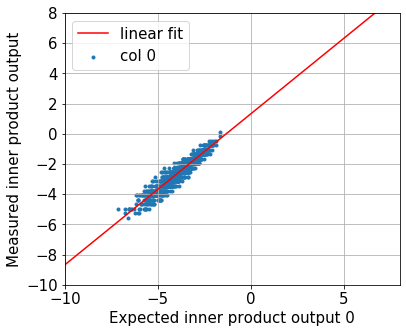

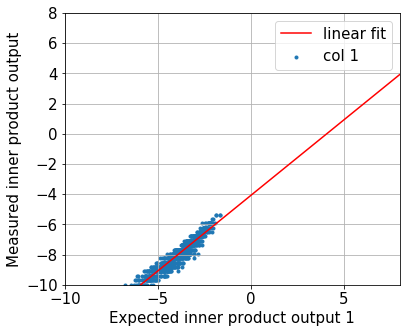

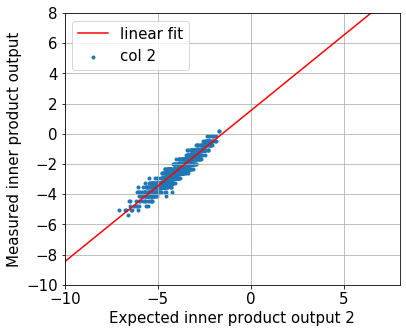

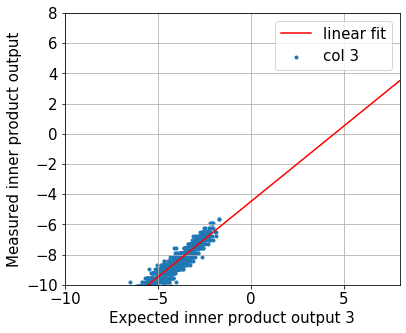

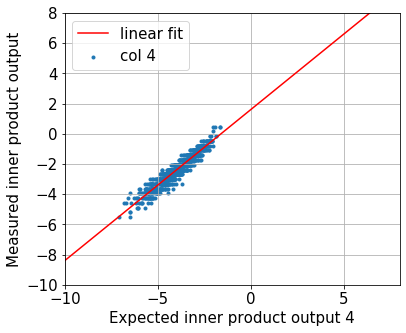

...

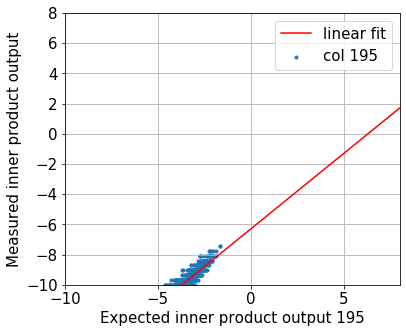

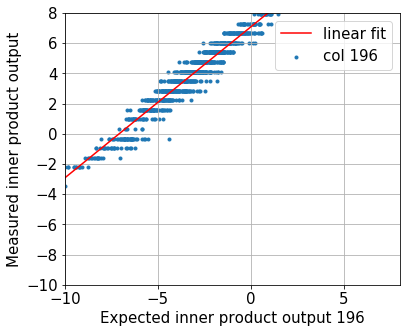

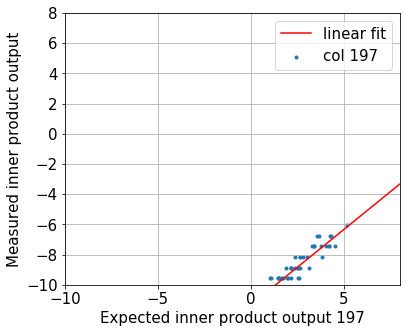

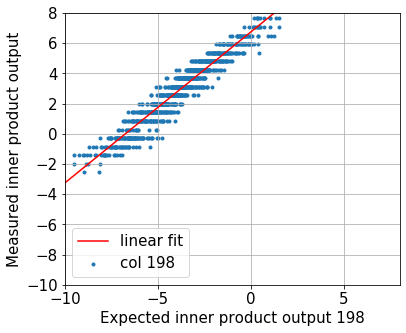

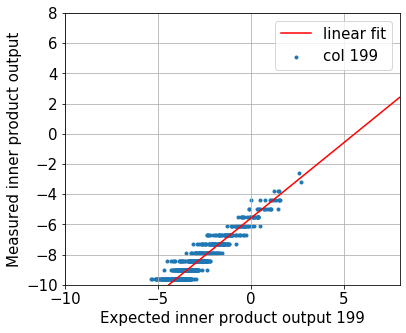

In [235]:
error = np.zeros(actual_outputs.shape[1])
slope = np.zeros(actual_outputs.shape[1])
intercept = np.zeros(actual_outputs.shape[1])
for c in range(actual_outputs.shape[1]):

    p, res, _, _, _ = np.polyfit(expected_outputs[:, c//2], actual_outputs[:, c], 1, full=True)
    y_fit = np.poly1d(p)
    x = np.arange(-600, 600, 0.1)
    slope[c] = p[0]
    intercept[c] = p[1]
    plt.rcParams.update({'font.size': 15})
    plt.figure(figsize=(6,5))
    plt.scatter(expected_outputs[:, c//2], actual_outputs[:, c]/p[0], label='col %d' % c, marker='.')
    plt.plot(x, y_fit(x)/p[0], 'r', label='linear fit')
    plt.grid()
    plt.xlim(-10, 8)
    plt.ylim(-10, 8)
    plt.xlabel('Expected inner product output %d' % c)
    plt.ylabel('Measured inner product output')
    plt.legend()
    error[c] = np.sqrt(res[0]) / np.abs(p[0])
    print(error[c])
print(error.mean())

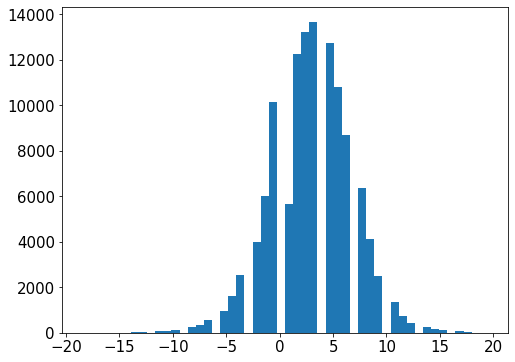

In [103]:
plt.figure(figsize=(8,6))
plt.hist(actual_outputs.flatten(), 50);

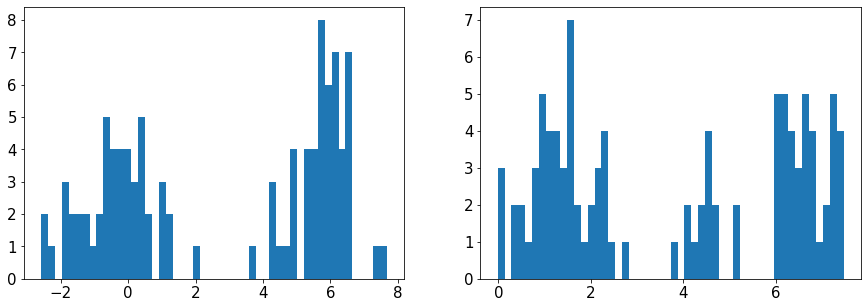

In [923]:
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.hist(intercept[0::2], 50);
plt.subplot(122)
plt.hist(intercept[1::2], 50);

In [234]:
slope = np.zeros(actual_outputs.shape[1])
intercept = np.zeros(actual_outputs.shape[1])
error = np.zeros(actual_outputs.shape[1])
for c in range(actual_outputs.shape[1]):
    p, res, _, _, _ = np.polyfit(expected_outputs[:, c//2], actual_outputs[:, c], 1, full=True)
    slope[c] = p[0]
    intercept[c] = p[1]
#     actual_outputs[:, c] = (actual_outputs[:, c] - p[1]) / p[0]
    error[c] = np.sqrt(res[0]) / np.abs(p[0])
print(error.mean())
print(error.max())
print(error.argmax())
error_rows = np.where(error > 100)[0]
print(error_rows)

11.967256074281076
19.28518032685441
172
[]


In [236]:
# Find the optimal voltage for each core

ITERATION = V_cal.shape[0]
BATCH = 10
FORWARD = True
vpos_list = np.arange(0.75, 0.805, 0.005)
vneg = 0.65
vreset_plus = 0.13
vreset_minus = 0.02
pulse_multiplier = 16

if FORWARD:
    dim = 200
else:
    dim = 120
slope = np.zeros([8, 2, len(vpos_list), dim])
intercept = np.zeros([8, 2, len(vpos_list), dim])
errors = np.zeros([8, 2, len(vpos_list), dim])

for segment_r in range(8):
    for segment_c in range(2):
        segment_idx = (np.arange(14) * 56 + segment_r // 4 * 28).reshape([14, 1]) + np.arange(7) * 4 + segment_r % 4
        segment_idx = segment_idx.flatten()
        if segment_r < 2:
            segment_idx = np.hstack([segment_idx, np.arange(2) + segment_r*2 + 784])
        else:
            segment_idx = np.append(segment_idx, 786 + segment_r)

        W_seg = W[segment_idx, WIDTH//2*segment_c : WIDTH//2*(segment_c+1)]
        a_seg = a[WIDTH//2*segment_c : WIDTH//2*(segment_c+1)] / 8 / num_a 
        b_seg = b[segment_idx] / 2 / num_b
        W_h = segment_idx.size * 2
        W_l = WIDTH
        
        core_mapping = weight_mapping_table[segment_r][segment_c]
        chip = core_mapping['chip']
        core_row = core_mapping['core_row']
        core_col = core_mapping['core_col']
        rows = core_mapping['rows']
        cols = core_mapping['cols']
        spi.enable_single_core(dev, core_row, core_col)
       
        for v, vpos in enumerate(vpos_list):
            if FORWARD:
                matmul.dac_setup(dev, vpos_bl=vpos, vneg_bl=vneg, vreset_plus=vreset_plus, vreset_minus=vreset_minus)
                inputs = H_cal[:, WIDTH//2*segment_c : WIDTH//2*(segment_c+1)]
                actual_outputs = np.zeros([ITERATION, W_h])
                expected_outputs = inputs.dot(W_seg.T) + b_seg * num_b
                for i in range(ITERATION//BATCH):
                    actual_outputs[BATCH*i:BATCH*(i+1), :] = matmul.matmul_01_partial_reset(dev, inputs[BATCH*i:BATCH*(i+1), :], rows, cols[:W_h], num_b, core_row, FORWARD, pulse_multiplier, col_addr=core_col, prep=(i==0))

            else:
                matmul.dac_setup(dev, vpos_sl=vpos, vneg_sl=vneg, vreset_plus=vreset_plus, vreset_minus=vreset_minus)
                inputs = V_cal[:, segment_idx]
                actual_outputs = np.zeros([ITERATION, W_l])
                expected_outputs = inputs.dot(W_seg) + a_seg * num_a
                for i in range(ITERATION//BATCH):
                    actual_outputs[BATCH*i:BATCH*(i+1), :] = matmul.matmul_01_partial_reset(dev, inputs[BATCH*i:BATCH*(i+1), :], cols, rows[:W_l], num_a, core_row, FORWARD, pulse_multiplier, col_addr=core_col, prep=(i==0))


            for j in range(actual_outputs.shape[1]):
                p, res, _, _, _ = np.polyfit(expected_outputs[:, j//2], actual_outputs[:, j], 1, full=True)
                slope[segment_r, segment_c, v, j] = p[0]
                intercept[segment_r, segment_c, v, j] = p[1]
                errors[segment_r, segment_c, v, j] = np.sqrt(res[0]) / np.abs(p[0])
#                 if p[0] < 0:
#                     print('negative slope %d, %d segment, %d column' % (segment_r, segment_c, cols[j]))
#                     errors[segment_r, segment_c, v, j] = np.inf

            print('Finished segment %d, %d, voltage %f' % (segment_r, segment_c, vpos))

matmul.disable_inference(dev)

Finished segment 0, 0, voltage 0.750000
Finished segment 0, 0, voltage 0.755000
Finished segment 0, 0, voltage 0.760000
Finished segment 0, 0, voltage 0.765000
Finished segment 0, 0, voltage 0.770000
Finished segment 0, 0, voltage 0.775000
Finished segment 0, 0, voltage 0.780000
Finished segment 0, 0, voltage 0.785000
Finished segment 0, 0, voltage 0.790000
Finished segment 0, 0, voltage 0.795000
Finished segment 0, 0, voltage 0.800000
Finished segment 0, 0, voltage 0.805000
Finished segment 0, 1, voltage 0.750000
Finished segment 0, 1, voltage 0.755000
Finished segment 0, 1, voltage 0.760000
Finished segment 0, 1, voltage 0.765000
Finished segment 0, 1, voltage 0.770000
Finished segment 0, 1, voltage 0.775000
Finished segment 0, 1, voltage 0.780000
Finished segment 0, 1, voltage 0.785000
Finished segment 0, 1, voltage 0.790000
Finished segment 0, 1, voltage 0.795000
Finished segment 0, 1, voltage 0.800000
Finished segment 0, 1, voltage 0.805000
Finished segment 1, 0, voltage 0.750000


In [200]:
print(errors.max(axis=3))
print(errors.argmax(axis=3))

[[[   62.64878195    42.77102579    33.04050166    32.33428817
      26.66354856    25.66036726    26.26767197    27.0067536
      27.52870892    28.63361678    31.31094988    35.28410769
      38.09775073    39.653898  ]
  [  500.78399898   344.5381194  14516.2856125    145.1459075
      66.95518541    40.49754913    27.41489271    23.33204695
      23.12808154    22.75125576    24.06357416    24.81719659
      23.17262151    24.31319592]]

 [[   38.58257518    26.66485851    21.94805653    22.08204609
      22.17429238    21.56568744    21.23728043    23.85203338
      27.05218131    29.86276678    32.0566443     36.02233823
      37.32840284    40.10354236]
  [   23.12077084    22.86439681    23.15106022    22.51473433
      23.28634149    22.5476738     23.11499109    23.66593402
      23.6988537     24.50938273    25.31352368    28.33496211
      29.41027087    33.42467092]]

 [[  103.91187972    49.4112337     31.70302956    26.29320783
      34.8200362     36.31386398    50.3611

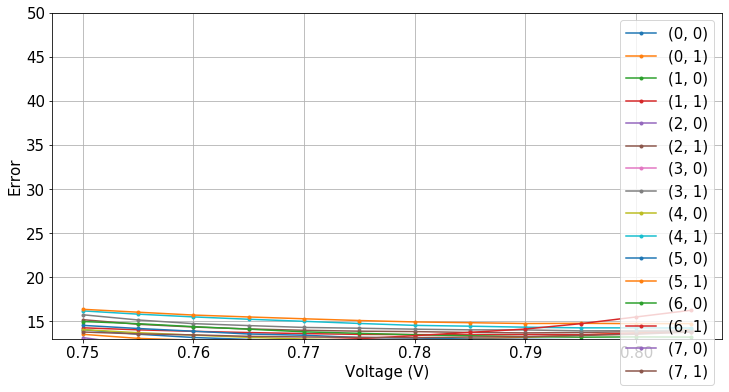

In [237]:
# vpos_list = np.arange(0.70, 0.90, 0.01)
plt.figure(figsize=(12,6))
for segment_r in range(8):
    for segment_c in range(2):
        plt.plot(vpos_list, errors[segment_r, segment_c, :, :].mean(axis=1), marker='.', label='(%d, %d)' % (segment_r, segment_c))
plt.xlabel('Voltage (V)')
plt.ylabel('Error')
# plt.xticks(vpos_list)
# plt.xlim(0.715, 0.885)
plt.ylim(13, 50)
plt.grid()
plt.legend(loc=1)

In [238]:
FORWARD = True
best_voltage_idx = np.argmin(errors.mean(axis=3), axis=2)
best_voltage = vpos_list[best_voltage_idx]
print(best_voltage)
print(np.min(errors.mean(axis=3), axis=2))
if FORWARD:
    vpos_best_forward = best_voltage
    pulse_multiplier_forward = pulse_multiplier
    slope_forward = np.zeros([8, 2, 200])
    intercept_forward = np.zeros([8, 2, 200])
    for r in range(8):
        for c in range(2):
            slope_forward[r, c, :] = slope[r, c, best_voltage_idx[r, c], :]
            intercept_forward[r, c, :] = intercept[r, c, best_voltage_idx[r, c], :]
else:
    vpos_best_backward = best_voltage
    pulse_multiplier_backward = pulse_multiplier
    slope_backward = np.zeros([8, 2, 120])
    intercept_backward = np.zeros([8, 2, 120])
    for r in range(8):
        for c in range(2):
            slope_backward[r, c, :] = slope[r, c, best_voltage_idx[r, c], :]
            intercept_backward[r, c, :] = intercept[r, c, best_voltage_idx[r, c], :]

[[0.79  0.77 ]
 [0.78  0.785]
 [0.775 0.79 ]
 [0.775 0.795]
 [0.795 0.805]
 [0.795 0.8  ]
 [0.795 0.755]
 [0.77  0.78 ]]
[[12.56053159 12.77217121]
 [12.09136045 13.46832284]
 [11.63522832 13.68880011]
 [11.7810863  13.91991992]
 [12.62050555 14.24044049]
 [12.9135953  14.73944383]
 [13.20171004 12.46568438]
 [11.77150975 13.15002505]]


In [239]:
np.savez(DATA_PATH + 'calibrate_forward_1', vpos_list=vpos_list, vneg=vneg, vreset_plus=vreset_plus, vreset_minus=vreset_minus, 
         pulse_multiplier=pulse_multiplier, slope=slope, intercept=intercept, errors=errors)

In [211]:
tmp = np.load(DATA_PATH + 'calibrate_forward_1.npz', allow_pickle=True)
vpos_list = tmp['vpos_list']
slope = tmp['slope']
intercept = tmp['intercept']
errors = tmp['errors']
pulse_multiplier = tmp['pulse_multiplier']
vneg = tmp['vneg']
vreset_plus = tmp['vreset_plus']
vreset_minus = tmp['vreset_minus']

# Inference

Finished infer step 0, segment 0, 0
Finished infer step 0, segment 0, 1
Finished infer step 0, segment 1, 0
Finished infer step 0, segment 1, 1
Finished infer step 0, segment 2, 0
Finished infer step 0, segment 2, 1
Finished infer step 0, segment 3, 0
Finished infer step 0, segment 3, 1
Finished infer step 0, segment 4, 0
Finished infer step 0, segment 4, 1
Finished infer step 0, segment 5, 0
Finished infer step 0, segment 5, 1
Finished infer step 0, segment 6, 0
Finished infer step 0, segment 6, 1
Finished infer step 0, segment 7, 0
Finished infer step 0, segment 7, 1
Finished generate step 0, segment 0, 0
Finished generate step 0, segment 0, 1
Finished generate step 0, segment 1, 0
Finished generate step 0, segment 1, 1
Finished generate step 0, segment 2, 0
Finished generate step 0, segment 2, 1
Finished generate step 0, segment 3, 0
Finished generate step 0, segment 3, 1
Finished generate step 0, segment 4, 0
Finished generate step 0, segment 4, 1
Finished generate step 0, segment 

Finished generate step 6, segment 4, 0
Finished generate step 6, segment 4, 1
Finished generate step 6, segment 5, 0
Finished generate step 6, segment 5, 1
Finished generate step 6, segment 6, 0
Finished generate step 6, segment 6, 1
Finished generate step 6, segment 7, 0
Finished generate step 6, segment 7, 1
Finished Gibbs step 6
Finished infer step 7, segment 0, 0
Finished infer step 7, segment 0, 1
Finished infer step 7, segment 1, 0
Finished infer step 7, segment 1, 1
Finished infer step 7, segment 2, 0
Finished infer step 7, segment 2, 1
Finished infer step 7, segment 3, 0
Finished infer step 7, segment 3, 1
Finished infer step 7, segment 4, 0
Finished infer step 7, segment 4, 1
Finished infer step 7, segment 5, 0
Finished infer step 7, segment 5, 1
Finished infer step 7, segment 6, 0
Finished infer step 7, segment 6, 1
Finished infer step 7, segment 7, 0
Finished infer step 7, segment 7, 1
Finished generate step 7, segment 0, 0
Finished generate step 7, segment 0, 1
Finished gen

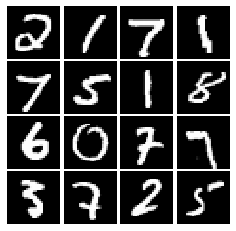

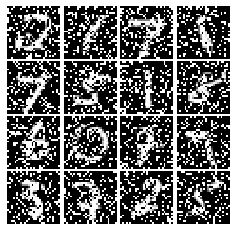

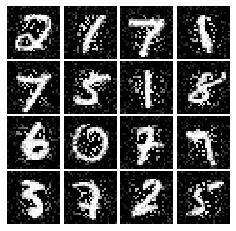

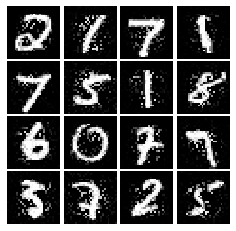

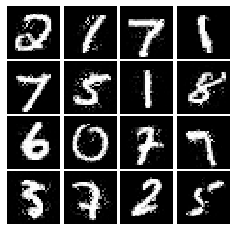

...

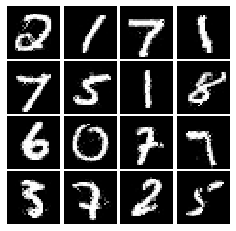

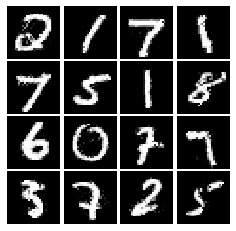

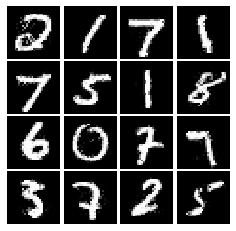

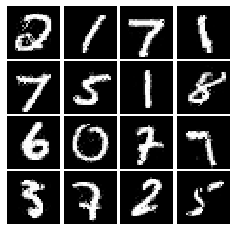

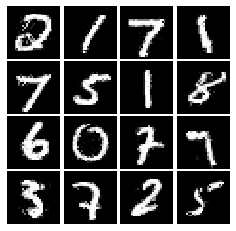

In [262]:
mb_size = 100
BATCH_SIZE = 10
GIBBS_STEPS = 10
LABEL = True
SIGM_T = 1.0
CORRUPT_PART = 'random'
RESTART = True
SAMPLE_VISIBLE = True
FIX_LABEL = True

length_d = 28
X_dim_d = int(length_d**2)
if LABEL:
    X_dim_d = X_dim_d + 10


H_steps = np.zeros([GIBBS_STEPS, mb_size, WIDTH])
V_steps = np.zeros([GIBBS_STEPS, mb_size, 794])
    
if RESTART:
    idx = np.random.choice(np.arange(X_test.shape[0]), size=mb_size, replace=False)
    X_mb = X_test[idx, :, :, :]
    y_mb = y_test[idx, :]
    X_mb = (reshape_flatten(X_mb, length_d)).astype(np.float)
    plot(X_mb[:16], length_d, 'V')
    if CORRUPT_PART == 'random':
        V, mask = corrupt_random(X_mb, 0.2)
    else:
        V = corrupt_partial(X_mb, loc=CORRUPT_PART, gray=np.mean(X_mb))
    plot(V[:16], length_d, 'V_corrupted')    
    if LABEL:
        if FIX_LABEL:
            label_vector = y_mb
        else:
            label_vector = 0.1 * np.ones([mb_size, 10])
        V = np.concatenate([V, label_vector], axis=1)


for g in range(GIBBS_STEPS):
    if SAMPLE_VISIBLE:
        V = sample(V).astype(np.float64)
    
    # TODO H = infer(V, W, a, sigm_T=SIGM_T)
    H = np.zeros([mb_size, WIDTH])
    for segment_r in range(8):
        for segment_c in range(2):
            segment_idx = (np.arange(14) * 56 + segment_r // 4 * 28).reshape([14, 1]) + np.arange(7) * 4 + segment_r % 4
            segment_idx = segment_idx.flatten()
            if segment_r < 2:
                segment_idx = np.hstack([segment_idx, np.arange(2) + segment_r*2 + 784])
            else:
                segment_idx = np.append(segment_idx, 786 + segment_r)

            W_h = segment_idx.size * 2
            W_l = WIDTH
            
            core_mapping = weight_mapping_table[segment_r][segment_c]
            chip = core_mapping['chip']
            core_row = core_mapping['core_row']
            core_col = core_mapping['core_col']
            rows = core_mapping['rows']
            cols = core_mapping['cols']
            spi.enable_single_core(dev, core_row, core_col)
            
            matmul.dac_setup(dev, vpos_sl=vpos_best_backward[segment_r, segment_c], vneg_sl=0.70, vreset_plus=0.12, vreset_minus=0.06)
            inputs = V[:, segment_idx]
            actual_outputs = np.zeros([mb_size, W_l])
            for i in range(mb_size//BATCH):
                actual_outputs[BATCH*i:BATCH*(i+1), :] = matmul.matmul_01_partial_reset(
                    dev, inputs[BATCH*i:BATCH*(i+1), :], cols, rows[:W_l], num_a, core_row, False, pulse_multiplier_backward,
                    col_addr=core_col, prep=(i==0))
            actual_outputs = (actual_outputs - intercept_backward[segment_r, segment_c, :W_l]) / slope_backward[segment_r, segment_c, :W_l]
            H[:, WIDTH//2*segment_c : WIDTH//2*(segment_c+1)] += (actual_outputs[:, 0::2] + actual_outputs[:, 1::2]) / 2
            print('Finished infer step %d, segment %d, %d' % (g, segment_r, segment_c))
    
#     H_steps[g] = H
    H = sample(sigm(H))
    H_steps[g] = H

    # TODO V = generate(H, W, b, sigm_T=SIGM_T)
    V = np.zeros([mb_size, 794])
    for segment_r in range(8):
        for segment_c in range(2):
            segment_idx = (np.arange(14) * 56 + segment_r // 4 * 28).reshape([14, 1]) + np.arange(7) * 4 + segment_r % 4
            segment_idx = segment_idx.flatten()
            if segment_r < 2:
                segment_idx = np.hstack([segment_idx, np.arange(2) + segment_r*2 + 784])
            else:
                segment_idx = np.append(segment_idx, 786 + segment_r)

            W_h = segment_idx.size * 2
            W_l = WIDTH
            
            core_mapping = weight_mapping_table[segment_r][segment_c]
            chip = core_mapping['chip']
            core_row = core_mapping['core_row']
            core_col = core_mapping['core_col']
            rows = core_mapping['rows']
            cols = core_mapping['cols']
            spi.enable_single_core(dev, core_row, core_col)
            
            matmul.dac_setup(dev, vpos_bl=vpos_best_forward[segment_r, segment_c], vneg_bl=0.65, vreset_plus=0.13, vreset_minus=0.02)
            inputs = H[:, WIDTH//2*segment_c : WIDTH//2*(segment_c+1)]
            actual_outputs = np.zeros([mb_size, W_h])
            for i in range(mb_size//BATCH):
                actual_outputs[BATCH*i:BATCH*(i+1), :] = matmul.matmul_01_partial_reset(
                    dev, inputs[BATCH*i:BATCH*(i+1), :], rows, cols[:W_h], num_b, core_row, True, pulse_multiplier_forward,
                    col_addr=core_col, prep=(i==0))
            actual_outputs = (actual_outputs - intercept_forward[segment_r, segment_c, :W_h]) / slope_forward[segment_r, segment_c, :W_h]
            V[:, segment_idx] += (actual_outputs[:, 0::2] + actual_outputs[:, 1::2]) / 2
            print('Finished generate step %d, segment %d, %d' % (g, segment_r, segment_c))

#     V_steps[g] = V
    V = sigm(V)
    if CORRUPT_PART == 'random':
         V = recover_random(V, X_mb, mask)
    else:
        V = recover_partial(V, X_mb, loc=CORRUPT_PART)
    if FIX_LABEL:
        V[:, int(length_d**2):] = y_mb

    V_steps[g] = V
    plot(V[:16,:int(length_d**2)], length_d, 'V')
    print('Finished Gibbs step %d' % g)

if LABEL:
    class_pred = np.argmax(V[:, X_dim_d-10:], axis=1)
#     print(class_pred)
    correct_pred = np.argmax(y_mb, axis=1)
    test_acc = np.sum(class_pred == correct_pred) / float(correct_pred.size)
    print('Test accuracy is %f' % test_acc)
#     V = V[:,:int(length_d**2)]

err = np.mean(np.linalg.norm(V[:,:int(length_d**2)] - X_mb, axis=1))
print('Reconstruction error is %f' % err)
# plot(V[:16,:int(length_d**2)], length_d, 'V')

In [269]:
np.savez(DATA_PATH + 'recover_random', H_steps=H_steps, V_steps=V_steps, idx=idx, mask=mask)

In [3]:
tmp = np.load(DATA_PATH + 'recover_bottom.npz', allow_pickle=True)
V_bottom = tmp['V_steps']

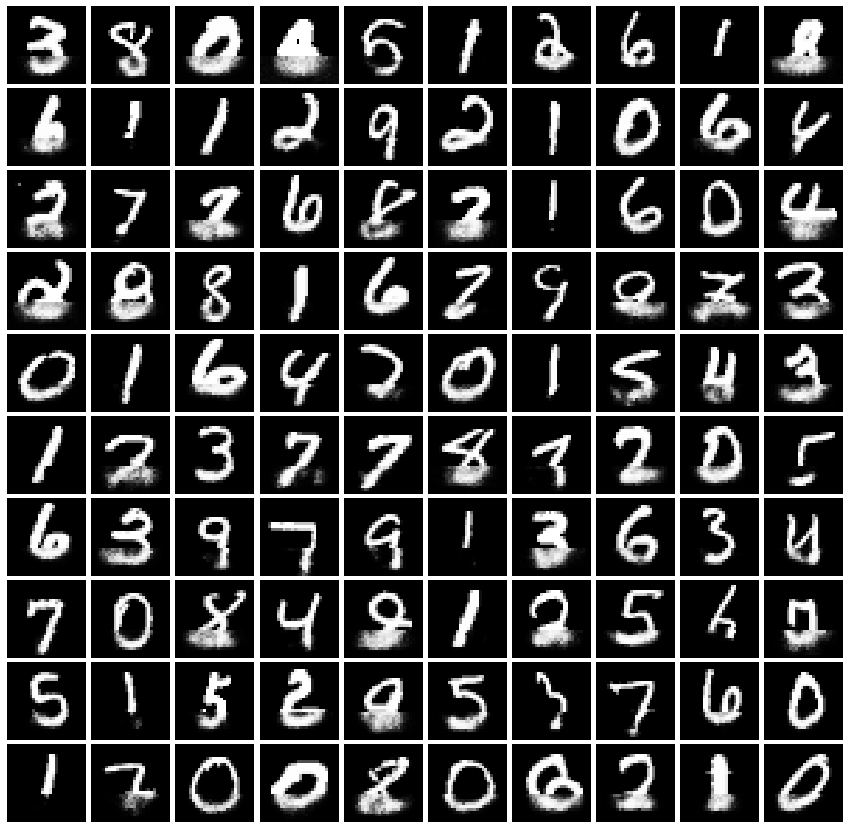

In [300]:
plot_shape(V_bottom[-1, :100, :int(length_d**2)], length_d, (15, 15), (10,10))

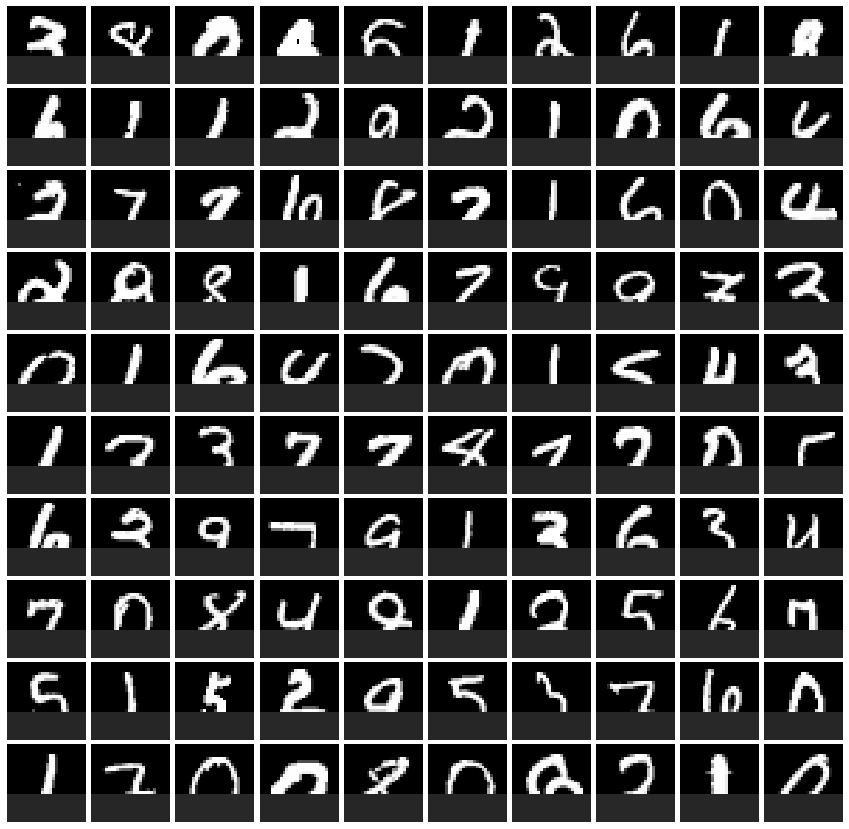

In [299]:
# X_mb = X_test[idx, :, :, :]
# X_mb = (reshape_flatten(X_mb, length_d)).astype(np.float)
# V_corrupted, _ = corrupt_random(X_mb, 0.2, mask=mask)
V_corrupted = corrupt_partial(V_bottom[0, :100, :int(length_d**2)], loc='bottom', gray=np.mean(X_test))
plot_shape(V_corrupted[:, :int(length_d**2)], length_d, (15, 15), (10,10))

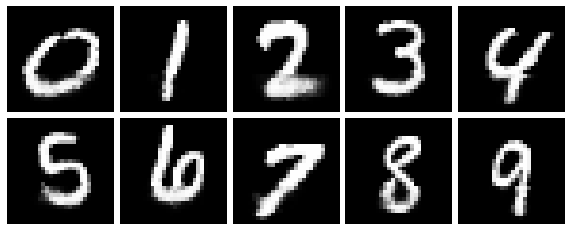

In [304]:
# selected_idx = [93, 17, 94, 85, 64, 65, 8, 23, 37, 78]
selected_idx = [40, 41, 57, 52, 43, 80, 23, 54, 32, 14]
plot_shape(V_bottom[-1, selected_idx, :int(length_d**2)], length_d, (10, 4), (2, 5))

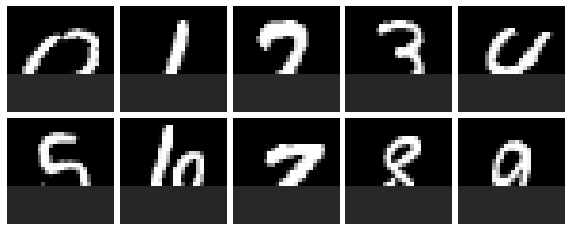

In [303]:
# V_corrupted, _ = corrupt_random(X_mb, 0.2, mask=mask)
plot_shape(V_corrupted[selected_idx, :int(length_d**2)], length_d, (10, 4), (2, 5))